# Agentic SegFormer-B2 Framework for Landslide Segmentation using Multi-Temporal InSAR Data

## Overview

This work presents an Agentic SegFormer-B2 framework for automatic landslide segmentation using multi-temporal InSAR imagery. The objective is to accurately identify landslide regions while reducing manual intervention during model optimization through an intelligent agent-assisted training strategy.

The proposed framework combines:

* SegFormer-B2 Transformer Architecture
* Multi-Temporal InSAR Data
* Phase Decomposition
* Hybrid BCE + Dice Loss
* Agentic Training Framework
* Adaptive Learning Rate Control
* Dynamic Dice Weight Adjustment

---

## Dataset Preparation

The dataset consists of:

* Coherence Images
* Phase Images
* Ground Truth Segmentation Masks

The dataset is organized into three temporal baselines:

* 6 Days
* 12 Days
* 18 Days

Each baseline contains data from four geographic regions:

* EcrinPark
* OutsideTheBox
* QueyrasPark
* Vanoise

### Phase Representation

To preserve the periodic nature of phase information, phase values were decomposed into:

* Cos(Phase)
* Sin(Phase)

The final three-channel input becomes:

[Coherence, Cos(Phase), Sin(Phase)]

This representation improves learning stability and reduces phase discontinuity effects.

---

## Data Augmentation

To improve generalization and reduce overfitting, the following augmentations were applied during training:

* Horizontal Flip
* Vertical Flip
* RandomRotate90
* Transpose

These transformations increase sample diversity and improve robustness to spatial variations.

---

## Dataset Split

The complete dataset contains 13,230 samples.

| Dataset    | Ratio |
| ---------- | ----- |
| Training   | 70%   |
| Validation | 15%   |
| Testing    | 15%   |

Resulting samples:

| Dataset    | Samples |
| ---------- | ------- |
| Training   | 9,261   |
| Validation | 1,984   |
| Testing    | 1,985   |

---

## SegFormer-B2 Architecture

The backbone model used is:

nvidia/segformer-b2-finetuned-ade-512-512

### Architectural Modifications

The original SegFormer-B2 architecture was modified by introducing:

* Binary Segmentation Head
* Dropout Layer (p = 0.10)
* Bilinear Upsampling Layer
* Output Resolution = 100 × 100

### Explicit Dropout Layer

A Dropout2D layer was added after decoder logits:

Decoder Logits → Dropout → Bilinear Upsampling → Final Prediction

This helps reduce overfitting and improves generalization performance.

---

## Hybrid Loss Function

A hybrid loss strategy was adopted to improve segmentation quality.

### Binary Cross Entropy Loss

Optimizes pixel-level classification accuracy.

### Dice Loss

Optimizes overlap between predicted and ground-truth masks.

### Final Loss Function

Hybrid Loss =
0.50 × BCE Loss
+
0.50 × Dice Loss

### Benefits

* Better overlap optimization
* Improved segmentation quality
* Better handling of class imbalance
* Stable convergence

---

## Agentic Training Framework

An intelligent training agent was integrated into the optimization loop.

The agent continuously monitors:

* Validation Loss
* Validation Dice Score
* Validation IoU Score

### Agent Decisions

#### Learning Rate Adaptation

When validation loss increases:

Learning Rate = Learning Rate × 0.8

#### Dynamic Dice Weight Adjustment

When IoU performance decreases:

Dice Weight += 0.05

BCE Weight = 1 − Dice Weight

This shifts optimization toward region-level segmentation quality.

#### Dynamic Threshold Adjustment

When:

Recall < 0.60

Threshold = 0.45

This helps recover missed landslide pixels.

---

## Optimization Strategy

| Parameter               | Value             |
| ----------------------- | ----------------- |
| Optimizer               | AdamW             |
| Initial Learning Rate   | 1e-4              |
| Weight Decay            | 1e-4              |
| Scheduler               | ReduceLROnPlateau |
| Epochs                  | 70                |
| Early Stopping Patience | 25                |
| Gradient Clipping       | 1.0               |

---

## Evaluation Metrics

The framework was evaluated using:

### Accuracy

Measures overall pixel classification correctness.

### Precision

Measures correctness of predicted landslide pixels.

### Recall

Measures the ability to detect actual landslide regions.

### Dice Score

Measures segmentation overlap quality.

### IoU Score

Measures region-level agreement between prediction and ground truth masks.

---

## Temporal Baseline Analysis

After training, an additional temporal baseline analysis was conducted using:

* 6-Day Baseline
* 12-Day Baseline
* 18-Day Baseline

For each region, identical samples were evaluated across different temporal baselines.

The following metrics were analyzed:

* Mean Coherence
* Phase Standard Deviation
* Dice Score
* IoU Score
* Ground Truth Area
* Predicted Area
* Area Difference

The objective was to investigate how temporal baselines influence segmentation performance.

---

## Visual Analysis

To improve interpretability, qualitative analysis was performed on model outputs.

Each prediction includes:

* Input Coherence Image
* Ground Truth Mask
* Predicted Mask
* Probability Heatmap
* Overlay Visualization

This enables both visual and quantitative assessment of landslide behavior.

---

# Results Summary

The proposed Agentic SegFormer-B2 framework achieved strong and stable performance for landslide segmentation using multi-temporal InSAR data.


## Best Training Results

| Metric          | Value  |
| --------------- | ------ |
| Accuracy        | 98.60% |
| Precision       | 82.17% |
| Recall          | 80.56% |
| Dice Score      | 80.70% |
| IoU Score       | 68.41% |
| Validation Loss | 0.1342 |



## Best Validation Results

| Metric          | Value  |
| --------------- | ------ |
| Accuracy        | 98.60% |
| Precision       | 82.17% |
| Recall          | 80.56% |
| Dice Score      | 80.70% |
| IoU Score       | 68.41% |
| Validation Loss | 0.1342 |

---

## Key Findings

* SegFormer-B2 successfully learned landslide patterns from multi-temporal InSAR data.
* Phase decomposition improved representation of interferometric phase information.
* Hybrid BCE + Dice Loss improved segmentation quality.
* Agentic training reduced manual hyperparameter tuning.
* Adaptive learning rate control improved training stability.
* Dynamic Dice weighting enhanced overlap-based optimization.
* Temporal baseline analysis revealed performance variations across 6-day, 12-day, and 18-day intervals.
* Visual analysis improved model interpretability.

---

## Conclusion

The proposed Agentic SegFormer-B2 framework successfully integrates transformer-based semantic segmentation with intelligent training adaptation for landslide detection using multi-temporal InSAR data.

By combining phase decomposition, hybrid loss optimization, adaptive thresholding, automated agent decisions, and temporal baseline analysis, the framework achieves robust segmentation performance while improving training efficiency and model interpretability.

The results demonstrate the potential of agent-assisted deep learning systems for remote sensing, geospatial monitoring, and automated landslide assessment.


# Complete Agentic SegFormer-B2 Training Pipeline

```text
┌──────────────────────────────────────────┐
│ Multi-Temporal InSAR Dataset             │
│                                          │
│ • 6 Days                                 │
│ • 12 Days                                │
│ • 18 Days                                │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Dataset Components                       │
│                                          │
│ • Coherence Images                       │
│ • Phase Images                           │
│ • Ground Truth Masks                     │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Phase Decomposition                      │
│                                          │
│ Phase → Cos(Phase)                       │
│ Phase → Sin(Phase)                       │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Input Construction                       │
│                                          │
│ Channel 1 → Coherence                    │
│ Channel 2 → Cos(Phase)                   │
│ Channel 3 → Sin(Phase)                   │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Channel-wise Normalization               │
│                                          │
│ Mean = 0                                 │
│ Std = 1                                  │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Data Augmentation                        │
│                                          │
│ • Horizontal Flip                        │
│ • Vertical Flip                          │
│ • RandomRotate90                         │
│ • Transpose                              │
└──────────────────────────────────────────┘
                    │
                    ▼

══════════════════════════════════════════════
          SEGFORMER-B2 ARCHITECTURE
══════════════════════════════════════════════

                    │
                    ▼
┌──────────────────────────────────────────┐
│ Transformer Encoder                      │
│                                          │
│ • Hierarchical Features                  │
│ • Global Context Learning                │
│ • Efficient Self-Attention               │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Multi-Scale Feature Extraction           │
│                                          │
│ Stage 1 Features                         │
│ Stage 2 Features                         │
│ Stage 3 Features                         │
│ Stage 4 Features                         │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ SegFormer Decoder Head                   │
│                                          │
│ Multi-Scale Feature Fusion               │
│ Binary Segmentation Output               │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Decoder Logits                           │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Dropout2D (p = 0.10)                     │
│                                          │
│ Regularization Layer                     │
│ Overfitting Prevention                   │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Bilinear Upsampling                      │
│                                          │
│ Output Resolution: 100 × 100             │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Predicted Landslide Mask                 │
└──────────────────────────────────────────┘
                    │
                    ▼

══════════════════════════════════════════════
            HYBRID LOSS ENGINE
══════════════════════════════════════════════

                    │
                    ▼
┌──────────────────────────────────────────┐
│ BCE Loss                                 │
│                                          │
│ Pixel-Level Classification               │
└──────────────────────────────────────────┘
                    │
                    ├────────────┐
                    ▼            │
┌──────────────────────────────────────────┐
│ Dice Loss                                │
│                                          │
│ Region Overlap Optimization              │
└──────────────────────────────────────────┘
                    │            ▲
                    └─────┬──────┘
                          │
                          ▼
┌──────────────────────────────────────────┐
│ Hybrid Loss                              │
│                                          │
│ 0.50 × BCE                               │
│ +                                        │
│ 0.50 × Dice                              │
└──────────────────────────────────────────┘
                    │
                    ▼

══════════════════════════════════════════════
           AGENTIC TRAINING LAYER
══════════════════════════════════════════════

                    │
                    ▼
┌──────────────────────────────────────────┐
│ Agent Monitoring System                  │
│                                          │
│ Monitors:                                │
│ • Validation Loss                        │
│ • Validation Dice Score                  │
│ • Validation IoU Score                   │
└──────────────────────────────────────────┘
                    │
                    ▼

       ┌─────────────────────────┐
       │ Agent Decision Engine   │
       └─────────────────────────┘
                    │
        ┌───────────┼───────────┐
        │           │           │
        ▼           ▼           ▼

┌──────────────┐ ┌──────────────┐ ┌──────────────┐
│ Reduce LR    │ │ Increase     │ │ Adjust       │
│              │ │ Dice Weight  │ │ Threshold    │
└──────────────┘ └──────────────┘ └──────────────┘

Condition 1:
Validation Loss Increases

Action:
Learning Rate = Learning Rate × 0.8


Condition 2:
Validation IoU Decreases

Action:
Dice Weight += 0.05
BCE Weight = 1 − Dice Weight


Condition 3:
Recall < 0.60

Action:
Threshold = 0.45


Condition 4:
Stable Performance

Action:
Continue Training

                    │
                    ▼

══════════════════════════════════════════════
       OPTIMIZATION & STABILIZATION
══════════════════════════════════════════════

┌──────────────────────────────────────────┐
│ AdamW Optimizer                          │
│                                          │
│ LR = 1e-4                                │
│ Weight Decay = 1e-4                      │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ ReduceLROnPlateau Scheduler              │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Gradient Clipping                        │
│                                          │
│ Max Norm = 1.0                           │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Early Stopping                           │
│                                          │
│ Patience = 25 Epochs                     │
└──────────────────────────────────────────┘
                    │
                    ▼

══════════════════════════════════════════════
               EVALUATION
══════════════════════════════════════════════

┌──────────────────────────────────────────┐
│ Accuracy                                 │
│ Precision                                │
│ Recall                                   │
│ Dice Score                               │
│ IoU Score                                │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Final Landslide Segmentation             │
│ Performance Evaluation                   │
└──────────────────────────────────────────┘

                    │
                    ▼

══════════════════════════════════════════════
         POST-TRAINING ANALYSIS
══════════════════════════════════════════════

┌──────────────────────────────────────────┐
│ Temporal Baseline Analysis               │
│                                          │
│ • 6 Days                                 │
│ • 12 Days                                │
│ • 18 Days                                │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Region-wise Analysis                     │
│                                          │
│ • EcrinPark                              │
│ • OutsideTheBox                          │
│ • QueyrasPark                            │
│ • Vanoise                                │
└──────────────────────────────────────────┘
                    │
                    ▼
┌──────────────────────────────────────────┐
│ Visual Output Analysis                   │
│                                          │
│ Input                                    │
│ Ground Truth                             │
│ Prediction                               │
│ Heatmap                                  │
│ Overlay                                  │
└──────────────────────────────────────────┘
```

## One-Line Workflow

```text
Multi-Temporal InSAR Dataset
        ↓
Phase Decomposition
        ↓
3-Channel Input Construction
        ↓
Normalization
        ↓
Data Augmentation
        ↓
SegFormer-B2 Encoder
        ↓
Multi-Scale Feature Fusion
        ↓
SegFormer Decoder
        ↓
Dropout2D (0.10)
        ↓
Bilinear Upsampling
        ↓
Predicted Landslide Mask
        ↓
Hybrid BCE + Dice Loss
        ↓
Agentic Monitoring Layer
        ↓
Adaptive LR / Dice Weight / Threshold
        ↓
AdamW Optimization
        ↓
Evaluation Metrics
        ↓
Final Landslide Segmentation
        ↓
Temporal & Visual Analysis
```


In [1]:
import os
import random

import cv2

import tifffile as tiff

import numpy as np

import matplotlib.pyplot as plt

import albumentations as A
from torch.utils.data import Dataset

from collections import deque

import torch


import torch.nn as nn

import torch.nn.functional as F
from torch.utils.data import random_split

from torch.utils.data import Dataset

from torch.utils.data import DataLoader

from transformers import (

    SegformerForSemanticSegmentation

)

from sklearn.metrics import (

    confusion_matrix,

    ConfusionMatrixDisplay

)

In [2]:
device = torch.device(

    "cuda"

    if torch.cuda.is_available()

    else

    "cpu"

)

print(

    "Device:",

    device

)

Device: cuda


In [3]:
root_dir = "/kaggle/input/datasets/rishikeshgopal45/landslide-insar-isslide/ReadyToBeUsedDataset"

print(

    "Dataset Path:",

    root_dir

)

Dataset Path: /kaggle/input/datasets/rishikeshgopal45/landslide-insar-isslide/ReadyToBeUsedDataset


## Defining Data Augmentation

This cell defines the augmentation pipeline for the training data using `albumentations`.

The applied augmentations are:
- Horizontal Flip
- Vertical Flip
- RandomRotate90
- Transpose

These transformations help improve generalization and reduce overfitting.

In [4]:
train_transform = A.Compose([

    A.HorizontalFlip(

        p=0.5

    ),

    A.VerticalFlip(

        p=0.5

    ),

    A.RandomRotate90(

        p=1.0

    ),

    A.Transpose(

        p=0.5

    )

])

val_transform = None

test_transform = None

## Defining the Custom Dataset Class

This class loads the multi-temporal InSAR dataset for landslide segmentation.  
It collects coherence images, phase images, and corresponding masks from the `6days`, `12days`, and `18days` folders.

For each sample, it creates a 3-channel input using **coherence**, **cos(phase)**, and **sin(phase)**, applies optional transformations, normalizes the channels, and returns the image and mask as PyTorch tensors.

In [5]:
class SegFormerDataset(Dataset):

    def __init__(
        self,
        root_dir,
        regions=None,
        transform=None
    ):

        self.samples = []   # list to store all valid dataset samples

        self.transform = transform   # augmentation / transformation pipeline

        # temporal baseline folders present in the dataset
        temporal_folders = [

            "6days",

            "12days",

            "18days"

        ]

        # loop through each temporal baseline - phle jayega 6 dyas wala, then 12 then 18 days .. one by one folder 
        for temporal in temporal_folders:

            temporal_path = os.path.join(

                root_dir,

                temporal

            )

            # loop through each region inside the temporal folder - sabhi resaons ko check ko one by one use krega.
            for region in sorted(

                os.listdir(

                    temporal_path

                )

            ):

                # if specific regions are provided, skip other regions - but hum sb location ko use kr rhe h 
                if (

                    regions is not None

                    and

                    region not in regions

                ):

                    continue

                region_path = os.path.join(

                    temporal_path,

                    region

                )

                # get all the folders inside the region - regioke andr wale folder if avl
                folders = os.listdir(

                    region_path

                )

                # loop through each sample folder
                for folder in folders:

                    # skip the segmentation parent folder -Because Segmentations is not a sample folder. 
                    #It is the folder that contains masks.
                    if folder == "Segmentations":

                        continue

                    # path of coherence image folder
                    coh_path = os.path.join(

                        region_path,

                        folder,

                        "coherence"

                    )

                    # path of phase image folder
                    phase_path = os.path.join(

                        region_path,

                        folder,

                        "phase"

                    )

                    # path of corresponding segmentation mask folder
                    mask_path = os.path.join(

                        region_path,

                        "Segmentations",

                        folder

                    )

                    # skip if any required folder is missing
                    if not (

                        os.path.exists(coh_path)

                        and

                        os.path.exists(phase_path)

                        and

                        os.path.exists(mask_path)

                    ):

                        continue

                    # get all coherence image files
                    files = sorted(

                        os.listdir(

                            coh_path

                        )

                    )

                    # loop through each tif file
                    for file in files:

                        if file.endswith(".tif"):

                            # store temporal baseline, region, coherence path, phase path, and mask path
                            self.samples.append(

                                (

                                    temporal,

                                    region,

                                    os.path.join(

                                        coh_path,

                                        file

                                    ),

                                    os.path.join(

                                        phase_path,

                                        file

                                    ),

                                    os.path.join(

                                        mask_path,

                                        file

                                    )

                                )

                            )

        # print total number of collected samples
        print(

            "Samples:",

            len(self.samples)

        )

    def __len__(self):

        # return total number of samples
        return len(

            self.samples

        )

    def __getitem__(

        self,

        idx

    ):

        # get file paths of one sample
        temporal, region, coh_file, phase_file, mask_file = self.samples[idx]

        # read coherence image
        coherence = tiff.imread(

            coh_file

        ).astype(

            np.float32

        )

        # read phase image
        phase = tiff.imread(

            phase_file

        ).astype(

            np.float32

        )

        # read segmentation mask
        mask = tiff.imread(

            mask_file

        ).astype(

            np.float32

        )

        # decompose phase into cosine and sine components (very very important)
        cos_phase = np.cos(

            phase

        )

        sin_phase = np.sin(

            phase

        )

        # create 3-channel input: [coherence, cos(phase), sin(phase)]
        #Meaning:
             #height = H
             #width = W
             #3 channels
             #This is exactly the input to SegFormer.


        image = np.stack(

            [
                coherence,

                cos_phase,

                sin_phase
            ],

            axis=-1 

            #because axis=-1 puts channels at the end.
            #This changes dimension order to:

                #old axis 2 → new axis 0
                #old axis 0 → new axis 1
                #old axis 1 → new axis 2

        )

        # apply augmentation / transformation if provided
        if self.transform is not None:

            transformed = self.transform(

                image=image,

                mask=mask

            )

            image = transformed["image"]

            mask = transformed["mask"]

        # convert image from HWC to CHW format for PyTorch - Because PyTorch convolution layers expect input as (channels, height, width)
        image = np.transpose(

            image,

            (2, 0, 1)

        )

        # ensure image datatype is float32 - PyTorch models usually expect float32
        image = image.astype(

            np.float32

        )

        # normalize each channel independently
        for c in range(

            image.shape[0]

        ):

            image[c] = (

                image[c]

                -

                image[c].mean()

            ) / (

                image[c].std()

                +

                1e-8

            )

        # add channel dimension to mask -> (1, H, W)
        mask = np.expand_dims(

            mask,

            axis=0

        )

        # return image tensor and mask tensor
        return (

            torch.tensor(

                image,

                dtype=torch.float32

            ),

            torch.tensor(

                mask,

                dtype=torch.float32

            )

        )

## Splitting the Dataset

This cell splits the dataset into:
- **70% training**
- **15% validation**
- **15% testing**

A fixed random seed is used so that the split remains reproducible.

In [6]:
# create the full dataset using all samples without augmentation
full_dataset = SegFormerDataset(

    root_dir,

    regions=None,

    transform=None

)

# total number of samples in the complete dataset
total_size = len(full_dataset)

# 70% of the dataset will be used for training
train_size = int(

    0.70 * total_size

)

# 15% of the dataset will be used for validation
val_size = int(

    0.15 * total_size

)

# remaining 15% of the dataset will be used for testing
test_size = (total_size - train_size - val_size)

# randomly split the full dataset into train, validation, and test subsets
# manual seed is used so that the split remains the same every time

train_subset, val_subset, test_subset = random_split(

    full_dataset,

    [
        train_size,

        val_size,

        test_size
    ],

    generator=torch.Generator().manual_seed(
        42
    )

)

# create the training dataset using training indices and apply train augmentation
train_dataset = torch.utils.data.Subset(

    SegFormerDataset(

        root_dir,

        regions=None,

        transform=train_transform #yes, agumenation is there present in the ... training part 
    ),
    train_subset.indices
)

# create the validation dataset using validation indices without augmentation
val_dataset = torch.utils.data.Subset(

    SegFormerDataset(

        root_dir,

        regions=None,

        transform=None #here no agumentation in val. 

    ),

    val_subset.indices

)

# create the test dataset using test indices without augmentation
test_dataset = torch.utils.data.Subset(

    SegFormerDataset(

        root_dir,

        regions=None,

        transform=None # no agumentatin also in test

    ),

    test_subset.indices

)

# print number of samples in training set
print(

    "Train Samples:",

    len(train_dataset)

)

# print number of samples in validation set
print(

    "Validation Samples:",

    len(val_dataset)

)

# print number of samples in test set
print(

    "Test Samples:",

    len(test_dataset)

)

Samples: 13230
Samples: 13230
Samples: 13230
Samples: 13230
Train Samples: 9261
Validation Samples: 1984
Test Samples: 1985


## Creating Train, Validation, and Test Subsets

This cell creates separate dataset subsets for training, validation, and testing.

- **Training set** uses augmentation
- **Validation set** uses original data
- **Test set** uses original data

In [7]:
# create DataLoader for training dataset
# shuffle=True is used so training samples are mixed in every epoch
train_loader = DataLoader(

    train_dataset,

    batch_size=8,

    shuffle=True,

    num_workers=2

)

# create DataLoader for validation dataset
# shuffle=False because validation data should remain fixed
val_loader = DataLoader(

    val_dataset,

    batch_size=8,

    shuffle=False,

    num_workers=2

)

# create DataLoader for test dataset
# shuffle=False because test data is only used for final evaluation
test_loader = DataLoader(

    test_dataset,

    batch_size=8,

    shuffle=False,

    num_workers=2

)

print("\n")

# print number of samples in training set
print(

    "Train Samples:",

    len(train_dataset)

)

# print number of samples in validation set
print(

    "Validation Samples:",

    len(val_dataset)

)

# print number of samples in test set
print(

    "Test Samples:",

    len(test_dataset)

)



Train Samples: 9261
Validation Samples: 1984
Test Samples: 1985


In [8]:
# define the SegFormer-based segmentation model
class SegFormerModel(nn.Module):

    def __init__(self):

        super().__init__()

        # load pretrained SegFormer-B2 model
        # num_labels=1 because this is a binary segmentation task
        # ignore_mismatched_sizes=True allows replacing the original classifier head
        
        self.segformer = SegformerForSemanticSegmentation.from_pretrained(

            "nvidia/segformer-b2-finetuned-ade-512-512", 
            
            #a pretrained SegFormer-B2 segmentation model from Hugging Face.
            #This model was originally trained for semantic segmentation on the ADE20K dataset.
            #So instead of training from scratch, you are doing transfer learning / fine-tuning.

            num_labels=1, # the model only needs one output channel. - binary form either 0 or 1.

            ignore_mismatched_sizes=True #replace the old segmentation head with a new one for your task- 
            #kynki orginall AEDK20K iss datatset me output -channel 150 tha .. so i have to use the only 1. 

        )

        # dropout layer for regularization to reduce overfitting
        self.dropout = nn.Dropout2d(
            p=0.10
        )

    def forward(self, x):

        # pass input images through SegFormer - how input goes through the model.
        outputs = self.segformer(
            pixel_values=x
        )

        # get raw output logits from the model - raw predicted segmentation scores before sigmoid.
        logits = outputs.logits

        # apply dropout on logits
        logits = self.dropout(
            logits
        )

        # resize output to match target mask size (100 x 100) - Bilinear
        logits = F.interpolate(

            logits,

            size=(100,100),

            mode="bilinear", #This uses bilinear interpolation for smooth resizing of 2D feature maps.

            align_corners=False

        )

        # return final segmentation logit
        return logits


# create model object and move it to the selected device
model = SegFormerModel().to(device)

# confirmation message after loading the model
print("Model Loaded Successfully")

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/110M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/380 [00:00<?, ?it/s]

SegformerForSemanticSegmentation LOAD REPORT from: nvidia/segformer-b2-finetuned-ade-512-512
Key                           | Status   |                                                                                                   
------------------------------+----------+---------------------------------------------------------------------------------------------------
decode_head.classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 768, 1, 1]) vs model:torch.Size([1, 768, 1, 1])
decode_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([1])                      

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


model.safetensors:   0%|          | 0.00/110M [00:00<?, ?B/s]

Model Loaded Successfully


In [9]:
# take one batch from the training dataloader
sample_batch = next(
    iter(train_loader)
)

# separate the batch into input images and masks
images, masks = sample_batch

# move input images to the selected device (GPU/CPU)
images = images.to(device)

# disable gradient calculation because this is only a shape check / forward pass
with torch.no_grad():

    # pass the images through the model
    outputs = model(images)

# print shape of the input batch
print(

    "Input Shape :",

    images.shape

)

# print shape of the model output
print(

    "Output Shape:",

    outputs.shape

)

Input Shape : torch.Size([8, 3, 100, 100])
Output Shape: torch.Size([8, 1, 100, 100])


In [10]:
# define an agent class to monitor validation performance during training
class TrainingAgent:

    def __init__(self):

        # store best IoU score seen so far
        self.best_iou = 0

        # store best Dice score seen so far
        self.best_dice = 0

        # keep the last 5 validation records for trend analysis
        self.history = deque(
            maxlen=5
        )

    def analyze(

        self,

        val_loss,

        val_iou,

        val_dice,

        optimizer

    ):

        # save current validation loss, IoU, and Dice in history
        self.history.append(

            (

                val_loss,

                val_iou,

                val_dice

            )

        )

        # if history has less than 5 entries, do nothing and stay in warmup phase
        if len(self.history) < 5:

            return "warmup"

        # extract validation losses from history
        losses = [

            x[0]

            for x in self.history

        ]

        # extract validation IoU values from history
        ious = [

            x[1]

            for x in self.history

        ]

        # if validation loss has increased compared to earlier history, reduce learning rate
        if losses[-1] > losses[0]:

            for param_group in optimizer.param_groups:

                param_group["lr"] *= 0.8

            return "reduce_lr"

        # if validation IoU has decreased, suggest increasing Dice loss weight
        elif ious[-1] < ious[0]:

            return "increase_dice_weight"

        # otherwise continue training normally
        else:

            return "continue"

In [11]:
bce_weight = 0.50

dice_weight = 0.50



In [12]:
# define Dice loss function for segmentation overlap measurement
def dice_loss(

    pred,

    target

):

    # apply sigmoid to convert logits into probabilities
    pred = torch.sigmoid(
        pred
    )

    # small value added to avoid division by zero
    smooth = 1e-8

    # compute overlap between prediction and target
    intersection = (

        pred * target

    ).sum()

    # compute total predicted area + ground truth area
    union = (

        pred.sum()

        +

        target.sum()

    )

    # calculate Dice score
    dice = (

        2 * intersection + smooth

    ) / (

        union + smooth

    )

    # Dice loss = 1 - Dice score
    return 1 - dice

In [13]:
bce_loss = nn.BCEWithLogitsLoss()

## Defining Dice Loss

This cell defines the **Dice loss** function, which measures the overlap between the predicted segmentation mask and the ground-truth mask.  
It is useful for segmentation tasks because it directly focuses on region-level similarity between prediction and target.

In [14]:
# define the hybrid loss function combining BCE loss and Dice loss
def hybrid_loss(

    pred,

    target

):

    # compute binary cross entropy loss
    bce = bce_loss(

        pred,

        target

    )

    # compute Dice loss
    dice = dice_loss(

        pred,

        target

    )

    # combine BCE loss and Dice loss using their respective weights
    total_loss = (

        bce_weight * bce

        +

        dice_weight * dice

    )

    # return the final hybrid loss
    return total_loss

## Defining Hybrid Loss

This cell defines the **hybrid loss function** used for training.  
It combines **Binary Cross Entropy (BCE) loss** and **Dice loss** so that the model learns both **pixel-level accuracy** and **region-level overlap**.

In [15]:
optimizer = torch.optim.AdamW(

    model.parameters(),

    lr=1e-4,

    weight_decay=1e-4

)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(

    optimizer,

    mode="min",

    factor=0.5,

    patience=5

)

agent = TrainingAgent()

print(

    "Optimizer, Scheduler and Agent Ready"

)

Optimizer, Scheduler and Agent Ready


## Calculating Evaluation Metrics

- This cell defines a function to compute all important segmentation metrics.
- The model output is first converted into probabilities using **sigmoid**.
- A threshold is applied to convert probabilities into a **binary mask**.
- It calculates:
  - **Accuracy**
  - **Precision**
  - **Recall**
  - **F1 Score**
  - **Dice Score**
  - **IoU Score**
- These metrics are used to evaluate how well the model predicts landslide regions.

In [16]:
# define a function to calculate all important segmentation metrics
def calculate_all_metrics(

    pred,

    target,

    threshold=0.5

):

    # apply sigmoid to convert logits into probabilities
    pred = torch.sigmoid(
        pred
    )

    # convert probabilities into binary predictions using threshold
    pred = (
        pred > threshold
    ).float()

    # True Positives: correctly predicted landslide pixels
    TP = (

        pred * target

    ).sum()

    # True Negatives: correctly predicted background pixels
    TN = (

        (1-pred)

        *

        (1-target)

    ).sum()

    # False Positives: predicted landslide but actually background
    FP = (

        pred

        *

        (1-target)

    ).sum()

    # False Negatives: missed landslide pixels
    FN = (

        (1-pred)

        *

        target

    ).sum()

    # overall pixel-wise accuracy
    accuracy = (

        TP + TN

    ) / (

        TP + TN + FP + FN + 1e-8

    )

    # precision = out of predicted positive pixels, how many are correct
    precision = TP / (

        TP + FP + 1e-8

    )

    # recall = out of actual positive pixels, how many are detected
    recall = TP / (

        TP + FN + 1e-8

    )

    # F1 score = harmonic mean of precision and recall
    f1 = (

        2 * TP

    ) / (

        2 * TP + FP + FN + 1e-8

    )

    # Dice score is same as F1 score in binary segmentation
    dice = f1

    # IoU score = overlap between predicted and ground-truth positive regions
    iou = TP / (

        TP + FP + FN + 1e-8

    )

    # return all metrics as Python scalar values
    return (

        accuracy.item(),

        precision.item(),

        recall.item(),

        f1.item(),

        dice.item(),

        iou.item()

    )

## Training, Validation, and Agent-Based Optimization

- This cell runs the complete **training and validation loop** for the SegFormer model.
- During training:
  - the model processes training batches
  - computes hybrid loss
  - updates weights using backpropagation
  - tracks training accuracy, precision, and recall
- During validation:
  - the model is evaluated on the validation set
  - loss, accuracy, precision, recall, F1, Dice, and IoU are computed
- The **training agent** monitors validation performance and can:
  - reduce learning rate
  - increase Dice loss weight
  - adjust prediction threshold
- The best model is saved based on validation loss.
- Early stopping is used to stop training when validation loss does not improve for many epochs.
- At the end, a final training summary is printed.

In [17]:
# lists to store training loss and training metrics for each epoch
train_losses = []

train_acc = []
train_prec = []
train_rec = []

# lists to store validation loss and validation metrics for each epoch
val_losses = []

val_acc = []
val_prec = []
val_rec = []

val_f1 = []
val_dice = []
val_iou = []

# total number of training epochs - earlier it was 200 , but it was good for this training methods
epochs = 75

# best validation loss seen so far
best_loss = float("inf")

# early stopping patience
patience = 25

# counter to track epochs without improvement
counter = 0

# initial threshold for converting probabilities into binary predictions
threshold = 0.5

# main training loop over all epochs
for epoch in range(epochs):

    # ==========================================
    # TRAINING
    # ==========================================

    # set model to training mode
    model.train()

    # variables to accumulate training loss and metrics
    total_loss = 0

    correct = 0
    total = 0

    TP = 0
    FP = 0
    FN = 0

    print(f"\nEpoch {epoch+1}/{epochs}")

    # loop over training batches
    for i, (images, masks) in enumerate(train_loader):

        # move images and masks to GPU / CPU
        images = images.to(device)

        masks = masks.to(device)

        # clear old gradients
        optimizer.zero_grad()

        # forward pass
        outputs = model(images)

        # compute hybrid loss
        loss = hybrid_loss(
            outputs,
            masks
        )

        # backpropagation
        loss.backward()

        # clip gradients to avoid exploding gradients
        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            1.0
        )

        # update model parameters
        optimizer.step()

        # add batch loss to total loss
        total_loss += loss.item()

        # convert logits to probabilities
        pred = torch.sigmoid(outputs)

        # convert probabilities into binary predictions
        pred_bin = (
            pred > threshold
        ).float()

        # count correct predicted pixels
        correct += (
            pred_bin == masks
        ).sum().item()

        # count total number of pixels
        total += masks.numel()

        # accumulate TP, FP, FN for precision and recall
        TP += (
            pred_bin * masks
        ).sum().item()

        FP += (
            pred_bin * (1 - masks)
        ).sum().item()

        FN += (
            (1 - pred_bin) * masks
        ).sum().item()

        # compute training progress percentage
        progress = (
            (i + 1)
            /
            len(train_loader)
        ) * 100

        # print batch progress and current batch loss
        print(
            f"\rProgress: {progress:.2f}% | Loss: {loss.item():.4f}",
            end=""
        )

    # ==========================================
    # TRAIN METRICS
    # ==========================================

    # compute epoch-level training accuracy
    acc = correct / total

    # compute epoch-level training precision
    precision = TP / (
        TP + FP + 1e-8
    )

    # compute epoch-level training recall
    recall = TP / (
        TP + FN + 1e-8
    )

    # store training loss and metrics
    train_losses.append(
        total_loss / len(train_loader)
    )

    train_acc.append(acc)

    train_prec.append(
        precision
    )

    train_rec.append(
        recall
    )

    # ==========================================
    # VALIDATION
    # ==========================================

    # set model to evaluation mode
    model.eval()

    # variables to accumulate validation loss and metrics
    v_loss = 0

    v_acc = 0
    v_prec = 0
    v_rec = 0

    v_f1 = 0
    v_dice = 0
    v_iou = 0

    count = 0

    # no gradient calculation during validation
    with torch.no_grad():

        # loop over validation batches
        for images, masks in val_loader:

            # move validation data to device
            images = images.to(device)

            masks = masks.to(device)

            # forward pass
            outputs = model(images)

            # compute validation loss
            loss = hybrid_loss(
                outputs,
                masks
            )

            # add batch validation loss
            v_loss += loss.item()

            # compute all validation metrics for this batch
            a, p, r, f1, d, i = calculate_all_metrics(
                outputs,
                masks,
                threshold
            )

            # accumulate validation metrics
            v_acc += a
            v_prec += p
            v_rec += r

            v_f1 += f1
            v_dice += d
            v_iou += i

            count += 1

    # store average validation loss and metrics of current epoch
    val_losses.append(
        v_loss / count
    )

    val_acc.append(
        v_acc / count
    )

    val_prec.append(
        v_prec / count
    )

    val_rec.append(
        v_rec / count
    )

    val_f1.append(
        v_f1 / count
    )

    val_dice.append(
        v_dice / count
    )

    val_iou.append(
        v_iou / count
    )

 # ==========================================
    # AGENT DECISION
    # ==========================================

    # ask the training agent to analyze validation performance
    decision = agent.analyze(

        val_losses[-1],

        val_iou[-1],

        val_dice[-1],

        optimizer

    )

    # if IoU is dropping, increase Dice loss weight
    if decision == "increase_dice_weight":

        dice_weight = min(
            dice_weight + 0.05,
            0.90
        )

        bce_weight = (
            1 - dice_weight
        )

    # if validation recall becomes too low, reduce threshold to capture more positives
    if val_rec[-1] < 0.60:

        threshold = 0.45

    # step the scheduler using validation loss
    scheduler.step(
        val_losses[-1]
    )

    # ==========================================
    # PRINT METRICS
    # ==========================================

    print("\n")

    print("=" * 70)

    print(
        f"Epoch {epoch+1}/{epochs}"
    )

    print("=" * 70)

    # print training metrics
    print(
        f"Train Loss      : {train_losses[-1]:.4f}"
    )

    print(
        f"Train Accuracy  : {train_acc[-1]:.4f}"
    )

    print(
        f"Train Precision : {train_prec[-1]:.4f}"
    )

    print(
        f"Train Recall    : {train_rec[-1]:.4f}"
    )

    print()

    # print validation metrics
    print(
        f"Val Loss        : {val_losses[-1]:.4f}"
    )

    print(
        f"Val Accuracy    : {val_acc[-1]:.4f}"
    )

    print(
        f"Val Precision   : {val_prec[-1]:.4f}"
    )

    print(
        f"Val Recall      : {val_rec[-1]:.4f}"
    )

    print(
        f"Val F1          : {val_f1[-1]:.4f}"
    )

    print(
        f"Val Dice        : {val_dice[-1]:.4f}"
    )

    print(
        f"Val IoU         : {val_iou[-1]:.4f}"
    )

    print()

    # print current optimization settings
    print(
        f"Current LR      : {optimizer.param_groups[0]['lr']:.8f}"
    )

    print(
        f"Threshold       : {threshold:.2f}"
    )

    print(
        f"BCE Weight      : {bce_weight:.2f}"
    )

    print(
        f"Dice Weight     : {dice_weight:.2f}"
    )

    print(
        f"Agent Decision  : {decision}"
    )

    print("=" * 70)

    # ==========================================
    # MODEL SAVING
    # ==========================================

    # save model if current validation loss is the best so far
    if val_losses[-1] < best_loss:

        best_loss = val_losses[-1]

        counter = 0

        torch.save(

            model.state_dict(),

            "segformer_best.pth"

        )

        print(
            "\nModel Saved!"
        )

    else:

        # increase early stopping counter if validation loss does not improve
        counter += 1

        print(
            f"\nEarly Stop Counter: {counter}/{patience}"
        )

        # stop training if patience limit is reached
        if counter >= patience:

            print(
                "\nEarly Stopping Triggered"
            )

            break

# ==========================================
# FINAL TRAINING SUMMARY
# ==========================================

print("\n")

print("=" * 80)

print("FINAL TRAINING SUMMARY")

print("=" * 80)

# print best validation loss achieved during training
print(
    f"Best Validation Loss : {best_loss:.4f}"
)

print()

# print final training metrics
print(
    f"Final Train Accuracy : {train_acc[-1]:.4f}"
)

print(
    f"Final Train Precision: {train_prec[-1]:.4f}"
)

print(
    f"Final Train Recall   : {train_rec[-1]:.4f}"
)

print()

# print final validation metrics
print(
    f"Final Val Accuracy   : {val_acc[-1]:.4f}"
)

print(
    f"Final Val Precision  : {val_prec[-1]:.4f}"
)

print(
    f"Final Val Recall     : {val_rec[-1]:.4f}"
)

print(
    f"Final Val F1         : {val_f1[-1]:.4f}"
)

print(
    f"Final Val Dice       : {val_dice[-1]:.4f}"
)

print(
    f"Final Val IoU        : {val_iou[-1]:.4f}"
)

print("=" * 80)


Epoch 1/75
Progress: 100.00% | Loss: 0.4481

Epoch 1/75
Train Loss      : 0.4060
Train Accuracy  : 0.9647
Train Precision : 0.5704
Train Recall    : 0.5909

Val Loss        : 0.2371
Val Accuracy    : 0.9733
Val Precision   : 0.6353
Val Recall      : 0.7159
Val F1          : 0.6587
Val Dice        : 0.6587
Val IoU         : 0.5021

Current LR      : 0.00010000
Threshold       : 0.50
BCE Weight      : 0.50
Dice Weight     : 0.50
Agent Decision  : warmup

Model Saved!

Epoch 2/75
Progress: 100.00% | Loss: 0.1790

Epoch 2/75
Train Loss      : 0.3464
Train Accuracy  : 0.9725
Train Precision : 0.6776
Train Recall    : 0.6352

Val Loss        : 0.2470
Val Accuracy    : 0.9666
Val Precision   : 0.5468
Val Recall      : 0.8239
Val F1          : 0.6437
Val Dice        : 0.6437
Val IoU         : 0.4862

Current LR      : 0.00010000
Threshold       : 0.50
BCE Weight      : 0.50
Dice Weight     : 0.50
Agent Decision  : warmup

Early Stop Counter: 1/25

Epoch 3/75
Progress: 100.00% | Loss: 0.4766



## Evaluating the Best Model on the Validation Set

- This cell loads the **best saved model** from training.
- The model is switched to **evaluation mode**.
- It runs the model on the **validation dataset**.
- For each validation batch, it computes:
  - Accuracy
  - Precision
  - Recall
  - F1 Score
  - Dice Score
  - IoU Score
- Finally, it prints the **average validation performance** of the best model.

In [18]:
# load the best saved model weights from training
model.load_state_dict(

    torch.load(

        "segformer_best.pth"

    )

)

# set the model to evaluation mode
model.eval()

# variables to store summed validation metrics
acc = 0
prec = 0
rec = 0

f1_total = 0
dice_total = 0
iou_total = 0

# counter to count number of validation batches
count = 0

# loop through validation dataset
for images, masks in val_loader:

    # move images and masks to device
    images = images.to(device)

    masks = masks.to(device)

    # disable gradient calculation during evaluation
    with torch.no_grad():

        # get model predictions
        pred = model(images)

        # calculate all evaluation metrics for the batch
        a,p,r,f1,d,i = calculate_all_metrics(

            pred,

            masks

        )

        # accumulate validation metrics
        acc += a
        prec += p
        rec += r

        f1_total += f1
        dice_total += d
        iou_total += i

        count += 1

# print average validation results
print("\nVALIDATION RESULTS\n")

print("Validation Accuracy :", acc/count)

print("Validation Precision:", prec/count)

print("Validation Recall   :", rec/count)

print("Validation F1 Score :", f1_total/count)

print("Validation Dice     :", dice_total/count)

print("Validation IoU      :", iou_total/count)


VALIDATION RESULTS

Validation Accuracy : 0.987044504332927
Validation Precision: 0.8263431797104497
Validation Recall   : 0.82577129152994
Validation F1 Score : 0.820981100441948
Validation Dice     : 0.820981100441948
Validation IoU      : 0.7030049739105086


## Testing the Model and Plotting the Confusion Matrix

- This cell evaluates the trained model on the **test dataset**.
- It computes the average:
  - Accuracy
  - Precision
  - Recall
  - F1 Score
  - Dice Score
  - IoU Score
- It also stores all predicted and ground-truth labels.
- Using these labels, a **confusion matrix** is generated.
- The confusion matrix helps visualize how well the model separates **landslide** and **non-landslide** pixels.


FINAL TEST RESULTS

Test Accuracy : 0.9864615958378496
Test Precision: 0.8268618306002943
Test Recall   : 0.8317406193080198
Test F1 Score : 0.822635760867452
Test Dice     : 0.822635760867452
Test IoU      : 0.7059368985484403


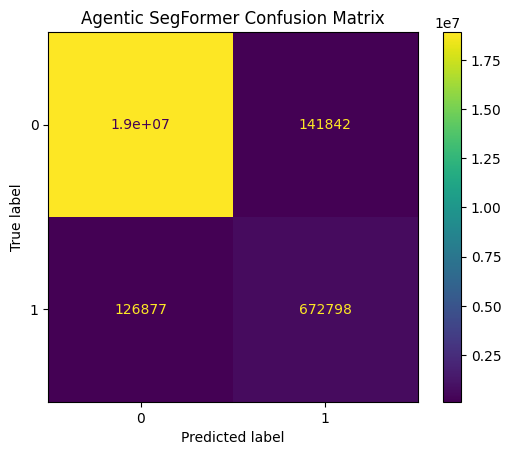

In [19]:
# set the model to evaluation mode
model.eval()

# variables to store summed test metrics
acc = 0
prec = 0
rec = 0

f1_total = 0
dice_total = 0
iou_total = 0

# counter to count number of test batches
count = 0

# lists to store all predicted and ground-truth labels for confusion matrix
all_preds = []
all_targets = []

# loop through test dataset
for images, masks in test_loader:

    # move images and masks to device
    images = images.to(device)

    masks = masks.to(device)

    # disable gradient calculation during testing
    with torch.no_grad():

        # get model predictions
        pred = model(images)

        # compute all test metrics for the batch
        a,p,r,f1,d,i = calculate_all_metrics(

            pred,

            masks

        )

        # accumulate test metrics
        acc += a
        prec += p
        rec += r

        f1_total += f1
        dice_total += d
        iou_total += i

        count += 1

        # convert model output into binary predictions
        pred_bin = (

            torch.sigmoid(pred)

            > 0.5

        ).cpu().numpy().flatten()

        # flatten ground-truth masks
        target_bin = masks.cpu().numpy().flatten()

        # store predictions and targets for confusion matrix
        all_preds.extend(

            pred_bin

        )

        all_targets.extend(

            target_bin

        )

# print average test results
print("\nFINAL TEST RESULTS\n")

print("Test Accuracy :", acc/count)

print("Test Precision:", prec/count)

print("Test Recall   :", rec/count)

print("Test F1 Score :", f1_total/count)

print("Test Dice     :", dice_total/count)

print("Test IoU      :", iou_total/count)

# compute confusion matrix using all test predictions and targets
cm = confusion_matrix(

    all_targets,

    all_preds

)

# display confusion matrix
ConfusionMatrixDisplay(

    cm

).plot()

plt.title(

    "Agentic SegFormer Confusion Matrix"

)

plt.show()

## Plotting Training Metrics

- This cell plots the training performance across epochs.
- It shows four graphs:
  - **Loss vs Epoch**
  - **Accuracy vs Epoch**
  - **Precision vs Epoch**
  - **Recall vs Epoch**
- These plots help visualize how the model improves during training.

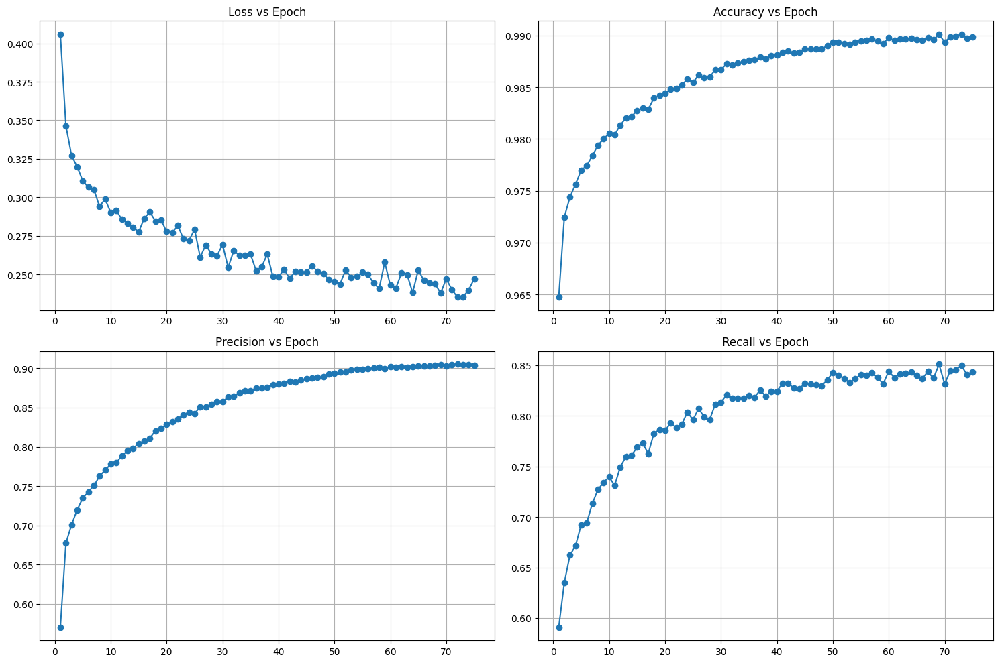

In [20]:
# create a range of epoch numbers based on training history length
epochs_range = range(

    1,

    len(train_losses)+1

)

# create a figure for plotting training metrics
plt.figure(figsize=(15,10))

# ================= LOSS =================

# plot training loss vs epoch
plt.subplot(2,2,1)

plt.plot(

    epochs_range,

    train_losses,

    marker='o'

)

plt.title(

    "Loss vs Epoch"

)

plt.grid()

# ================= ACCURACY =================

# plot training accuracy vs epoch
plt.subplot(2,2,2)

plt.plot(

    epochs_range,

    train_acc,

    marker='o'

)

plt.title(

    "Accuracy vs Epoch"

)

plt.grid()

# ================= PRECISION =================

# plot training precision vs epoch
plt.subplot(2,2,3)

plt.plot(

    epochs_range,

    train_prec,

    marker='o'

)

plt.title(

    "Precision vs Epoch"

)

plt.grid()

# ================= RECALL =================

# plot training recall vs epoch
plt.subplot(2,2,4)

plt.plot(

    epochs_range,

    train_rec,

    marker='o'

)

plt.title(

    "Recall vs Epoch"

)

plt.grid()

# adjust subplot spacing and display the plots
plt.tight_layout()

plt.show()

## Plotting Training and Validation Metrics

- This cell visualizes the model performance across epochs.
- It plots:
  - **Training vs Validation Accuracy**
  - **Training vs Validation Precision**
  - **Training vs Validation Recall**
  - **Validation F1 Score**
  - **Validation Dice Score**
  - **Validation IoU Score**
  - **Training vs Validation Loss**
- These graphs help analyze learning behavior and compare training and validation performance.

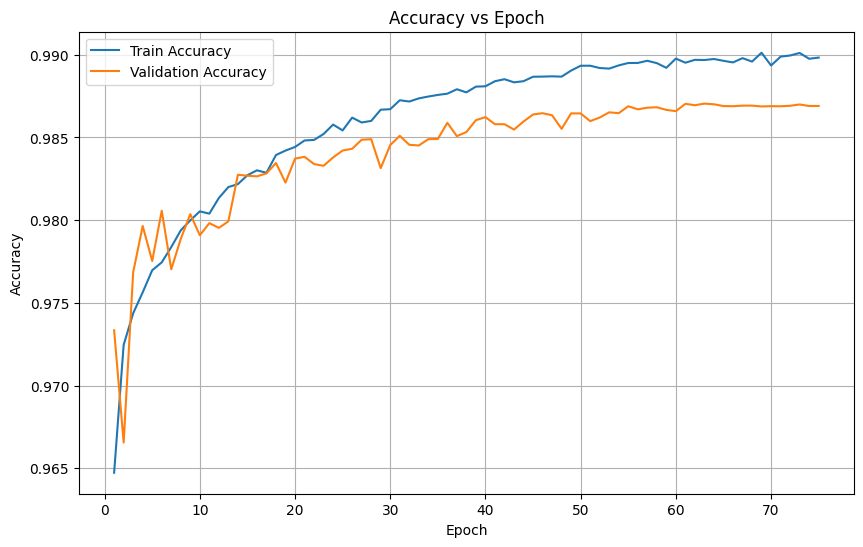

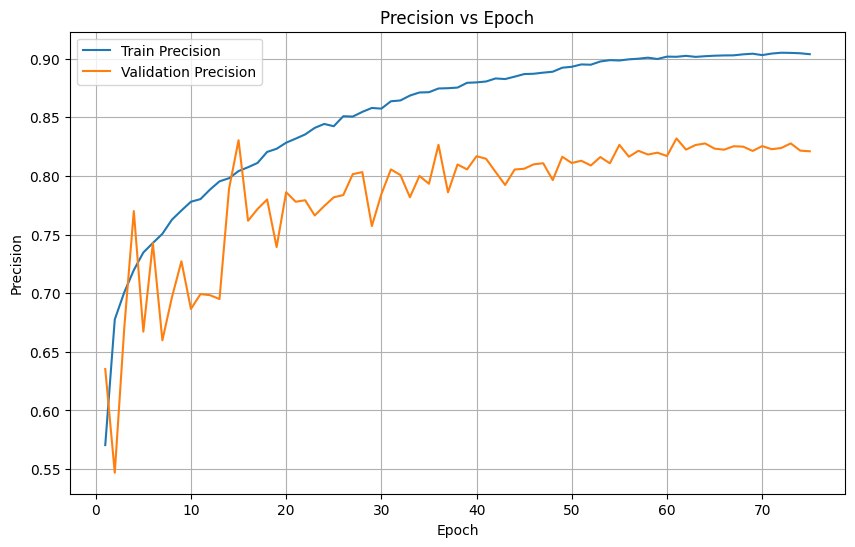

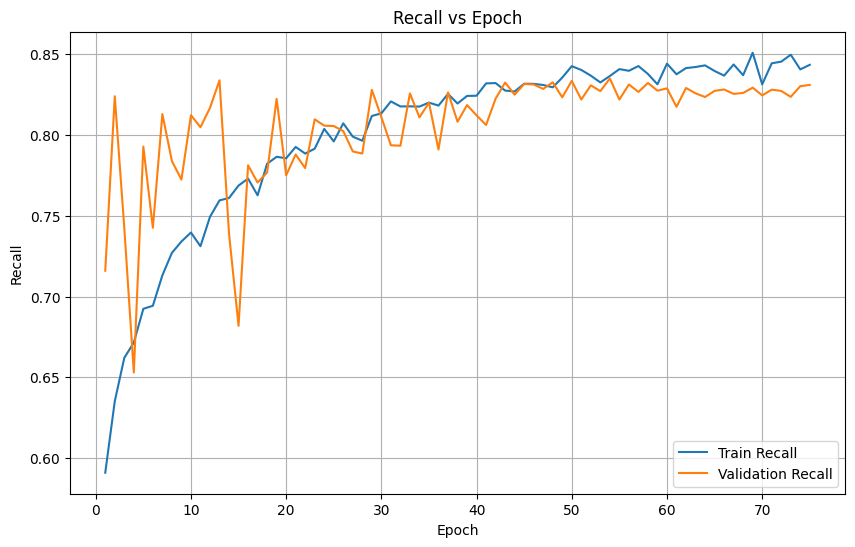

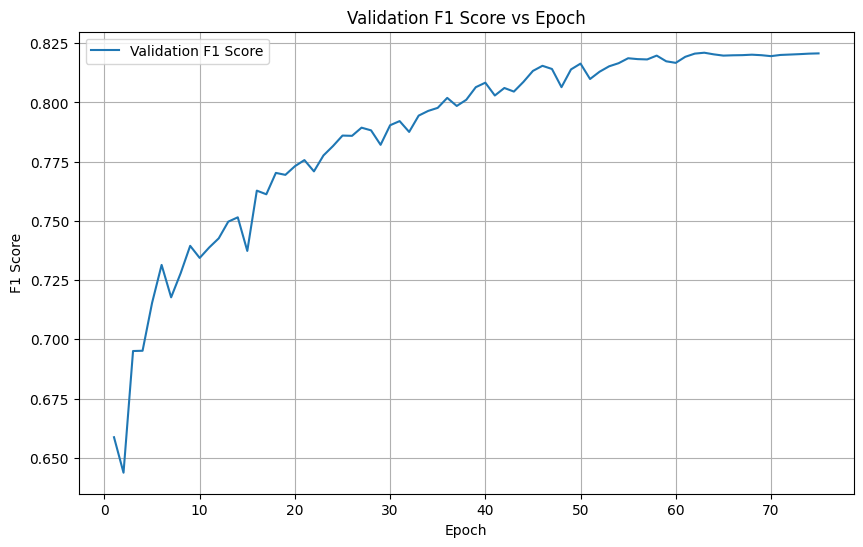

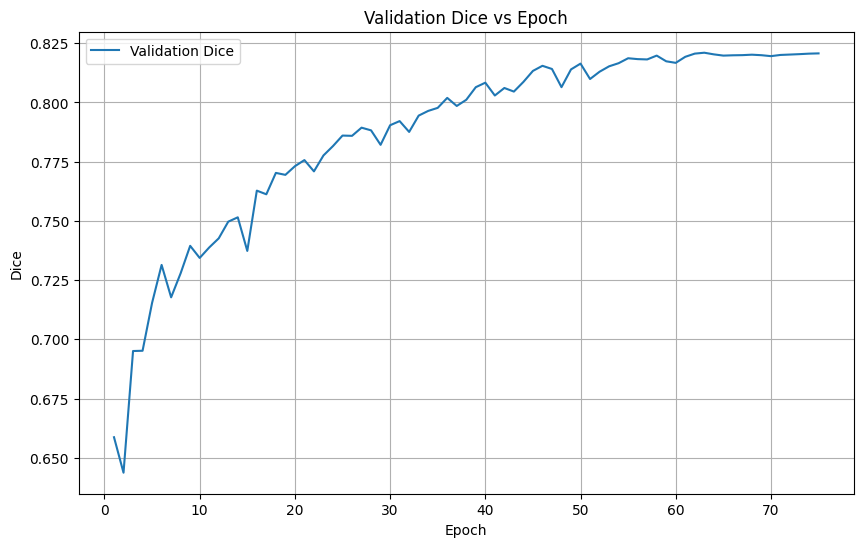

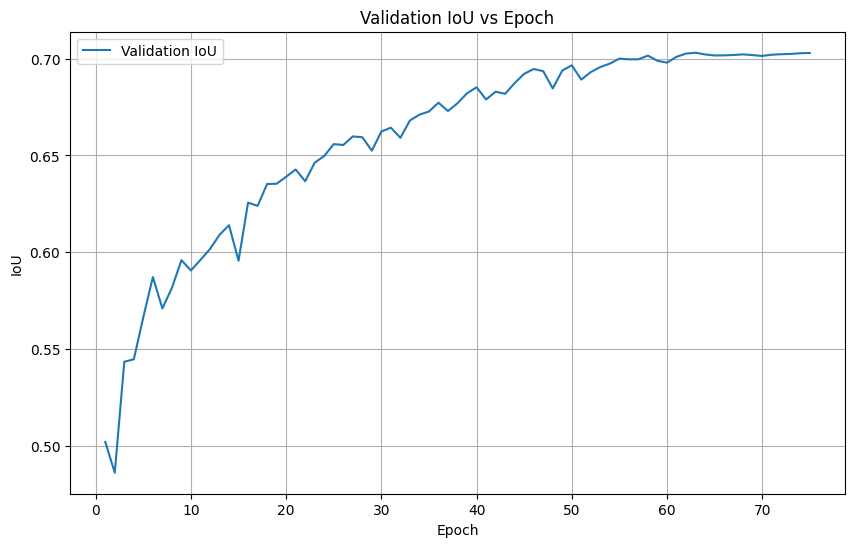

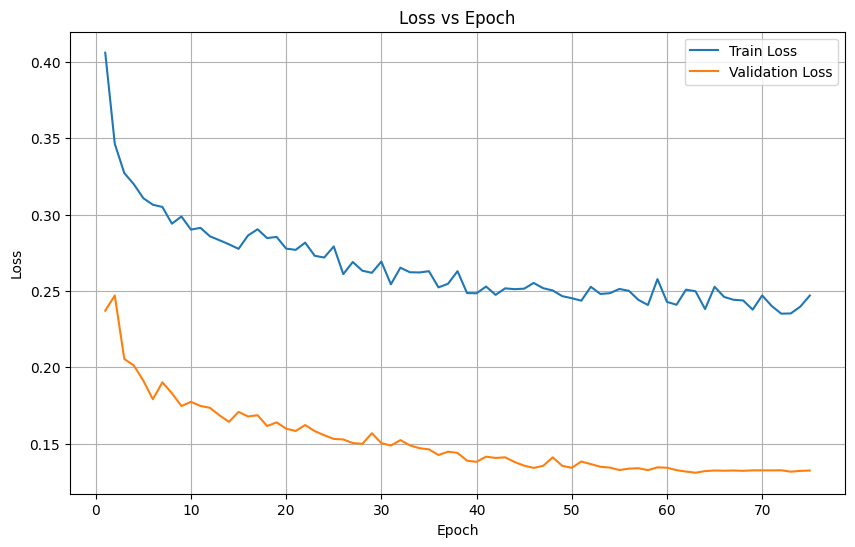

In [21]:
# import matplotlib for plotting graphs
import matplotlib.pyplot as plt

# create epoch range based on the number of training epochs completed
epochs_range = range(

    1,

    len(train_acc) + 1

)

# ==========================================
# ACCURACY
# ==========================================

# plot training and validation accuracy across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    train_acc,

    label="Train Accuracy"

)

plt.plot(

    epochs_range,

    val_acc,

    label="Validation Accuracy"

)

plt.title("Accuracy vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("Accuracy")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# PRECISION
# ==========================================

# plot training and validation precision across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    train_prec,

    label="Train Precision"

)

plt.plot(

    epochs_range,

    val_prec,

    label="Validation Precision"

)

plt.title("Precision vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("Precision")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# RECALL
# ==========================================

# plot training and validation recall across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    train_rec,

    label="Train Recall"

)

plt.plot(

    epochs_range,

    val_rec,

    label="Validation Recall"

)

plt.title("Recall vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("Recall")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# VALIDATION F1 SCORE
# ==========================================

# plot validation F1 score across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    val_f1,

    label="Validation F1 Score"

)

plt.title("Validation F1 Score vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("F1 Score")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# VALIDATION DICE
# ==========================================

# plot validation Dice score across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    val_dice,

    label="Validation Dice"

)

plt.title("Validation Dice vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("Dice")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# VALIDATION IoU
# ==========================================

# plot validation IoU score across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    val_iou,

    label="Validation IoU"

)

plt.title("Validation IoU vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("IoU")

plt.legend()

plt.grid(True)

plt.show()

# ==========================================
# LOSS
# ==========================================

# plot training and validation loss across epochs
plt.figure(figsize=(10,6))

plt.plot(

    epochs_range,

    train_losses,

    label="Train Loss"

)

plt.plot(

    epochs_range,

    val_losses,

    label="Validation Loss"

)

plt.title("Loss vs Epoch")

plt.xlabel("Epoch")

plt.ylabel("Loss")

plt.legend()

plt.grid(True)

plt.show()

## Loss Curve Analysis

### Key Observations

- Training loss decreased from **0.41 → 0.25**, indicating stable learning.
- Validation loss decreased from **0.23 → 0.13**, showing improved generalization.
- Validation loss remained consistently lower than training loss.
- No significant divergence was observed between training and validation curves.
- Accuracy, Precision, and Recall improved steadily throughout training.

### Reason for the Loss Gap

- Training data used **data augmentation**, making training samples more challenging.
- **Dropout regularization** was active during training and disabled during validation.
- Validation data was evaluated on cleaner, unaugmented samples.
- Hybrid **BCE + Dice Loss** introduced additional regularization effects.

### Conclusion

- The gap between training and validation loss is expected and normal.
- The model shows **good generalization ability**.
- No evidence of severe overfitting was observed.
- The training process remained stable and converged successfully.

## Visualizing Model Predictions on Test Images

- This cell selects **10 test images** for qualitative analysis.
- For each image, it stores:
  - the **input image**
  - the **ground-truth mask**
  - the **predicted probability map**
- It then visualizes five outputs for each sample:
  - **Input**
  - **Ground Truth**
  - **Binary Prediction**
  - **Prediction Heatmap**
  - **Overlay of prediction on input**
- This helps visually compare the model prediction with the actual landslide mask.

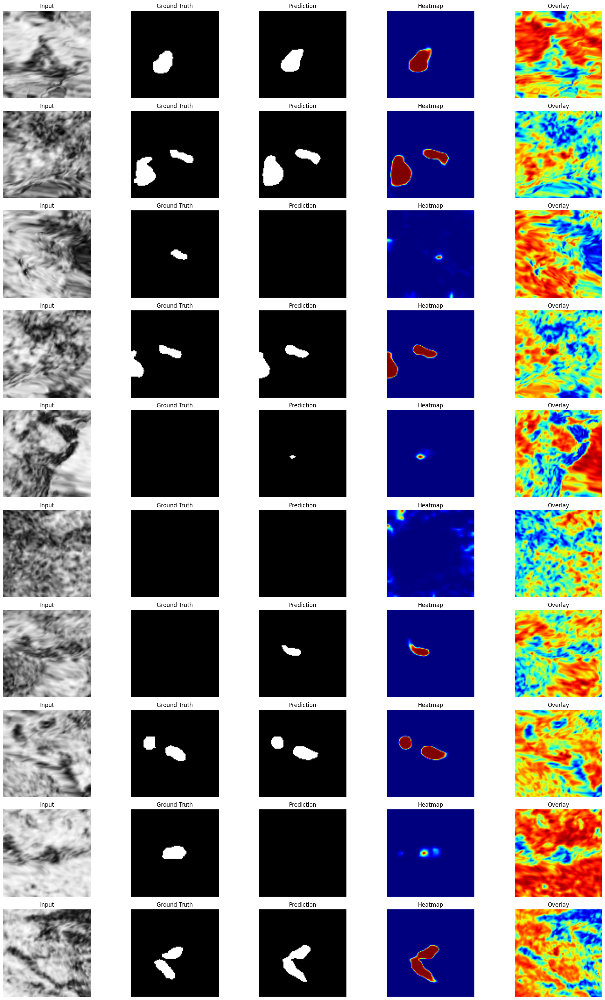

In [22]:
# set the model to evaluation mode
model.eval()

# counter to track how many test images have been collected
images_collected = 0

# number of test samples to visualize
num_images = 10

# lists to store inputs, ground-truth masks, and model predictions
all_inputs = []

all_masks = []

all_preds = []

# loop through test dataset
for images, masks in test_loader:

    # move input images to device
    images = images.to(device)

    # disable gradient calculation during inference
    with torch.no_grad():

        # get model predictions
        pred = model(images)

        # convert logits to probabilities
        pred = torch.sigmoid(pred)

    # store input images
    all_inputs.extend(

        images.cpu().numpy()

    )

    # store ground-truth masks
    all_masks.extend(

        masks.numpy()

    )

    # store predicted probability maps
    all_preds.extend(

        pred.cpu().numpy()

    )

    # update number of collected images
    images_collected += images.shape[0]

    # stop once required number of images are collected
    if images_collected >= num_images:

        break

# convert stored lists into numpy arrays
all_inputs = np.array(all_inputs)

all_masks = np.array(all_masks)

all_preds = np.array(all_preds)

# create a large figure for visualization
plt.figure(figsize=(20,30))

# loop through selected images
for i in range(num_images):

    # use the first input channel for visualization
    input_img = all_inputs[i][0]

    # ground-truth mask
    true_mask = all_masks[i][0]

    # predicted probability map
    pred_mask = all_preds[i][0]

    # convert prediction into binary mask using threshold 0.5
    binary_pred = (

        pred_mask > 0.5

    ).astype(float)

    # heatmap will use raw predicted probabilities
    heatmap = pred_mask

    # overlay prediction heatmap on top of input image
    overlay = (

        0.6 * input_img

        +

        0.4 * heatmap

    )

    # INPUT

    plt.subplot(

        num_images,

        5,

        i*5 + 1

    )

    plt.title("Input")

    plt.imshow(

        input_img,

        cmap='gray'

    )

    plt.axis('off')

    # GROUND TRUTH

    plt.subplot(

        num_images,

        5,

        i*5 + 2

    )

    plt.title("Ground Truth")

    plt.imshow(

        true_mask,

        cmap='gray'

    )

    plt.axis('off')

    # PREDICTION

    plt.subplot(

        num_images,

        5,

        i*5 + 3

    )

    plt.title("Prediction")

    plt.imshow(

        binary_pred,

        cmap='gray'

    )

    plt.axis('off')

    # HEATMAP

    plt.subplot(

        num_images,

        5,

        i*5 + 4

    )

    plt.title("Heatmap")

    plt.imshow(

        heatmap,

        cmap='jet'

    )

    plt.axis('off')

    # OVERLAY

    plt.subplot(

        num_images,

        5,

        i*5 + 5

    )

    plt.title("Overlay")

    plt.imshow(

        overlay,

        cmap='jet'

    )

    plt.axis('off')

# adjust spacing and display the full visualization grid
plt.tight_layout()

plt.show()

# AUTOMATIC LANDSLIDE ANALYSIS DATASET GENERATION

In [65]:
import os

os.makedirs("/kaggle/working/json", exist_ok=True)
os.makedirs("/kaggle/working/csv", exist_ok=True)
os.makedirs("/kaggle/working/predictions", exist_ok=True)
os.makedirs("/kaggle/working/overlays", exist_ok=True)
os.makedirs("/kaggle/working/heatmaps", exist_ok=True)

print("Folders Created Successfully!")

Folders Created Successfully!


# **CELL B — Metadata Extraction**

In [66]:
# ==========================================================
# CELL B : Metadata Extraction (TEST DATASET ONLY)
# ==========================================================

import os
import json
from datetime import datetime

print("=" * 60)
print("METADATA EXTRACTION MODULE")
print("=" * 60)

metadata_list = []

# Iterate only over the TEST dataset
for sample_index, dataset_index in enumerate(test_dataset.indices):

    temporal, region, coh_file, phase_file, mask_file = full_dataset.samples[dataset_index]

    image_name = os.path.basename(coh_file)
    image_id = os.path.splitext(image_name)[0]

    patch_folder = os.path.basename(os.path.dirname(coh_file))

    metadata = {

        "sample_index": sample_index,
        "sample_id": f"sample_{sample_index:05d}",

        "dataset_index": dataset_index,

        "image_id": image_id,

        "image_name": image_name,

        "region": region,

        "temporal_baseline": temporal,

        "patch_number": patch_folder,

        "coherence_path": coh_file,

        "phase_path": phase_file,

        "ground_truth_path": mask_file,

        "dataset_split": "Test",

        "analysis_date": datetime.now().strftime("%Y-%m-%d %H:%M:%S")

    }

    metadata_list.append(metadata)

print(f"Total Test Metadata Records : {len(metadata_list)}")

print("\nExample Metadata:\n")
print(json.dumps(metadata_list[0], indent=4))

METADATA EXTRACTION MODULE
Total Test Metadata Records : 1985

Example Metadata:

{
    "sample_index": 0,
    "sample_id": "sample_00000",
    "dataset_index": 6839,
    "image_id": "175_33",
    "image_name": "175_33.tif",
    "region": "QueyrasPark",
    "temporal_baseline": "12days",
    "patch_number": "coherence",
    "coherence_path": "/kaggle/input/datasets/rishikeshgopal45/landslide-insar-isslide/ReadyToBeUsedDataset/12days/QueyrasPark/25Aug2018_06Sep2018/coherence/175_33.tif",
    "phase_path": "/kaggle/input/datasets/rishikeshgopal45/landslide-insar-isslide/ReadyToBeUsedDataset/12days/QueyrasPark/25Aug2018_06Sep2018/phase/175_33.tif",
    "ground_truth_path": "/kaggle/input/datasets/rishikeshgopal45/landslide-insar-isslide/ReadyToBeUsedDataset/12days/QueyrasPark/Segmentations/25Aug2018_06Sep2018/175_33.tif",
    "dataset_split": "Test",
    "analysis_date": "2026-07-06 12:43:24"
}


# **CELL C : Coherence Analysis**

**This cell computes For every test image**

In [67]:
# ==========================================================
# CELL C : Coherence Analysis
# ==========================================================

import tifffile as tiff
import numpy as np
from scipy.stats import skew, kurtosis

print("=" * 60)
print("COHERENCE ANALYSIS MODULE")
print("=" * 60)

for metadata in metadata_list:

    coherence = tiff.imread(
        metadata["coherence_path"]
    ).astype(np.float32)

    coherence = coherence.flatten()

    coherence_stats = {

        "mean": float(np.mean(coherence)),

        "median": float(np.median(coherence)),

        "minimum": float(np.min(coherence)),

        "maximum": float(np.max(coherence)),

        "std": float(np.std(coherence)),

        "variance": float(np.var(coherence)),

        "range": float(np.max(coherence)-np.min(coherence)),

        "q25": float(np.percentile(coherence,25)),

        "q50": float(np.percentile(coherence,50)),

        "q75": float(np.percentile(coherence,75)),

        "skewness": float(skew(coherence)),

        "kurtosis": float(kurtosis(coherence)),

        "low_coherence_percentage": float(
            np.mean(coherence<0.30)*100
        ),

        "medium_coherence_percentage": float(
            np.mean(
                (coherence>=0.30)&
                (coherence<=0.70)
            )*100
        ),

        "high_coherence_percentage": float(
            np.mean(coherence>0.70)*100
        )

    }

    metadata["coherence_analysis"] = coherence_stats

print("Coherence Analysis Completed.")

print()

print(json.dumps(
    metadata_list[0]["coherence_analysis"],
    indent=4
))

COHERENCE ANALYSIS MODULE
Coherence Analysis Completed.

{
    "mean": 0.666447103023529,
    "median": 0.6999537944793701,
    "minimum": 0.11473885178565979,
    "maximum": 0.9574858546257019,
    "std": 0.17900203168392181,
    "variance": 0.032041728496551514,
    "range": 0.8427469730377197,
    "q25": 0.5539282560348511,
    "q50": 0.6999537944793701,
    "q75": 0.8142945170402527,
    "skewness": -0.7462579607963562,
    "kurtosis": -0.22626447677612305,
    "low_coherence_percentage": 4.2299999999999995,
    "medium_coherence_percentage": 45.769999999999996,
    "high_coherence_percentage": 50.0
}


# **CELL D : Phase Analysis**

In [68]:
# ==========================================================
# CELL D : Phase Analysis
# ==========================================================

import tifffile as tiff
import numpy as np
from scipy.stats import skew, kurtosis
from scipy.stats import entropy

print("=" * 60)
print("PHASE ANALYSIS MODULE")
print("=" * 60)

for metadata in metadata_list:

    # ------------------------------------------------------
    # Read Original Phase Image
    # ------------------------------------------------------
    phase = tiff.imread(
        metadata["phase_path"]
    ).astype(np.float32)

    phase_flat = phase.flatten()

    # ------------------------------------------------------
    # Phase Gradient
    # ------------------------------------------------------
    grad_y, grad_x = np.gradient(phase)

    gradient = np.sqrt(
        grad_x**2 + grad_y**2
    )

    # ------------------------------------------------------
    # Histogram (Entropy & Energy)
    # ------------------------------------------------------
    hist, _ = np.histogram(
        phase_flat,
        bins=256,
        density=True
    )

    hist = hist + 1e-10

    phase_entropy = entropy(hist)

    phase_energy = np.sum(hist ** 2)

    # ------------------------------------------------------
    # Statistics
    # ------------------------------------------------------
    phase_stats = {

        "mean": float(np.mean(phase_flat)),

        "median": float(np.median(phase_flat)),

        "minimum": float(np.min(phase_flat)),

        "maximum": float(np.max(phase_flat)),

        "std": float(np.std(phase_flat)),

        "variance": float(np.var(phase_flat)),

        "range": float(
            np.max(phase_flat)
            -
            np.min(phase_flat)
        ),

        "skewness": float(
            skew(phase_flat)
        ),

        "kurtosis": float(
            kurtosis(phase_flat)
        ),

        "entropy": float(
            phase_entropy
        ),

        "energy": float(
            phase_energy
        ),

        "gradient_mean": float(
            np.mean(gradient)
        ),

        "gradient_std": float(
            np.std(gradient)
        )

    }

    metadata["phase_analysis"] = phase_stats

print("Phase Analysis Completed.")

print()

print(
    json.dumps(
        metadata_list[0]["phase_analysis"],
        indent=4
    )
)

PHASE ANALYSIS MODULE
Phase Analysis Completed.

{
    "mean": 1.4104145765304565,
    "median": 1.6391621828079224,
    "minimum": -3.1392903327941895,
    "maximum": 3.132938861846924,
    "std": 0.8908549547195435,
    "variance": 0.7936225533485413,
    "range": 6.272229194641113,
    "skewness": -2.0212502479553223,
    "kurtosis": 5.334470748901367,
    "entropy": 4.500200967825106,
    "energy": 26.15935557620055,
    "gradient_mean": 0.17221997678279877,
    "gradient_std": 0.4147201180458069
}


# **CELL E — Segmentation Analysis**

In [69]:
# ==========================================================
# CELL E : Segmentation Analysis
# ==========================================================

import numpy as np
import torch
import json

print("=" * 60)
print("SEGMENTATION ANALYSIS MODULE")
print("=" * 60)

model.eval()

analysis_index = 0

with torch.no_grad():

    for images, masks in test_loader:

        images = images.to(device)
        masks = masks.to(device)

        # ----------------------------------
        # Model Prediction
        # ----------------------------------

        outputs = model(images)

        probabilities = torch.sigmoid(outputs)

        predictions = (probabilities > threshold).float()

        batch_size = images.size(0)

        # ----------------------------------
        # Process Each Image
        # ----------------------------------

        for b in range(batch_size):

            # ----------------------------------
            # Extract Single Sample
            # ----------------------------------

            pred = predictions[b, 0].cpu().numpy()

            gt = masks[b, 0].cpu().numpy()

            prob = probabilities[b, 0].cpu().numpy()

            input_image = images[b, 0].cpu().numpy()

            # ----------------------------------
            # Save for Later Modules
            # ----------------------------------

            metadata_list[analysis_index]["prediction_mask"] = pred

            metadata_list[analysis_index]["ground_truth_mask"] = gt

            metadata_list[analysis_index]["probability_map"] = prob

            metadata_list[analysis_index]["input_image"] = input_image

            # ----------------------------------
            # Area Information
            # ----------------------------------

            gt_area = int(np.sum(gt))

            pred_area = int(np.sum(pred))

            area_difference = abs(
                gt_area - pred_area
            )

            area_percentage = (
                pred_area / gt.size
            ) * 100

            # ----------------------------------
            # Confusion Matrix Values
            # ----------------------------------

            TP = np.sum(
                (pred == 1) &
                (gt == 1)
            )

            FP = np.sum(
                (pred == 1) &
                (gt == 0)
            )

            FN = np.sum(
                (pred == 0) &
                (gt == 1)
            )

            TN = np.sum(
                (pred == 0) &
                (gt == 0)
            )

            # ----------------------------------
            # Metrics
            # ----------------------------------

            precision = TP / (
                TP + FP + 1e-8
            )

            recall = TP / (
                TP + FN + 1e-8
            )

            specificity = TN / (
                TN + FP + 1e-8
            )

            sensitivity = recall

            accuracy = (
                TP + TN
            ) / (
                TP + TN + FP + FN + 1e-8
            )

            dice = (
                2 * TP
            ) / (
                2 * TP + FP + FN + 1e-8
            )

            iou = TP / (
                TP + FP + FN + 1e-8
            )

            f1 = dice

            # ----------------------------------
            # Store Segmentation Features
            # ----------------------------------

            segmentation = {

                "ground_truth_area": gt_area,

                "predicted_area": pred_area,

                "difference": area_difference,

                "area_percentage": float(area_percentage),

                "dice": float(dice),

                "iou": float(iou),

                "precision": float(precision),

                "recall": float(recall),

                "specificity": float(specificity),

                "sensitivity": float(sensitivity),

                "accuracy": float(accuracy),

                "f1_score": float(f1),

                "average_probability": float(
                    np.mean(prob)
                ),

                "maximum_probability": float(
                    np.max(prob)
                ),

                "minimum_probability": float(
                    np.min(prob)
                )

            }

            metadata_list[analysis_index]["segmentation_analysis"] = segmentation

            analysis_index += 1

print()

print("Segmentation Analysis Completed.")

print()

print(
    json.dumps(
        metadata_list[0]["segmentation_analysis"],
        indent=4
    )
)

SEGMENTATION ANALYSIS MODULE

Segmentation Analysis Completed.

{
    "ground_truth_area": 425,
    "predicted_area": 463,
    "difference": 38,
    "area_percentage": 4.63,
    "dice": 0.8828828828729405,
    "iou": 0.7903225806292273,
    "precision": 0.8466522678002882,
    "recall": 0.9223529411547682,
    "specificity": 0.9925848563958302,
    "sensitivity": 0.9223529411547682,
    "accuracy": 0.9895999999990103,
    "f1_score": 0.8828828828729405,
    "average_probability": 0.04642529785633087,
    "maximum_probability": 1.0,
    "minimum_probability": 2.954193760820213e-14
}


# **CELL F : Shape Analysis**

In [70]:
# ==========================================================
# CELL F : Shape Analysis
# ==========================================================

import cv2
import numpy as np
import json

print("=" * 60)
print("SHAPE ANALYSIS MODULE")
print("=" * 60)

for metadata in metadata_list:

    pred = metadata["prediction_mask"].astype(np.uint8)

    # ------------------------------------
    # Connected Components
    # ------------------------------------

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        pred,
        connectivity=8
    )

    connected_components = max(num_labels - 1, 0)

    component_areas = []

    if connected_components > 0:

        component_areas = stats[1:, cv2.CC_STAT_AREA]

        largest_component = int(np.max(component_areas))

        smallest_component = int(np.min(component_areas))

        average_component_area = float(np.mean(component_areas))

    else:

        largest_component = 0
        smallest_component = 0
        average_component_area = 0.0

    # ------------------------------------
    # Contours
    # ------------------------------------

    contours, _ = cv2.findContours(
        pred,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    if len(contours) > 0:

        largest_contour = max(contours, key=cv2.contourArea)

        perimeter = float(
            cv2.arcLength(
                largest_contour,
                True
            )
        )

        area = float(
            cv2.contourArea(
                largest_contour
            )
        )

        x, y, w, h = cv2.boundingRect(
            largest_contour
        )

        centroid = centroids[
            np.argmax(component_areas) + 1
        ].tolist()

        bounding_box = [
            int(x),
            int(y),
            int(w),
            int(h)
        ]

        # ------------------------------------
        # Convex Hull
        # ------------------------------------

        hull = cv2.convexHull(
            largest_contour
        )

        convex_area = float(
            cv2.contourArea(
                hull
            )
        )

        solidity = area / (
            convex_area + 1e-8
        )

        # ------------------------------------
        # Aspect Ratio
        # ------------------------------------

        aspect_ratio = w / (
            h + 1e-8
        )

        # ------------------------------------
        # Circularity
        # ------------------------------------

        circularity = (
            4
            * np.pi
            * area
        ) / (
            perimeter**2 + 1e-8
        )

        # ------------------------------------
        # Shape Complexity
        # ------------------------------------

        shape_complexity = (
            perimeter**2
        ) / (
            area + 1e-8
        )

    else:

        perimeter = 0.0

        area = 0.0

        bounding_box = [0,0,0,0]

        centroid = [0,0]

        convex_area = 0.0

        solidity = 0.0

        aspect_ratio = 0.0

        circularity = 0.0

        shape_complexity = 0.0

    # ------------------------------------
    # Save Results
    # ------------------------------------

    metadata["shape_analysis"] = {

        "connected_components": int(connected_components),

        "largest_component": largest_component,

        "smallest_component": smallest_component,

        "average_component_area": average_component_area,

        "perimeter": perimeter,

        "bounding_box": bounding_box,

        "centroid": centroid,

        "convex_area": convex_area,

        "solidity": solidity,

        "aspect_ratio": aspect_ratio,

        "circularity": circularity,

        "shape_complexity": shape_complexity

    }

print("Shape Analysis Completed.")

print()

print(
    json.dumps(
        metadata_list[0]["shape_analysis"],
        indent=4
    )
)

SHAPE ANALYSIS MODULE
Shape Analysis Completed.

{
    "connected_components": 1,
    "largest_component": 463,
    "smallest_component": 463,
    "average_component_area": 463.0,
    "perimeter": 84.7695517539978,
    "bounding_box": [
        25,
        44,
        26,
        26
    ],
    "centroid": [
        37.751619870410366,
        57.272138228941685
    ],
    "convex_area": 446.5,
    "solidity": 0.9518477043459832,
    "aspect_ratio": 0.9999999996153845,
    "circularity": 0.7432227941026834,
    "shape_complexity": 16.907945657422665
}


# **CELL G : Confidence + Severity + Risk Analysis**

In [71]:
# ==========================================================
# CELL G : Confidence Analysis + Severity Assessment
# ==========================================================

import numpy as np
import json

print("=" * 60)
print("CONFIDENCE & SEVERITY ANALYSIS MODULE")
print("=" * 60)

for metadata in metadata_list:

    # =====================================================
    # Probability Map
    # =====================================================

    probability = metadata["probability_map"]

    probability = probability.flatten()

    # =====================================================
    # Confidence Analysis
    # =====================================================

    confidence_mean = float(np.mean(probability))

    confidence_max = float(np.max(probability))

    confidence_min = float(np.min(probability))

    confidence_variance = float(np.var(probability))

    histogram, _ = np.histogram(
        probability,
        bins=256,
        range=(0,1),
        density=True
    )

    histogram += 1e-10

    confidence_entropy = float(
        -np.sum(
            histogram*np.log2(histogram)
        )
    )

    metadata["confidence_analysis"] = {

        "average_probability": confidence_mean,

        "maximum_probability": confidence_max,

        "minimum_probability": confidence_min,

        "confidence_variance": confidence_variance,

        "confidence_entropy": confidence_entropy

    }

    # =====================================================
    # Severity Index
    # =====================================================

    area_percent = (
        metadata["segmentation_analysis"]["area_percentage"] / 100.0
    )

    mean_coherence = (
        metadata["coherence_analysis"]["mean"]
    )

    phase_std = (
        metadata["phase_analysis"]["std"]
    )

    shape_complexity = (
        metadata["shape_analysis"]["shape_complexity"]
    )

    # -----------------------------
    # Normalization
    # -----------------------------

    A = np.clip(area_percent,0,1)

    C = np.clip(mean_coherence,0,1)

    P = np.clip(
        phase_std / (phase_std + 1),
        0,
        1
    )

    S = np.clip(
        shape_complexity / (shape_complexity + 50),
        0,
        1
    )

    # =====================================================
    # Proposed Severity Formula
    # =====================================================

    severity_index = (

        0.35 * A

        +

        0.25 * (1-C)

        +

        0.20 * P

        +

        0.20 * S

    )

    severity_index = float(
        np.clip(
            severity_index,
            0,
            1
        )
    )

    # =====================================================
    # Risk Classification
    # =====================================================

    if severity_index < 0.20:

        risk = "Very Low"

    elif severity_index < 0.40:

        risk = "Low"

    elif severity_index < 0.60:

        risk = "Moderate"

    elif severity_index < 0.80:

        risk = "High"

    else:

        risk = "Very High"

    # =====================================================
    # Confidence Level
    # =====================================================

    if confidence_mean >= 0.90:

        confidence_level = "Very High"

    elif confidence_mean >= 0.75:

        confidence_level = "High"

    elif confidence_mean >= 0.60:

        confidence_level = "Moderate"

    else:

        confidence_level = "Low"

    metadata["severity_assessment"] = {

        "severity_index": severity_index,

        "risk_level": risk,

        "confidence_level": confidence_level

    }

print("Confidence Analysis Completed.")

print("Severity Assessment Completed.")

print()

print(json.dumps(
    metadata_list[0]["confidence_analysis"],
    indent=4
))

print()

print(json.dumps(
    metadata_list[0]["severity_assessment"],
    indent=4
))

CONFIDENCE & SEVERITY ANALYSIS MODULE
Confidence Analysis Completed.
Severity Assessment Completed.

{
    "average_probability": 0.04642529785633087,
    "maximum_probability": 1.0,
    "minimum_probability": 2.954193760820213e-14,
    "confidence_variance": 0.040979884564876556,
    "confidence_entropy": -1880.341289685698
}

{
    "severity_index": 0.24436188528477326,
    "risk_level": "Low",
    "confidence_level": "Low"
}


In [105]:
import shutil
import os

folders = [
    "/kaggle/working/json",
    "/kaggle/working/predictions",
    "/kaggle/working/heatmaps",
    "/kaggle/working/overlays",
    "/kaggle/working/csv"
]

for folder in folders:
    if os.path.exists(folder):
        shutil.rmtree(folder)

for folder in folders:
    os.makedirs(folder, exist_ok=True)

print("Folders cleaned successfully.")

Folders cleaned successfully.


# **cell H**

In [106]:
# ==========================================================
# CELL H : JSON Writer
# ==========================================================

import os
import json
import copy
import numpy as np

print("=" * 60)
print("JSON GENERATION MODULE")
print("=" * 60)

json_folder = "/kaggle/working/json"

os.makedirs(
    json_folder,
    exist_ok=True
)

# ==========================================================
# JSON SERIALIZER
# ==========================================================

def json_converter(obj):

    if isinstance(obj, np.integer):
        return int(obj)

    elif isinstance(obj, np.floating):
        return float(obj)

    elif isinstance(obj, np.ndarray):
        return obj.tolist()

    return str(obj)

# ==========================================================
# WRITE JSON FILES
# ==========================================================

for metadata in metadata_list:

    json_data = copy.deepcopy(metadata)

    # -------------------------------------------------
    # Remove Large Arrays
    # -------------------------------------------------

    keys_to_remove = [

        "prediction_mask",

        "ground_truth_mask",

        "probability_map",

        "input_image"

    ]

    for key in keys_to_remove:

        json_data.pop(key, None)

    # -------------------------------------------------
    # Add Image Paths
    # -------------------------------------------------

    sample_name = json_data["sample_id"]

    json_data["file_paths"] = {

    "prediction":
    f"predictions/{sample_name}.png",

    "heatmap":
    f"heatmaps/{sample_name}.png",

    "overlay":
    f"overlays/{sample_name}.png"

}

    # -------------------------------------------------
    # Save JSON
    # -------------------------------------------------

    save_path = os.path.join(

    json_folder,

    sample_name + ".json"

)
    with open(save_path, "w") as f:

        json.dump(

            json_data,

            f,

            indent=4,

            default=json_converter

        )

print()

print("=" * 60)

print("JSON DATASET GENERATED SUCCESSFULLY")

print("=" * 60)

print()

print("Total JSON Files :", len(metadata_list))

print()

print("Saved Folder :")

print(json_folder)

JSON GENERATION MODULE

JSON DATASET GENERATED SUCCESSFULLY

Total JSON Files : 1985

Saved Folder :
/kaggle/working/json


In [108]:
# ==========================================================
# CELL I : CSV Writer
# ==========================================================

import os
import pandas as pd

print("=" * 60)
print("CSV GENERATION MODULE")
print("=" * 60)

csv_folder = "/kaggle/working/csv"

os.makedirs(csv_folder, exist_ok=True)

rows = []

for metadata in metadata_list:

    row = {

        # =====================================================
        # Metadata
        # =====================================================

        "Image_ID": metadata["image_id"],

        "Region": metadata["region"],

        "Temporal_Baseline": metadata["temporal_baseline"],

        "Patch_Number": metadata["patch_number"],

        # =====================================================
        # Coherence
        # =====================================================

        "Mean_Coherence":
        metadata["coherence_analysis"]["mean"],

        "Std_Coherence":
        metadata["coherence_analysis"]["std"],

        "Min_Coherence":
        metadata["coherence_analysis"]["minimum"],

        "Max_Coherence":
        metadata["coherence_analysis"]["maximum"],

        # =====================================================
        # Phase
        # =====================================================

        "Mean_Phase":
        metadata["phase_analysis"]["mean"],

        "Std_Phase":
        metadata["phase_analysis"]["std"],

        "Phase_Entropy":
        metadata["phase_analysis"]["entropy"],

        "Phase_Energy":
        metadata["phase_analysis"]["energy"],

        # =====================================================
        # Segmentation
        # =====================================================

        "GroundTruth_Area":
        metadata["segmentation_analysis"]["ground_truth_area"],

        "Predicted_Area":
        metadata["segmentation_analysis"]["predicted_area"],

        "Area_Percentage":
        metadata["segmentation_analysis"]["area_percentage"],

        "Dice":
        metadata["segmentation_analysis"]["dice"],

        "IoU":
        metadata["segmentation_analysis"]["iou"],

        "Precision":
        metadata["segmentation_analysis"]["precision"],

        "Recall":
        metadata["segmentation_analysis"]["recall"],

        "Specificity":
        metadata["segmentation_analysis"]["specificity"],

        "Sensitivity":
        metadata["segmentation_analysis"]["sensitivity"],

        "Accuracy":
        metadata["segmentation_analysis"]["accuracy"],

        "F1":
        metadata["segmentation_analysis"]["f1_score"],

        # =====================================================
        # Confidence
        # =====================================================

        "Average_Confidence":
        metadata["confidence_analysis"]["average_probability"],

        "Maximum_Confidence":
        metadata["confidence_analysis"]["maximum_probability"],

        "Minimum_Confidence":
        metadata["confidence_analysis"]["minimum_probability"],

        "Confidence_Variance":
        metadata["confidence_analysis"]["confidence_variance"],

        "Confidence_Entropy":
        metadata["confidence_analysis"]["confidence_entropy"],

        # =====================================================
        # Shape
        # =====================================================

        "Connected_Components":
        metadata["shape_analysis"]["connected_components"],

        "Largest_Component":
        metadata["shape_analysis"]["largest_component"],

        "Perimeter":
        metadata["shape_analysis"]["perimeter"],

        "Convex_Area":
        metadata["shape_analysis"]["convex_area"],

        "Solidity":
        metadata["shape_analysis"]["solidity"],

        "Aspect_Ratio":
        metadata["shape_analysis"]["aspect_ratio"],

        "Circularity":
        metadata["shape_analysis"]["circularity"],

        "Shape_Complexity":
        metadata["shape_analysis"]["shape_complexity"],

        # =====================================================
        # Severity
        # =====================================================

        "Severity_Index":
        metadata["severity_assessment"]["severity_index"],

        "Risk_Level":
        metadata["severity_assessment"]["risk_level"],

        "Confidence_Level":
        metadata["severity_assessment"]["confidence_level"]

    }

    rows.append(row)

# ==========================================================
# Create DataFrame
# ==========================================================

df = pd.DataFrame(rows)

csv_path = os.path.join(

    csv_folder,

    "landslide_analysis_dataset.csv"

)

df.to_csv(

    csv_path,

    index=False

)

print()

print("CSV Generated Successfully")

print()

print("Rows :", len(df))

print("Columns :", len(df.columns))

print()

print("CSV Saved At:")

print(csv_path)

print()

print(df.head())

CSV GENERATION MODULE

CSV Generated Successfully

Rows : 1985
Columns : 39

CSV Saved At:
/kaggle/working/csv/landslide_analysis_dataset.csv

  Image_ID       Region Temporal_Baseline Patch_Number  Mean_Coherence  \
0   175_33  QueyrasPark            12days    coherence        0.666447   
1     2_56      Vanoise            12days    coherence        0.532447   
2   182_45  QueyrasPark             6days    coherence        0.591094   
3     2_53      Vanoise            18days    coherence        0.582951   
4    35_25      Vanoise             6days    coherence        0.597796   

   Std_Coherence  Min_Coherence  Max_Coherence  Mean_Phase  Std_Phase  ...  \
0       0.179002       0.114739       0.957486    1.410415   0.890855  ...   
1       0.156229       0.125970       0.919720    0.636803   0.990252  ...   
2       0.189001       0.113352       0.909380    0.560265   2.673249  ...   
3       0.175986       0.116300       0.930164   -0.613313   0.367370  ...   
4       0.210186      

# **CELL J1 : Prediction Image Generator**

In [109]:
# ==========================================================
# CELL J1 : Prediction Image Generator
# ==========================================================

import os
import cv2
import numpy as np

print("=" * 60)
print("PREDICTION IMAGE GENERATOR")
print("=" * 60)

prediction_folder = "/kaggle/working/predictions"

os.makedirs(
    prediction_folder,
    exist_ok=True
)

for metadata in metadata_list:

    prediction = metadata["prediction_mask"]

    prediction = (prediction * 255).astype(np.uint8)

    save_path = os.path.join(

        prediction_folder,

        metadata["sample_id"] + ".png"

    )

    cv2.imwrite(

        save_path,

        prediction

    )

print()

print("Prediction Images Saved Successfully")

print()

print("Folder :")

print(prediction_folder)

print()

print("Total Prediction Images :", len(metadata_list))

PREDICTION IMAGE GENERATOR

Prediction Images Saved Successfully

Folder :
/kaggle/working/predictions

Total Prediction Images : 1985


# **CELL J2 : Heatmap Generator**

In [110]:
# ==========================================================
# CELL J2 : Heatmap Generator
# ==========================================================

import os
import cv2
import numpy as np

print("=" * 60)
print("HEATMAP GENERATOR")
print("=" * 60)

heatmap_folder = "/kaggle/working/heatmaps"

os.makedirs(
    heatmap_folder,
    exist_ok=True
)

for metadata in metadata_list:

    # ------------------------------------
    # Load Probability Map
    # ------------------------------------

    probability = metadata["probability_map"]

    # Normalize to 0-255
    probability = np.clip(
        probability,
        0,
        1
    )

    probability = (
        probability * 255
    ).astype(np.uint8)

    # ------------------------------------
    # Apply Heatmap
    # ------------------------------------

    heatmap = cv2.applyColorMap(

        probability,

        cv2.COLORMAP_JET

    )

    # ------------------------------------
    # Save Heatmap
    # ------------------------------------

    save_path = os.path.join(

        heatmap_folder,

        metadata["sample_id"] + ".png"

    )

    cv2.imwrite(

        save_path,

        heatmap

    )

print()

print("Heatmaps Saved Successfully")

print()

print("Folder :")

print(heatmap_folder)

print()

print("Total Heatmaps :", len(metadata_list))

HEATMAP GENERATOR

Heatmaps Saved Successfully

Folder :
/kaggle/working/heatmaps

Total Heatmaps : 1985


# **CELL J3 : Overlay Generator + Final Summary**

In [111]:
# ==========================================================
# CELL J3 : Overlay Generator + Final Summary
# ==========================================================

import os
import cv2
import numpy as np

print("=" * 60)
print("OVERLAY IMAGE GENERATOR")
print("=" * 60)

overlay_folder = "/kaggle/working/overlays"

os.makedirs(
    overlay_folder,
    exist_ok=True
)

for metadata in metadata_list:

    # =====================================================
    # Original Input Image
    # =====================================================

    input_image = metadata["input_image"]

    # Convert to uint8
    input_image = input_image.astype(np.float32)

    input_image = (
        input_image - input_image.min()
    ) / (
        input_image.max() - input_image.min() + 1e-8
    )

    input_image = (
        input_image * 255
    ).astype(np.uint8)

    # Convert grayscale to RGB
    input_rgb = cv2.cvtColor(

        input_image,

        cv2.COLOR_GRAY2BGR

    )

    # =====================================================
    # Heatmap
    # =====================================================

    probability = metadata["probability_map"]

    probability = np.clip(

        probability,

        0,

        1

    )

    probability = (

        probability * 255

    ).astype(np.uint8)

    heatmap = cv2.applyColorMap(

        probability,

        cv2.COLORMAP_JET

    )

    # =====================================================
    # Overlay
    # =====================================================

    overlay = cv2.addWeighted(

        input_rgb,

        0.6,

        heatmap,

        0.4,

        0

    )

    # =====================================================
    # Save Overlay
    # =====================================================

    save_path = os.path.join(

        overlay_folder,

        metadata["sample_id"] + ".png"

    )

    cv2.imwrite(

        save_path,

        overlay

    )

print()

print("=" * 60)
print("DATASET GENERATION COMPLETED")
print("=" * 60)

print()

print("JSON Folder")

print("/kaggle/working/json")

print()

print("CSV Folder")

print("/kaggle/working/csv")

print()

print("Prediction Folder")

print("/kaggle/working/predictions")

print()

print("Heatmap Folder")

print("/kaggle/working/heatmaps")

print()

print("Overlay Folder")

print("/kaggle/working/overlays")

print()

print("Total Samples Processed :", len(metadata_list))

print()

print("LLM Dataset Generation Successful!")

print("=" * 60)

OVERLAY IMAGE GENERATOR

DATASET GENERATION COMPLETED

JSON Folder
/kaggle/working/json

CSV Folder
/kaggle/working/csv

Prediction Folder
/kaggle/working/predictions

Heatmap Folder
/kaggle/working/heatmaps

Overlay Folder
/kaggle/working/overlays

Total Samples Processed : 1985

LLM Dataset Generation Successful!


# Cell 25-A : Find Common Samples Across 6 / 12 / 18 Days

## Finding Common Samples Across Temporal Baselines

- This cell searches for **common image samples** across the **6-day, 12-day, and 18-day** temporal baselines.
- The search is performed separately for each region:
  - **EcrinPark**
  - **OutsideTheBox**
  - **QueyrasPark**
  - **Vanoise**
- It counts how many samples are present in each baseline.
- Then it finds the filenames that are available in **all three baselines**.
- These common samples are useful for fair temporal comparison across different time intervals.

In [79]:
# import os module for handling file paths
import os

# use the full dataset object created earlier
dataset = full_dataset

# list of all regions to be analyzed
regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

# dictionary to store common filenames across 6, 12, and 18 day baselines for each region
common_samples = {}

# print total number of samples available in the dataset
print(
    "Total Samples:",
    len(dataset.samples)
)

# loop through each region
for region in regions:

    # sets to store filenames available in each temporal baseline
    files_6 = set()

    files_12 = set()

    files_18 = set()

    # loop through all dataset samples
    for sample in dataset.samples:

        temporal, reg, coh_file, phase_file, mask_file = sample

        # extract only the filename from the coherence file path
        filename = os.path.basename(
            coh_file
        )

        # store filenames region-wise for 6-day baseline
        if (

            reg == region

            and

            temporal == "6days"

        ):

            files_6.add(
                filename
            )

        # store filenames region-wise for 12-day baseline
        elif (

            reg == region

            and

            temporal == "12days"

        ):

            files_12.add(
                filename
            )

        # store filenames region-wise for 18-day baseline
        elif (

            reg == region

            and

            temporal == "18days"

        ):

            files_18.add(
                filename
            )

    # find filenames that are common across all three temporal baselines
    common = sorted(

        files_6

        &

        files_12

        &

        files_18

    )

    # store the common filenames for the current region
    common_samples[region] = common

    print("\n")

    print("=" * 70)

    print(
        f"Region : {region}"
    )

    print("=" * 70)

    # print number of samples available in each temporal baseline
    print(
        "6 Days Samples :",
        len(files_6)
    )

    print(
        "12 Days Samples:",
        len(files_12)
    )

    print(
        "18 Days Samples:",
        len(files_18)
    )

    # print number of common samples found across all three baselines
    print(
        "Common Samples :",
        len(common)
    )

    # print one example common sample if available
    if len(common) > 0:

        print(
            "Example Sample:",
            common[0]
        )

print("\n")

print("=" * 70)

# final message after completing common sample search
print(
    "COMMON SAMPLE SEARCH COMPLETED"
)

print("=" * 70)

Total Samples: 13230


Region : EcrinPark
6 Days Samples : 35
12 Days Samples: 35
18 Days Samples: 35
Common Samples : 35
Example Sample: 106_23.tif


Region : OutsideTheBox
6 Days Samples : 84
12 Days Samples: 84
18 Days Samples: 84
Common Samples : 84
Example Sample: 100_65.tif


Region : QueyrasPark
6 Days Samples : 69
12 Days Samples: 69
18 Days Samples: 69
Common Samples : 69
Example Sample: 140_50.tif


Region : Vanoise
6 Days Samples : 57
12 Days Samples: 57
18 Days Samples: 57
Common Samples : 57
Example Sample: 10_48.tif


COMMON SAMPLE SEARCH COMPLETED


# Cell 25-B : Region-wise Temporal Visualization + Analysis

## Region-wise Temporal Baseline Analysis and Visualization

- This cell performs **region-wise analysis** across the **6-day, 12-day, and 18-day** temporal baselines.
- For each region, it selects a **common sample** available in all three baselines.
- The sample is passed through the trained model to generate predictions.
- It computes analysis metrics such as:
  - **Mean Coherence**
  - **Phase Standard Deviation**
  - **Ground Truth Area**
  - **Predicted Area**
  - **Area Difference**
  - **Dice Score**
  - **IoU Score**
  - **F1 Score**
- It also visualizes:
  - **Input image**
  - **Ground Truth**
  - **Prediction**
  - **Heatmap**
  - **Overlay**
- Finally, it prints a short interpretation of terrain stability, deformation, and prediction quality.



REGION : EcrinPark
Selected Sample : 121_5.tif


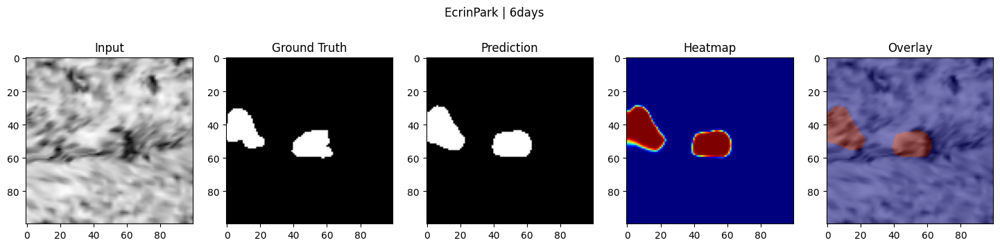


----------------------------------------------------------------------
EcrinPark | 6days
----------------------------------------------------------------------
Mean Coherence : 0.7441
Phase Std      : 1.1995
GT Area        : 677
Pred Area      : 746
Area Diff      : 69
Dice           : 0.9178
IoU            : 0.8481
F1 Score       : 0.9178

Coherence Trend : Stable Terrain
Phase Activity  : High Deformation
Area Error      : 69 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



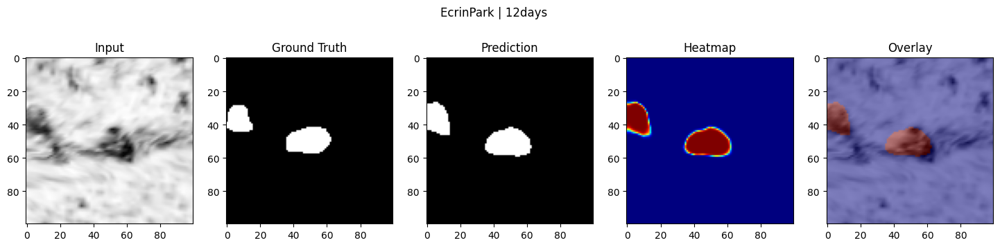


----------------------------------------------------------------------
EcrinPark | 12days
----------------------------------------------------------------------
Mean Coherence : 0.8279
Phase Std      : 2.6657
GT Area        : 549
Pred Area      : 598
Area Diff      : 49
Dice           : 0.8684
IoU            : 0.7673
F1 Score       : 0.8684

Coherence Trend : Stable Terrain
Phase Activity  : High Deformation
Area Error      : 49 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



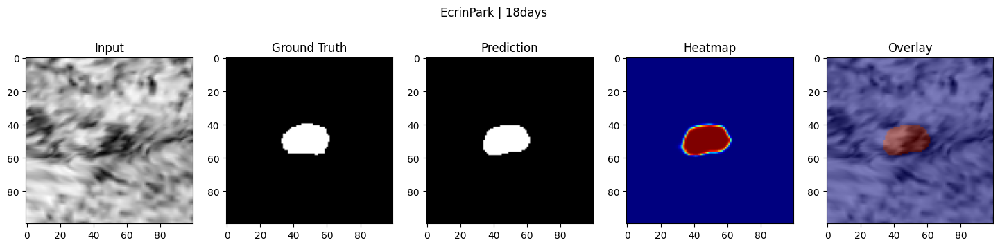


----------------------------------------------------------------------
EcrinPark | 18days
----------------------------------------------------------------------
Mean Coherence : 0.6725
Phase Std      : 0.9705
GT Area        : 429
Pred Area      : 407
Area Diff      : 22
Dice           : 0.9426
IoU            : 0.8914
F1 Score       : 0.9426

Coherence Trend : Possible Ground Change
Phase Activity  : Low Deformation
Area Error      : 22 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.



REGION : OutsideTheBox
Selected Sample : 69_77.tif


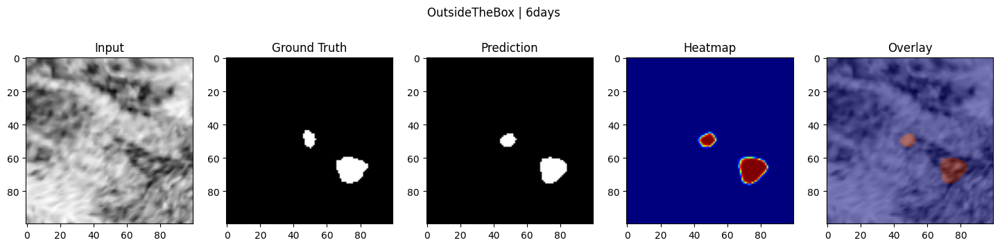


----------------------------------------------------------------------
OutsideTheBox | 6days
----------------------------------------------------------------------
Mean Coherence : 0.6293
Phase Std      : 2.2891
GT Area        : 279
Pred Area      : 252
Area Diff      : 27
Dice           : 0.8814
IoU            : 0.7879
F1 Score       : 0.8814

Coherence Trend : Possible Ground Change
Phase Activity  : High Deformation
Area Error      : 27 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



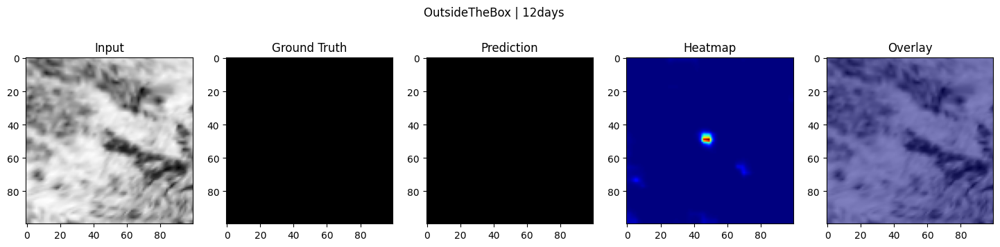


----------------------------------------------------------------------
OutsideTheBox | 12days
----------------------------------------------------------------------
Mean Coherence : 0.7035
Phase Std      : 1.9143
GT Area        : 0
Pred Area      : 0
Area Diff      : 0
Dice           : 0.0000
IoU            : 0.0000
F1 Score       : 0.0000

Coherence Trend : Stable Terrain
Phase Activity  : High Deformation
Area Error      : 0 pixels

Interpretation: Significant mismatch exists between prediction and ground truth.
Observation: High phase variation indicates stronger deformation.
Observation: Predicted landslide area closely matches actual area.



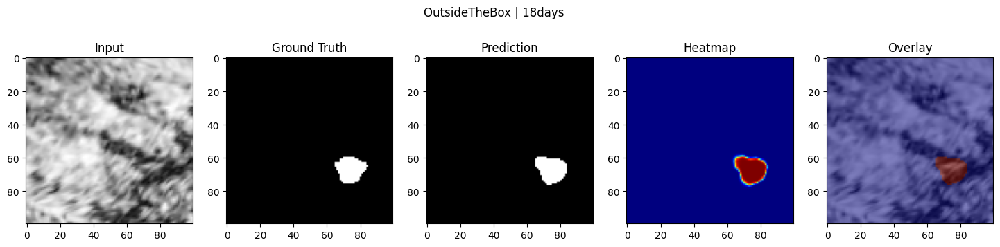


----------------------------------------------------------------------
OutsideTheBox | 18days
----------------------------------------------------------------------
Mean Coherence : 0.6219
Phase Std      : 0.5559
GT Area        : 223
Pred Area      : 235
Area Diff      : 12
Dice           : 0.9083
IoU            : 0.8320
F1 Score       : 0.9083

Coherence Trend : Possible Ground Change
Phase Activity  : Low Deformation
Area Error      : 12 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: Predicted landslide area closely matches actual area.



REGION : QueyrasPark
Selected Sample : 169_35.tif


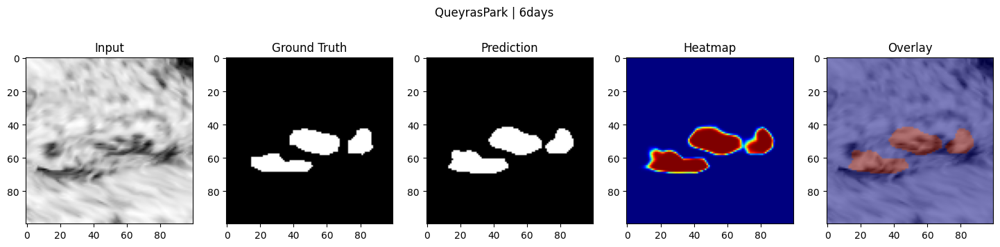


----------------------------------------------------------------------
QueyrasPark | 6days
----------------------------------------------------------------------
Mean Coherence : 0.7699
Phase Std      : 1.8943
GT Area        : 805
Pred Area      : 899
Area Diff      : 94
Dice           : 0.8979
IoU            : 0.8147
F1 Score       : 0.8979

Coherence Trend : Stable Terrain
Phase Activity  : High Deformation
Area Error      : 94 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



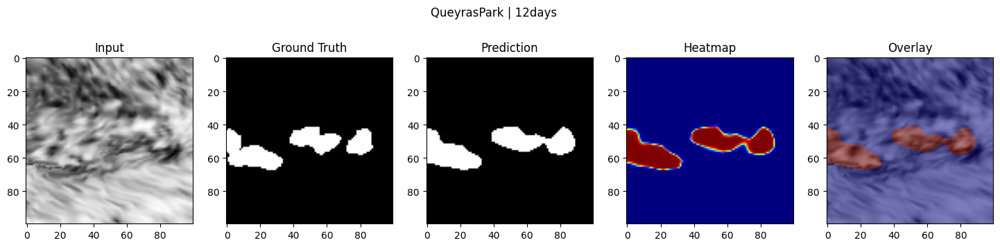


----------------------------------------------------------------------
QueyrasPark | 12days
----------------------------------------------------------------------
Mean Coherence : 0.6351
Phase Std      : 1.0808
GT Area        : 936
Pred Area      : 997
Area Diff      : 61
Dice           : 0.9146
IoU            : 0.8427
F1 Score       : 0.9146

Coherence Trend : Possible Ground Change
Phase Activity  : High Deformation
Area Error      : 61 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



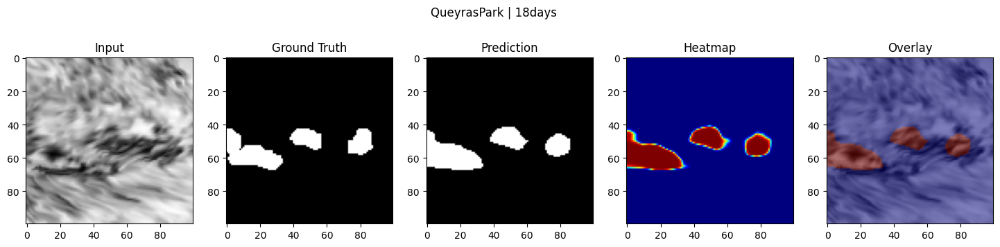


----------------------------------------------------------------------
QueyrasPark | 18days
----------------------------------------------------------------------
Mean Coherence : 0.6457
Phase Std      : 0.6860
GT Area        : 792
Pred Area      : 850
Area Diff      : 58
Dice           : 0.8599
IoU            : 0.7543
F1 Score       : 0.8599

Coherence Trend : Possible Ground Change
Phase Activity  : Low Deformation
Area Error      : 58 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.



REGION : Vanoise
Selected Sample : 29_24.tif


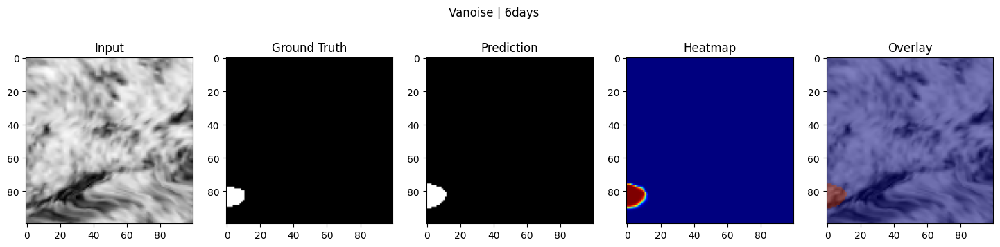


----------------------------------------------------------------------
Vanoise | 6days
----------------------------------------------------------------------
Mean Coherence : 0.6977
Phase Std      : 2.2860
GT Area        : 111
Pred Area      : 133
Area Diff      : 22
Dice           : 0.9098
IoU            : 0.8346
F1 Score       : 0.9098

Coherence Trend : Possible Ground Change
Phase Activity  : High Deformation
Area Error      : 22 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.



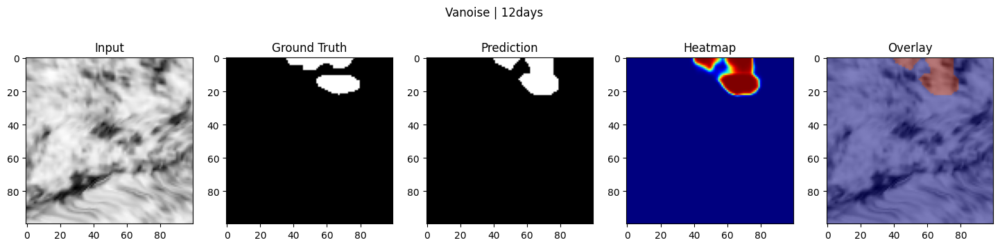


----------------------------------------------------------------------
Vanoise | 12days
----------------------------------------------------------------------
Mean Coherence : 0.7447
Phase Std      : 0.7304
GT Area        : 468
Pred Area      : 489
Area Diff      : 21
Dice           : 0.8171
IoU            : 0.6908
F1 Score       : 0.8171

Coherence Trend : Stable Terrain
Phase Activity  : Low Deformation
Area Error      : 21 pixels

Interpretation: Landslide region is detected correctly but boundary mismatch exists.



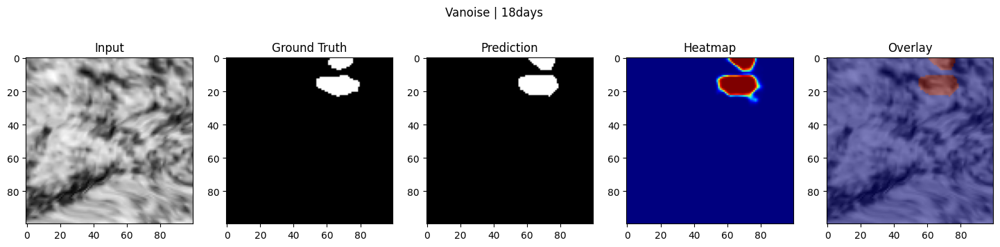


----------------------------------------------------------------------
Vanoise | 18days
----------------------------------------------------------------------
Mean Coherence : 0.6359
Phase Std      : 2.7451
GT Area        : 335
Pred Area      : 349
Area Diff      : 14
Dice           : 0.8889
IoU            : 0.8000
F1 Score       : 0.8889

Coherence Trend : Possible Ground Change
Phase Activity  : High Deformation
Area Error      : 14 pixels

Interpretation: Landslide region is accurately localized with excellent overlap.
Observation: High phase variation indicates stronger deformation.
Observation: Predicted landslide area closely matches actual area.



In [80]:
# import required libraries
import matplotlib.pyplot as plt
import numpy as np
import torch
import tifffile as tiff
import os

# list of study regions
regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

# temporal baselines to compare
baselines = [

    "6days",

    "12days",

    "18days"

]

# list to store summary analysis results for all regions and baselines
summary_results = []

# loop through each region
for region in regions:

    print("\n")
    print("="*90)
    print(f"REGION : {region}")
    print("="*90)

    # skip region if no common sample exists across all temporal baselines
    if len(common_samples[region]) == 0:

        print("No common sample found")
        continue

    # select the middle common sample for comparison
    sample_name = common_samples[region][

        len(common_samples[region]) // 2

    ]

    print(
        f"Selected Sample : {sample_name}"
    )

    # loop through each temporal baseline
    for baseline in baselines:

        selected_sample = None

        # search the matching sample in dataset
        for sample in dataset.samples:

            temporal, reg, coh_file, phase_file, mask_file = sample

            if (

                temporal == baseline

                and

                reg == region

                and

                os.path.basename(
                    coh_file
                ) == sample_name

            ):

                selected_sample = sample

                break

        # skip if sample is not found
        if selected_sample is None:

            continue

        # unpack sample file paths
        temporal, reg, coh_file, phase_file, mask_file = selected_sample

        # load coherence image, phase image, and ground-truth mask
        coherence = tiff.imread(
            coh_file
        ).astype(np.float32)

        phase = tiff.imread(
            phase_file
        ).astype(np.float32)

        gt_mask = tiff.imread(
            mask_file
        ).astype(np.float32)

        # decompose phase into cosine and sine channels
        cos_phase = np.cos(
            phase
        )

        sin_phase = np.sin(
            phase
        )

        # create 3-channel model input
        image = np.stack(

            [

                coherence,

                cos_phase,

                sin_phase

            ],

            axis=0

        )

        # normalize each input channel
        for c in range(
            image.shape[0]
        ):

            image[c] = (

                image[c]

                -

                image[c].mean()

            ) / (

                image[c].std()

                +

                1e-8

            )

        # convert image into tensor and add batch dimension
        tensor = torch.tensor(

            image,

            dtype=torch.float32

        ).unsqueeze(0).to(device)

        # run model inference
        with torch.no_grad():

            output = model(
                tensor
            )

            prob = torch.sigmoid(
                output
            )

        # convert probability map into binary prediction
        pred_mask = (

            prob > 0.5

        ).float()

        pred_mask_np = pred_mask.squeeze().cpu().numpy()

        # store raw probability map for heatmap visualization
        heatmap = prob.squeeze().cpu().numpy()

        # ==================================
        # ANALYSIS METRICS
        # ==================================

        # average coherence of the sample
        coh_mean = coherence.mean()

        # standard deviation of phase values
        phase_std = phase.std()

        # number of positive pixels in ground truth mask
        gt_area = np.sum(
            gt_mask > 0.5
        )

        # number of positive pixels in predicted mask
        pred_area = np.sum(
            pred_mask_np > 0.5
        )

        # absolute difference between predicted and actual landslide area
        area_diff = abs(

            gt_area

            -

            pred_area

        )

        # overlapping landslide pixels between prediction and ground truth
        intersection = np.sum(

            gt_mask

            *

            pred_mask_np

        )

        # Dice score
        dice = (

            2 * intersection

        ) / (

            gt_mask.sum()

            +

            pred_mask_np.sum()

            +

            1e-8

        )

        # IoU score
        iou = (

            intersection

        ) / (

            gt_mask.sum()

            +

            pred_mask_np.sum()

            -

            intersection

            +

            1e-8

        )

        # precision
        precision = intersection / (

            pred_mask_np.sum()

            +

            1e-8

        )

        # recall
        recall = intersection / (

            gt_mask.sum()

            +

            1e-8

        )

        # F1 score
        f1 = (

            2

            *

            precision

            *

            recall

        ) / (

            precision

            +

            recall

            +

            1e-8

        )

        # store summary metrics for later comparison
        summary_results.append(

            [

                region,

                baseline,

                coh_mean,

                phase_std,

                gt_area,

                pred_area,

                area_diff,

                dice,

                iou,

                f1

            ]

        )

        # ==================================
        # VISUALIZATION
        # ==================================

        # create figure with 5 visual outputs
        fig, ax = plt.subplots(

            1,

            5,

            figsize=(18,4)

        )

        fig.suptitle(

            f"{region} | {baseline}"

        )

        # input coherence image
        ax[0].imshow(
            coherence,
            cmap="gray"
        )

        ax[0].set_title(
            "Input"
        )

        # ground-truth mask
        ax[1].imshow(
            gt_mask,
            cmap="gray"
        )

        ax[1].set_title(
            "Ground Truth"
        )

        # predicted binary mask
        ax[2].imshow(
            pred_mask_np,
            cmap="gray"
        )

        ax[2].set_title(
            "Prediction"
        )

        # prediction heatmap
        ax[3].imshow(
            heatmap,
            cmap="jet"
        )

        ax[3].set_title(
            "Heatmap"
        )

        # overlay prediction on coherence image
        ax[4].imshow(
            coherence,
            cmap="gray"
        )

        ax[4].imshow(

            pred_mask_np,

            cmap="jet",

            alpha=0.5

        )

        ax[4].set_title(
            "Overlay"
        )

        plt.show()

        # ==================================
        # TEXTUAL ANALYSIS
        # ==================================

        print()

        print("-"*70)

        print(
            f"{region} | {baseline}"
        )

        print("-"*70)

        # print computed numerical metrics
        print(
            f"Mean Coherence : {coh_mean:.4f}"
        )

        print(
            f"Phase Std      : {phase_std:.4f}"
        )

        print(
            f"GT Area        : {gt_area}"
        )

        print(
            f"Pred Area      : {pred_area}"
        )

        print(
            f"Area Diff      : {area_diff}"
        )

        print(
            f"Dice           : {dice:.4f}"
        )

        print(
            f"IoU            : {iou:.4f}"
        )

        print(
            f"F1 Score       : {f1:.4f}"
        )

        print()

        # simple terrain and deformation interpretation
        print(
            f"Coherence Trend : {'Stable Terrain' if coh_mean > 0.7 else 'Possible Ground Change'}"
        )

        print(
            f"Phase Activity  : {'High Deformation' if phase_std > 1.0 else 'Low Deformation'}"
        )

        print(
            f"Area Error      : {area_diff} pixels"
        )

        print()

        # interpret Dice score quality
        if dice > 0.85:

            print(
                "Interpretation: Landslide region is accurately localized with excellent overlap."
            )

        elif dice > 0.70:

            print(
                "Interpretation: Landslide region is detected correctly but boundary mismatch exists."
            )

        else:

            print(
                "Interpretation: Significant mismatch exists between prediction and ground truth."
            )

        # extra observations based on coherence, phase, and area difference
        if coh_mean < 0.60:

            print(
                "Observation: Low coherence suggests unstable terrain."
            )

        if phase_std > 1.0:

            print(
                "Observation: High phase variation indicates stronger deformation."
            )

        if area_diff < 20:

            print(
                "Observation: Predicted landslide area closely matches actual area."
            )

        print()

# Cell 26 : Final Research Analysis Table

## Creating the Temporal Analysis Summary Table

- This cell converts the collected **temporal analysis results** into a pandas DataFrame.
- The table contains region-wise and baseline-wise values of:
  - **Coherence**
  - **Phase variation**
  - **Ground-truth area**
  - **Predicted area**
  - **Area difference**
  - **Dice**
  - **IoU**
  - **F1**
- It first displays the **complete temporal analysis table**.
- Then it computes and displays the **region-wise average summary** for easier comparison.

In [82]:
# import pandas and numpy for tabular analysis
import pandas as pd
import numpy as np

# column names for the temporal analysis summary table
columns = [

    "Region",

    "Baseline",

    "Coh Mean",

    "Phase Std",

    "GT Area",

    "Pred Area",

    "Area Diff",

    "Dice",

    "IoU",

    "F1"

]

# create a DataFrame from the collected summary results
df = pd.DataFrame(

    summary_results,

    columns=columns

)

print("\n")

print("=" * 120)

# print heading for the complete temporal analysis table
print("COMPLETE REGION-WISE TEMPORAL ANALYSIS")

print("=" * 120)

# display the full region-wise and baseline-wise analysis table
display(df)

print("\n")

print("=" * 120)

# print heading for region-wise statistical summary
print("REGION-WISE STATISTICAL SUMMARY")

print("=" * 120)

# group the table by region and compute mean values of important metrics
display(

    df.groupby(

        "Region"

    )[[

        "Coh Mean",

        "Phase Std",

        "GT Area",

        "Pred Area",

        "Area Diff",

        "Dice",

        "IoU",

        "F1"

    ]].mean()

)



COMPLETE REGION-WISE TEMPORAL ANALYSIS


,Region,Baseline,Coh Mean,Phase Std,GT Area,Pred Area,Area Diff,Dice,IoU,F1
0,EcrinPark,6days,0.744078,1.199477,677,746,69,0.917779,0.848052,0.917779
1,EcrinPark,12days,0.827928,2.665709,549,598,49,0.868352,0.767334,0.868352
2,EcrinPark,18days,0.672502,0.970503,429,407,22,0.942584,0.891403,0.942584
3,OutsideTheBox,6days,0.629318,2.289106,279,252,27,0.881356,0.787879,0.881356
4,OutsideTheBox,12days,0.703515,1.914295,0,0,0,0.000000,0.000000,0.000000
5,OutsideTheBox,18days,0.621899,0.555948,223,235,12,0.908297,0.832000,0.908297
6,QueyrasPark,6days,0.769927,1.894331,805,899,94,0.897887,0.814696,0.897887
7,QueyrasPark,12days,0.635109,1.080801,936,997,61,0.914640,0.842707,0.914640
8,QueyrasPark,18days,0.645689,0.686026,792,850,58,0.859927,0.754274,0.859927
9,Vanoise,6days,0.697740,2.286012,111,133,22,0.909836,0.834586,0.909836




REGION-WISE STATISTICAL SUMMARY


,Coh Mean,Phase Std,GT Area,Pred Area,Area Diff,Dice,IoU,F1
Region,,,,,,,,
EcrinPark,0.748169,1.611896,551.666667,583.666667,46.666667,0.909572,0.835596,0.909572
OutsideTheBox,0.651577,1.586450,167.333333,162.333333,13.000000,0.596551,0.539960,0.596551
QueyrasPark,0.683575,1.220386,844.333333,915.333333,71.000000,0.890818,0.803892,0.890818
Vanoise,0.692775,1.920507,304.666667,323.666667,19.000000,0.871954,0.775133,0.871954


Temporal Change Analysis

In [83]:
regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

change_results = []

for region in regions:

    temp_df = df[

        df["Region"] == region

    ]

    temp_df = temp_df.set_index(

        "Baseline"

    )

    try:

        # ==========================
        # COHERENCE
        # ==========================

        coh_6 = temp_df.loc[
            "6days",
            "Coh Mean"
        ]

        coh_12 = temp_df.loc[
            "12days",
            "Coh Mean"
        ]

        coh_18 = temp_df.loc[
            "18days",
            "Coh Mean"
        ]

        # ==========================
        # PHASE
        # ==========================

        phase_6 = temp_df.loc[
            "6days",
            "Phase Std"
        ]

        phase_12 = temp_df.loc[
            "12days",
            "Phase Std"
        ]

        phase_18 = temp_df.loc[
            "18days",
            "Phase Std"
        ]

        # ==========================
        # DICE
        # ==========================

        dice_6 = temp_df.loc[
            "6days",
            "Dice"
        ]

        dice_12 = temp_df.loc[
            "12days",
            "Dice"
        ]

        dice_18 = temp_df.loc[
            "18days",
            "Dice"
        ]

        # ==========================
        # IOU
        # ==========================

        iou_6 = temp_df.loc[
            "6days",
            "IoU"
        ]

        iou_12 = temp_df.loc[
            "12days",
            "IoU"
        ]

        iou_18 = temp_df.loc[
            "18days",
            "IoU"
        ]

        # ==========================
        # F1
        # ==========================

        f1_6 = temp_df.loc[
            "6days",
            "F1"
        ]

        f1_12 = temp_df.loc[
            "12days",
            "F1"
        ]

        f1_18 = temp_df.loc[
            "18days",
            "F1"
        ]

        # ==========================
        # GT AREA
        # ==========================

        gt_6 = temp_df.loc[
            "6days",
            "GT Area"
        ]

        gt_12 = temp_df.loc[
            "12days",
            "GT Area"
        ]

        gt_18 = temp_df.loc[
            "18days",
            "GT Area"
        ]

        # ==========================
        # PRED AREA
        # ==========================

        pred_6 = temp_df.loc[
            "6days",
            "Pred Area"
        ]

        pred_12 = temp_df.loc[
            "12days",
            "Pred Area"
        ]

        pred_18 = temp_df.loc[
            "18days",
            "Pred Area"
        ]

        # ==========================
        # AREA DIFFERENCE
        # ==========================

        diff_6 = temp_df.loc[
            "6days",
            "Area Diff"
        ]

        diff_12 = temp_df.loc[
            "12days",
            "Area Diff"
        ]

        diff_18 = temp_df.loc[
            "18days",
            "Area Diff"
        ]

        change_results.append(

            [

                region,

                coh_12 - coh_6,
                coh_18 - coh_12,
                coh_18 - coh_6,

                phase_12 - phase_6,
                phase_18 - phase_12,
                phase_18 - phase_6,

                dice_12 - dice_6,
                dice_18 - dice_12,
                dice_18 - dice_6,

                iou_12 - iou_6,
                iou_18 - iou_12,
                iou_18 - iou_6,

                f1_12 - f1_6,
                f1_18 - f1_12,
                f1_18 - f1_6,

                gt_12 - gt_6,
                gt_18 - gt_12,
                gt_18 - gt_6,

                pred_12 - pred_6,
                pred_18 - pred_12,
                pred_18 - pred_6,

                diff_12 - diff_6,
                diff_18 - diff_12,
                diff_18 - diff_6

            ]

        )

    except:

        pass

## Creating the Temporal Change Analysis Table

- This cell creates a DataFrame for **temporal change analysis** across the three baselines.
- It stores the change values for:
  - **Coherence**
  - **Phase**
  - **Dice**
  - **IoU**
  - **F1**
  - **Ground Truth Area**
  - **Predicted Area**
  - **Area Difference**
- The changes are measured between:
  - **6 → 12 days**
  - **12 → 18 days**
  - **6 → 18 days**
- Finally, the complete temporal change analysis table is displayed.

In [84]:
# create a DataFrame to store temporal change analysis results
change_df = pd.DataFrame(

    change_results,

    columns=[

        "Region",

        # ==========================
        # COHERENCE CHANGES
        # ==========================

        "Coh Δ 6→12",

        "Coh Δ 12→18",

        "Coh Δ 6→18",

        # ==========================
        # PHASE CHANGES
        # ==========================

        "Phase Δ 6→12",

        "Phase Δ 12→18",

        "Phase Δ 6→18",

        # ==========================
        # DICE SCORE CHANGES
        # ==========================

        "Dice Δ 6→12",

        "Dice Δ 12→18",

        "Dice Δ 6→18",

        # ==========================
        # IoU CHANGES
        # ==========================

        "IoU Δ 6→12",

        "IoU Δ 12→18",

        "IoU Δ 6→18",

        # ==========================
        # F1 SCORE CHANGES
        # ==========================

        "F1 Δ 6→12",

        "F1 Δ 12→18",

        "F1 Δ 6→18",

        # ==========================
        # GROUND-TRUTH AREA CHANGES
        # ==========================

        "GT Area Δ 6→12",

        "GT Area Δ 12→18",

        "GT Area Δ 6→18",

        # ==========================
        # PREDICTED AREA CHANGES
        # ==========================

        "Pred Area Δ 6→12",

        "Pred Area Δ 12→18",

        "Pred Area Δ 6→18",

        # ==========================
        # AREA DIFFERENCE CHANGES
        # ==========================

        "Area Diff Δ 6→12",

        "Area Diff Δ 12→18",

        "Area Diff Δ 6→18"

    ]

)

print("\n")

print("=" * 140)

# heading for temporal change analysis table
print("TEMPORAL CHANGE ANALYSIS")

print("=" * 140)

# display the final temporal change analysis DataFrame
display(change_df)



TEMPORAL CHANGE ANALYSIS


,Region,Coh Δ 6→12,Coh Δ 12→18,Coh Δ 6→18,Phase Δ 6→12,Phase Δ 12→18,Phase Δ 6→18,Dice Δ 6→12,Dice Δ 12→18,Dice Δ 6→18,...,F1 Δ 6→18,GT Area Δ 6→12,GT Area Δ 12→18,GT Area Δ 6→18,Pred Area Δ 6→12,Pred Area Δ 12→18,Pred Area Δ 6→18,Area Diff Δ 6→12,Area Diff Δ 12→18,Area Diff Δ 6→18
0,EcrinPark,0.083850,-0.155425,-0.071575,1.466232,-1.695206,-0.228974,-0.049427,0.074232,0.024804,...,0.024804,-128,-120,-248,-148,-191,-339,-20,-27,-47
1,OutsideTheBox,0.074197,-0.081616,-0.007419,-0.374811,-1.358347,-1.733158,-0.881356,0.908297,0.026941,...,0.026941,-279,223,-56,-252,235,-17,-27,12,-15
2,QueyrasPark,-0.134818,0.010580,-0.124238,-0.813530,-0.394774,-1.208304,0.016753,-0.054713,-0.037960,...,-0.037960,131,-144,-13,98,-147,-49,-33,-3,-36
3,Vanoise,0.046970,-0.108833,-0.061864,-1.555591,2.014668,0.459077,-0.092699,0.071752,-0.020947,...,-0.020947,357,-133,224,356,-140,216,-1,-7,-8


# **6 DAYS ANALYSIS**

# **cell 27A**  -> Find Two-Month Date Pairs

## Selecting Date Pairs for Region-wise Comparison

- This cell selects **date-folder pairs** for each region from the **6-day baseline** data.
- For every region, it collects all available date folders and sorts them.
- Then it selects **two specific pairs of dates** for comparison.
- These selected pairs are stored region-wise for later temporal analysis and visualization.

In [85]:
# import os for path handling
import os

# list of regions to analyze
regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

# dictionary to store selected date-folder pairs for each region
selected_pairs = {}

# loop through each region
for region in regions:

    # list to store all available date folders for the current region
    date_folders = []

    # scan all dataset samples
    for sample in dataset.samples:

        temporal, reg, coh_file, _, _ = sample

        # only consider 6-day baseline samples of the current region
        if (

            temporal == "6days"

            and

            reg == region

        ):

            # extract the date-folder name from the coherence file path
            folder_name = os.path.basename(

                os.path.dirname(

                    os.path.dirname(
                        coh_file
                    )

                )

            )

            # store the folder name
            date_folders.append(
                folder_name
            )

    # remove duplicates and sort the folder names
    date_folders = sorted(

        list(
            set(date_folders)
        )

    )

    # skip region if there are not enough date folders
    if len(date_folders) < 4:

        continue

    # select first comparison pair
    pair1 = (

        date_folders[0],

        date_folders[8]

    )

    # select second comparison pair
    pair2 = (

        date_folders[4],

        date_folders[12]

    )

    # store both selected pairs for the current region
    selected_pairs[region] = [

        pair1,

        pair2

    ]

    print()

    print("="*80)

    # print region name
    print(region)

    print("="*80)

    # print first selected pair
    print(

        "Pair 1 :",

        pair1[0],

        "vs",

        pair1[1]

    )

    # print second selected pair
    print(

        "Pair 2 :",

        pair2[0],

        "vs",

        pair2[1]

    )


EcrinPark
Pair 1 : 01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018
Pair 2 : 07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018

OutsideTheBox
Pair 1 : 01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018
Pair 2 : 07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018

QueyrasPark
Pair 1 : 01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018
Pair 2 : 07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018

Vanoise
Pair 1 : 01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018
Pair 2 : 07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018


# **cell 27B** - Visual Comparison (8 Comparisons / 16 Images)

## Visualizing Selected Temporal Comparisons

- This cell performs **pair-wise temporal comparison** for each region.
- For every selected date pair, it finds the corresponding **6-day baseline samples**.
- Each sample is passed through the trained model to generate predictions.
- For both dates in the pair, it visualizes:
  - **Input image**
  - **Ground Truth**
  - **Prediction**
  - **Heatmap**
  - **Overlay**
- This helps visually compare landslide behavior between two selected time periods.



EcrinPark

Comparison 1
01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018


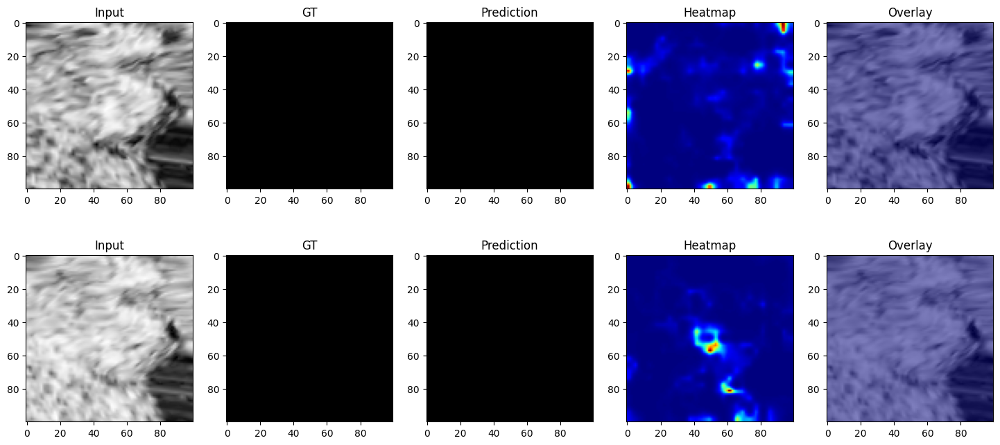


Comparison 2
07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018


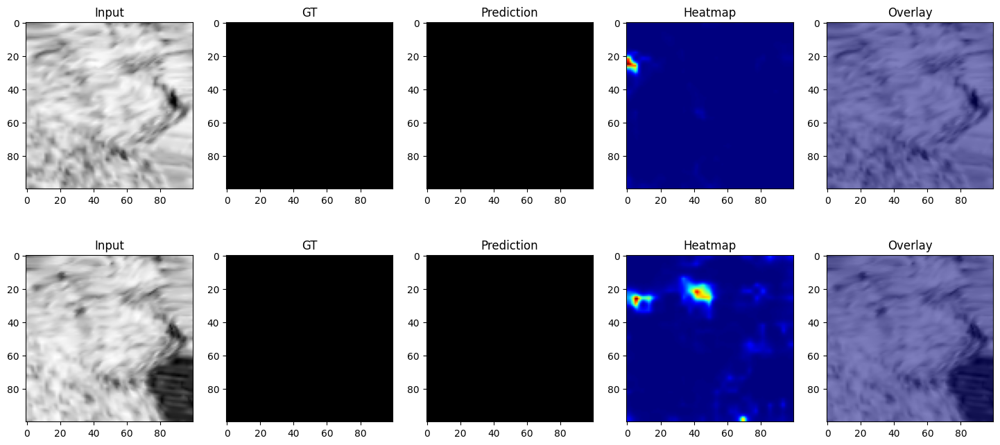



OutsideTheBox

Comparison 1
01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018


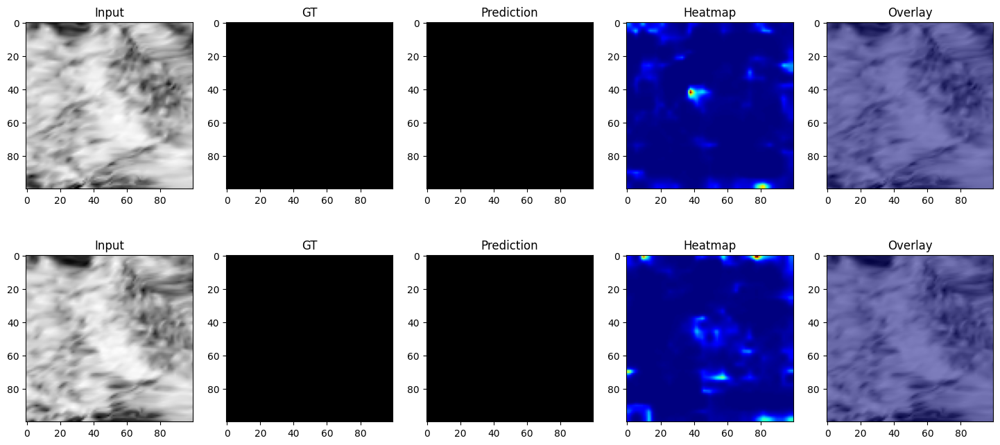


Comparison 2
07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018


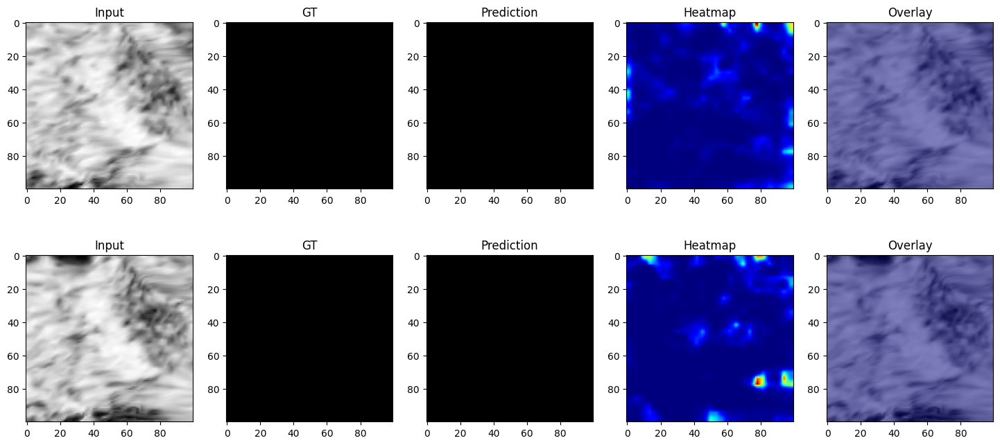



QueyrasPark

Comparison 1
01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018


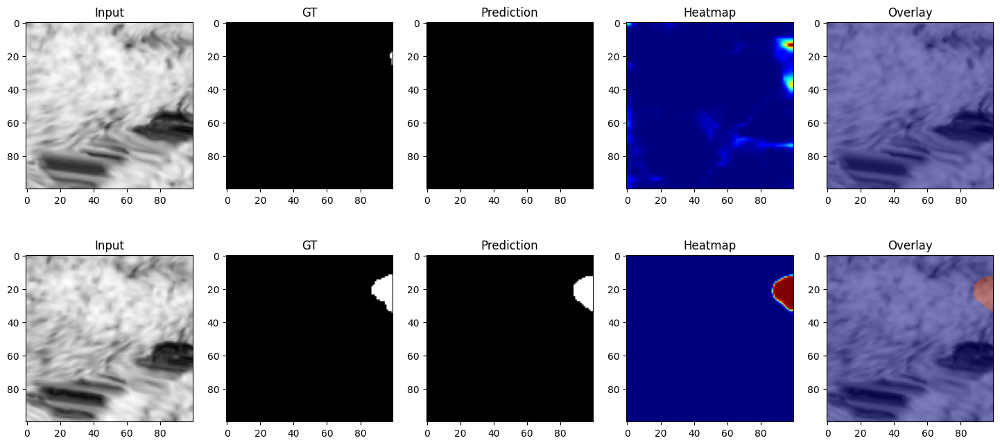


Comparison 2
07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018


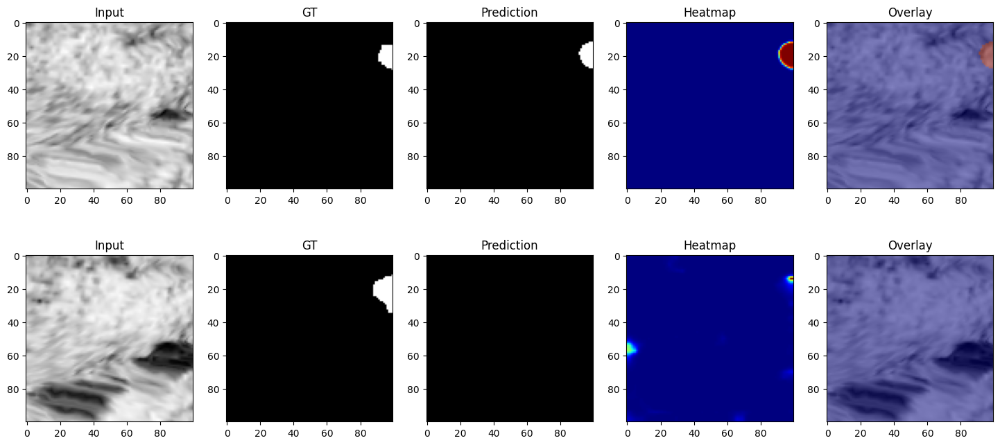



Vanoise

Comparison 1
01Aug2018_07Aug2018 vs 13Aug2018_19Aug2018


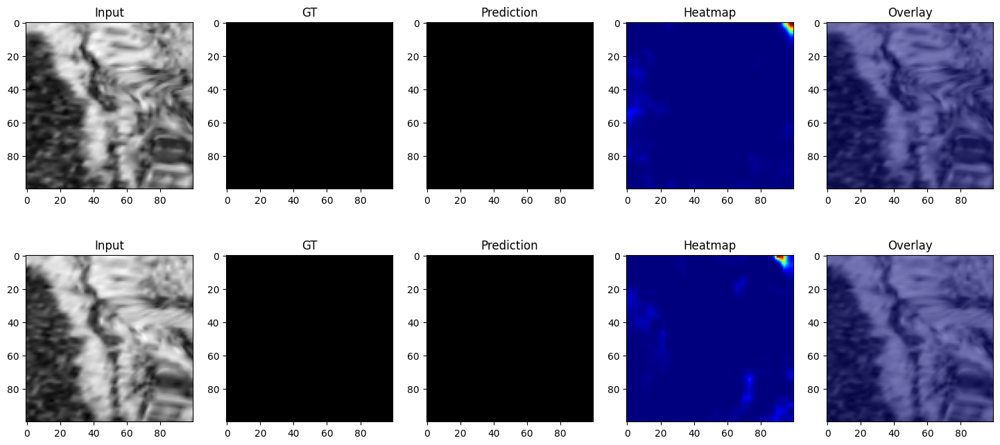


Comparison 2
07Aug2018_13Aug2018 vs 19Aug2018_25Aug2018


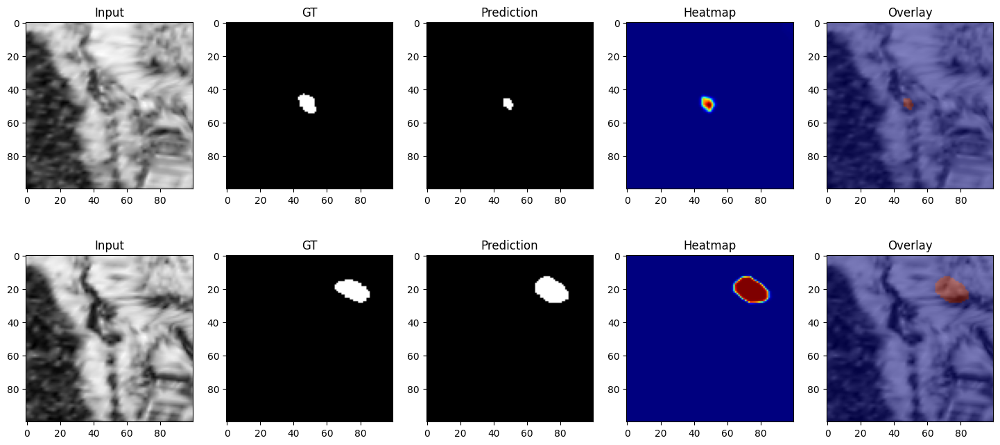

In [86]:
# import required libraries for visualization, image loading, and inference
import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import torch

# list to store results from temporal comparison analysis
temporal_results = []

# loop through each region
for region in regions:

    # skip regions for which no selected date pairs exist
    if region not in selected_pairs:

        continue

    print("\n")
    print("="*100)
    print(region)
    print("="*100)

    # loop through each selected date pair of the current region
    for pair_id, pair in enumerate(

        selected_pairs[region]

    ):

        print()

        # print comparison number
        print(
            f"Comparison {pair_id+1}"
        )

        # print the two selected date folders being compared
        print(
            pair[0],
            "vs",
            pair[1]
        )

        # list to store the two selected image samples for the current comparison
        selected_images = []

        # loop through the two date folders in the selected pair
        for target_folder in pair:

            found = False

            # search the matching sample in the dataset
            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                # extract the folder name from the coherence file path
                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                # select only 6-day samples of the current region with matching folder name
                if (

                    temporal == "6days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    selected_images.append(

                        sample

                    )

                    found = True

                    break

            # if no sample is found for the folder, store None
            if not found:

                selected_images.append(
                    None
                )

        # create a 2 x 5 figure for visual comparison of the two selected samples
        fig, ax = plt.subplots(

            2,

            5,

            figsize=(18,8)

        )

        # loop through the two selected samples (one per row)
        for row, sample in enumerate(

            selected_images

        ):

            # skip if sample is missing
            if sample is None:

                continue

            temporal, reg, coh_file, phase_file, mask_file = sample

            # load coherence image, phase image, and ground-truth mask
            coherence = tiff.imread(

                coh_file

            ).astype(np.float32)

            phase = tiff.imread(

                phase_file

            ).astype(np.float32)

            gt_mask = tiff.imread(

                mask_file

            ).astype(np.float32)

            # decompose phase into cosine and sine channels
            cos_phase = np.cos(

                phase

            )

            sin_phase = np.sin(

                phase

            )

            # create 3-channel model input
            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            # normalize each channel
            for c in range(

                image.shape[0]

            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            # convert image to tensor and add batch dimension
            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            # run model inference
            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            # convert predicted probability map into binary mask
            pred = (

                prob > 0.5

            ).float()

            pred_np = pred.squeeze().cpu().numpy()

            # keep raw probabilities for heatmap visualization
            heatmap = prob.squeeze().cpu().numpy()

            # display input coherence image
            ax[row][0].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][0].set_title(
                "Input"
            )

            # display ground-truth mask
            ax[row][1].imshow(
                gt_mask,
                cmap="gray"
            )

            ax[row][1].set_title(
                "GT"
            )

            # display predicted binary mask
            ax[row][2].imshow(
                pred_np,
                cmap="gray"
            )

            ax[row][2].set_title(
                "Prediction"
            )

            # display prediction heatmap
            ax[row][3].imshow(
                heatmap,
                cmap="jet"
            )

            ax[row][3].set_title(
                "Heatmap"
            )

            # display overlay of prediction on coherence image
            ax[row][4].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][4].imshow(

                pred_np,

                cmap="jet",

                alpha=0.5

            )

            ax[row][4].set_title(
                "Overlay"
            )

        # show the final visualization for the current comparison pair
        plt.show()

# **cell 27C** -  Two-Month Temporal Evolution Metrics Table

## Creating the Two-Month Temporal Evolution Table

- This cell creates a **pair-wise temporal comparison table** for the selected date pairs.
- For each region and each comparison pair, it extracts:
  - **Coherence mean**
  - **Phase standard deviation**
  - **Ground-truth area**
  - **Predicted area**
  - **Dice score**
  - **IoU score**
  - **F1 score**
- The metrics are stored separately for **Date A** and **Date B**.
- Finally, all results are combined into a DataFrame called **two-month temporal evolution table**.

In [87]:
# import required libraries for table creation, image loading, and inference
import pandas as pd
import numpy as np
import tifffile as tiff
import torch
import os

# list to store temporal comparison results
temporal_analysis = []

# loop through each region
for region in regions:

    # skip regions for which no selected date pairs exist
    if region not in selected_pairs:

        continue

    # loop through each selected date pair
    for pair_id, pair in enumerate(

        selected_pairs[region]

    ):

        # store metrics of the two dates in the pair
        pair_metrics = []

        # loop through both folders of the selected pair
        for target_folder in pair:

            sample_found = None

            # search matching sample in the dataset
            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                # extract folder name from coherence file path
                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                # select only 6-day samples of the current region with matching folder
                if (

                    temporal == "6days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    sample_found = sample
                    break

            # skip if no sample is found
            if sample_found is None:

                continue

            temporal_, reg_, coh_file, phase_file, mask_file = sample_found

            # load coherence image, phase image, and ground-truth mask
            coherence = tiff.imread(
                coh_file
            ).astype(np.float32)

            phase = tiff.imread(
                phase_file
            ).astype(np.float32)

            gt_mask = tiff.imread(
                mask_file
            ).astype(np.float32)

            # decompose phase into cosine and sine channels
            cos_phase = np.cos(
                phase
            )

            sin_phase = np.sin(
                phase
            )

            # create 3-channel model input
            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            # normalize each channel
            for c in range(
                image.shape[0]
            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            # convert image to tensor and add batch dimension
            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            # run model inference
            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            # convert probability map into binary mask
            pred_mask = (

                prob > 0.5

            ).float()

            pred_np = pred_mask.squeeze().cpu().numpy()

            # compute overlap between ground truth and prediction
            intersection = np.sum(

                gt_mask

                *

                pred_np

            )

            # Dice score
            dice = (

                2 * intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                +

                1e-8

            )

            # IoU score
            iou = (

                intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                -

                intersection

                +

                1e-8

            )

            # precision
            precision = intersection / (

                pred_np.sum()

                +

                1e-8

            )

            # recall
            recall = intersection / (

                gt_mask.sum()

                +

                1e-8

            )

            # F1 score
            f1 = (

                2

                *

                precision

                *

                recall

            ) / (

                precision

                +

                recall

                +

                1e-8

            )

            # store metrics for the current date folder
            pair_metrics.append(

                [

                    target_folder,
                    coherence.mean(),
                    phase.std(),
                    np.sum(gt_mask > 0.5),
                    np.sum(pred_np > 0.5),
                    dice,
                    iou,
                    f1

                ]

            )

        # if both dates are available, store the comparison row
        if len(pair_metrics) == 2:

            temporal_analysis.append(

                [

                    region,

                    pair_id + 1

                ]

                +

                pair_metrics[0]

                +

                pair_metrics[1]

            )

# column names for the temporal comparison table
columns = [

    "Region",

    "Comparison",

    "Date A",

    "Coh A",

    "Phase A",

    "GT A",

    "Pred A",

    "Dice A",

    "IoU A",

    "F1 A",

    "Date B",

    "Coh B",

    "Phase B",

    "GT B",

    "Pred B",

    "Dice B",

    "IoU B",

    "F1 B"

]

# create final DataFrame
temporal_df = pd.DataFrame(

    temporal_analysis,

    columns=columns

)

# print heading and display the final temporal evolution table
print("="*120)
print("TWO-MONTH TEMPORAL EVOLUTION TABLE")
print("="*120)

display(temporal_df)

TWO-MONTH TEMPORAL EVOLUTION TABLE


,Region,Comparison,Date A,Coh A,Phase A,GT A,Pred A,Dice A,IoU A,F1 A,Date B,Coh B,Phase B,GT B,Pred B,Dice B,IoU B,F1 B
0,EcrinPark,1,01Aug2018_07Aug2018,0.643472,2.666620,0,0,0.000000,0.000000,0.000000,13Aug2018_19Aug2018,0.700833,0.818495,0,0,0.000000,0.000000,0.000000
1,EcrinPark,2,07Aug2018_13Aug2018,0.760157,0.306982,0,0,0.000000,0.000000,0.000000,19Aug2018_25Aug2018,0.726017,0.701000,0,0,0.000000,0.000000,0.000000
2,OutsideTheBox,1,01Aug2018_07Aug2018,0.717441,0.271199,0,0,0.000000,0.000000,0.000000,13Aug2018_19Aug2018,0.703055,0.567300,0,0,0.000000,0.000000,0.000000
3,OutsideTheBox,2,07Aug2018_13Aug2018,0.730428,0.439796,0,0,0.000000,0.000000,0.000000,19Aug2018_25Aug2018,0.724768,0.499065,0,0,0.000000,0.000000,0.000000
4,QueyrasPark,1,01Aug2018_07Aug2018,0.713728,0.552841,11,0,0.000000,0.000000,0.000000,13Aug2018_19Aug2018,0.687648,1.061664,189,189,0.931217,0.871287,0.931217
5,QueyrasPark,2,07Aug2018_13Aug2018,0.716277,1.444131,106,108,0.915888,0.844828,0.915888,19Aug2018_25Aug2018,0.716613,2.543961,183,0,0.000000,0.000000,0.000000
6,Vanoise,1,01Aug2018_07Aug2018,0.494646,1.252581,0,0,0.000000,0.000000,0.000000,13Aug2018_19Aug2018,0.543626,0.759732,0,0,0.000000,0.000000,0.000000
7,Vanoise,2,07Aug2018_13Aug2018,0.574972,0.781156,89,31,0.516667,0.348315,0.516667,19Aug2018_25Aug2018,0.574721,1.495364,192,231,0.865248,0.762500,0.865248


# **CELL 27D** -> Automatic Temporal Change Analysis

## Printing Temporal Change Interpretation

- This cell reads each row of the **two-month temporal evolution table**.
- For every comparison, it calculates the change between **Date A** and **Date B** in:
  - **Coherence**
  - **Phase**
  - **Ground-truth area**
  - **Predicted area**
  - **Dice**
  - **IoU**
  - **F1**
- It then prints a simple interpretation of:
  - **ground stability**
  - **surface deformation**
  - **segmentation performance**
  - **landslide extent change**
- This gives a text-based summary of temporal behavior for each region.

In [88]:
# loop through each row of the temporal comparison table
for i in range(

    len(temporal_df)

):

    # extract one comparison row
    row = temporal_df.iloc[i]

    print("\n")

    print("="*100)

    # print region and comparison number
    print(

        f"Region : {row['Region']}"

    )

    print(

        f"Comparison : {row['Comparison']}"

    )

    print("="*100)

    print()

    # print the two compared dates
    print(

        f"Date A : {row['Date A']}"

    )

    print(

        f"Date B : {row['Date B']}"

    )

    print()

    # compute change in coherence from Date A to Date B
    coh_change = (

        row["Coh B"]

        -

        row["Coh A"]

    )

    # compute change in phase variation
    phase_change = (

        row["Phase B"]

        -

        row["Phase A"]

    )

    # compute change in Dice score
    dice_change = (

        row["Dice B"]

        -

        row["Dice A"]

    )

    # compute change in IoU score
    iou_change = (

        row["IoU B"]

        -

        row["IoU A"]

    )

    # compute change in F1 score
    f1_change = (

        row["F1 B"]

        -

        row["F1 A"]

    )

    # compute change in ground-truth landslide area
    gt_change = (

        row["GT B"]

        -

        row["GT A"]

    )

    # compute change in predicted landslide area
    pred_change = (

        row["Pred B"]

        -

        row["Pred A"]

    )

    # print all temporal changes
    print(
        f"Coherence Change : {coh_change:.4f}"
    )

    print(
        f"Phase Change     : {phase_change:.4f}"
    )

    print(
        f"GT Area Change   : {gt_change}"
    )

    print(
        f"Pred Area Change : {pred_change}"
    )

    print(
        f"Dice Change      : {dice_change:.4f}"
    )

    print(
        f"IoU Change       : {iou_change:.4f}"
    )

    print(
        f"F1 Change        : {f1_change:.4f}"
    )

    print()

    # interpret coherence change
    if coh_change < 0:

        print(
            "Observation: Ground stability decreased over time."
        )

    else:

        print(
            "Observation: Ground remained relatively stable."
        )

    # interpret phase change
    if phase_change > 0:

        print(
            "Observation: Surface deformation increased."
        )

    else:

        print(
            "Observation: Surface deformation reduced."
        )

    # interpret segmentation performance change
    if dice_change > 0:

        print(
            "Observation: Segmentation performance improved."
        )

    else:

        print(
            "Observation: Segmentation performance degraded."
        )

    # interpret landslide area change
    if abs(gt_change) > 0:

        print(
            "Observation: Landslide extent changed over time."
        )

    print()



Region : EcrinPark
Comparison : 1

Date A : 01Aug2018_07Aug2018
Date B : 13Aug2018_19Aug2018

Coherence Change : 0.0574
Phase Change     : -1.8481
GT Area Change   : 0
Pred Area Change : 0
Dice Change      : 0.0000
IoU Change       : 0.0000
F1 Change        : 0.0000

Observation: Ground remained relatively stable.
Observation: Surface deformation reduced.
Observation: Segmentation performance degraded.



Region : EcrinPark
Comparison : 2

Date A : 07Aug2018_13Aug2018
Date B : 19Aug2018_25Aug2018

Coherence Change : -0.0341
Phase Change     : 0.3940
GT Area Change   : 0
Pred Area Change : 0
Dice Change      : 0.0000
IoU Change       : 0.0000
F1 Change        : 0.0000

Observation: Ground stability decreased over time.
Observation: Surface deformation increased.
Observation: Segmentation performance degraded.



Region : OutsideTheBox
Comparison : 1

Date A : 01Aug2018_07Aug2018
Date B : 13Aug2018_19Aug2018

Coherence Change : -0.0144
Phase Change     : 0.2961
GT Area Change   : 0
Pre

# **12 DAYS ANALYSIS**

# **cell 28A**  -> Find Two-Month Date Pairs

In [90]:
import os

regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

selected_pairs_12 = {}

for region in regions:

    date_folders = []

    for sample in dataset.samples:

        temporal, reg, coh_file, _, _ = sample

        if (

            temporal == "12days"

            and

            reg == region

        ):

            folder_name = os.path.basename(

                os.path.dirname(

                    os.path.dirname(
                        coh_file
                    )

                )

            )

            date_folders.append(
                folder_name
            )

    date_folders = sorted(

        list(
            set(date_folders)
        )

    )

    if len(date_folders) < 4:

        continue

    pair1 = (

        date_folders[0],

        date_folders[8]

    )

    pair2 = (

        date_folders[4],

        date_folders[12]

    )

    selected_pairs_12[region] = [

        pair1,

        pair2

    ]

    print()

    print("="*80)

    print(region)

    print("="*80)

    print(

        "Pair 1 :",

        pair1[0],

        "vs",

        pair1[1]

    )

    print(

        "Pair 2 :",

        pair2[0],

        "vs",

        pair2[1]

    )


EcrinPark
Pair 1 : 01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018
Pair 2 : 07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018

OutsideTheBox
Pair 1 : 01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018
Pair 2 : 07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018

QueyrasPark
Pair 1 : 01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018
Pair 2 : 07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018

Vanoise
Pair 1 : 01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018
Pair 2 : 07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018


# **cell 28B** - Visual Comparison (8 Comparisons / 16 Images)



EcrinPark

Comparison 1
01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018


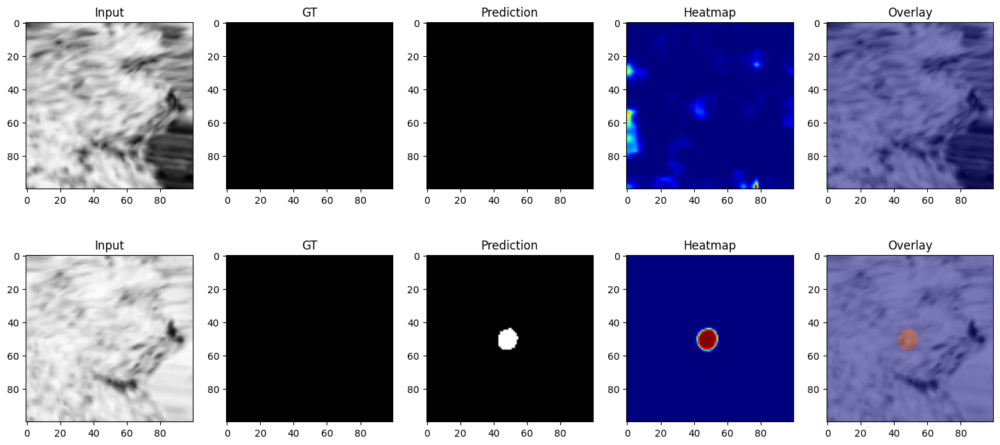


Comparison 2
07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018


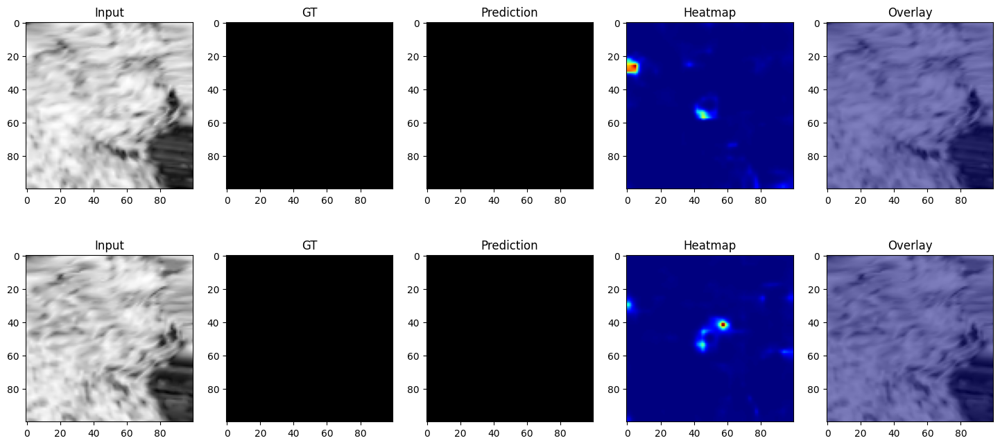



OutsideTheBox

Comparison 1
01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018


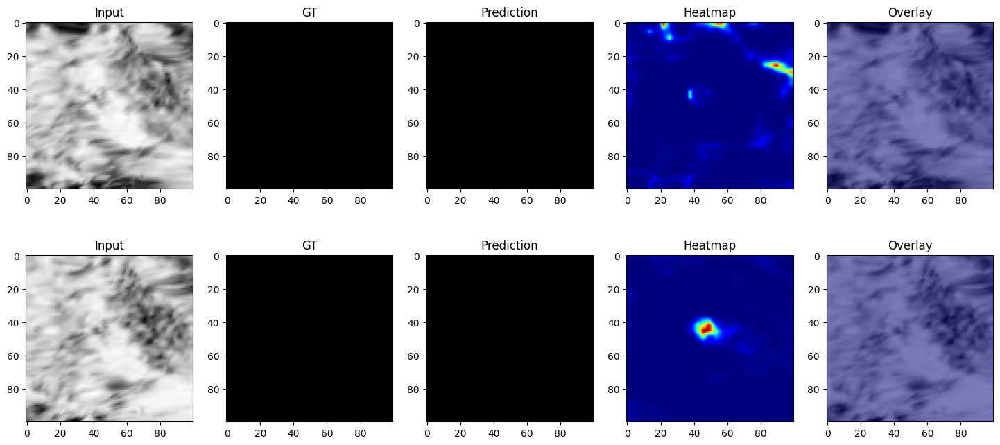


Comparison 2
07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018


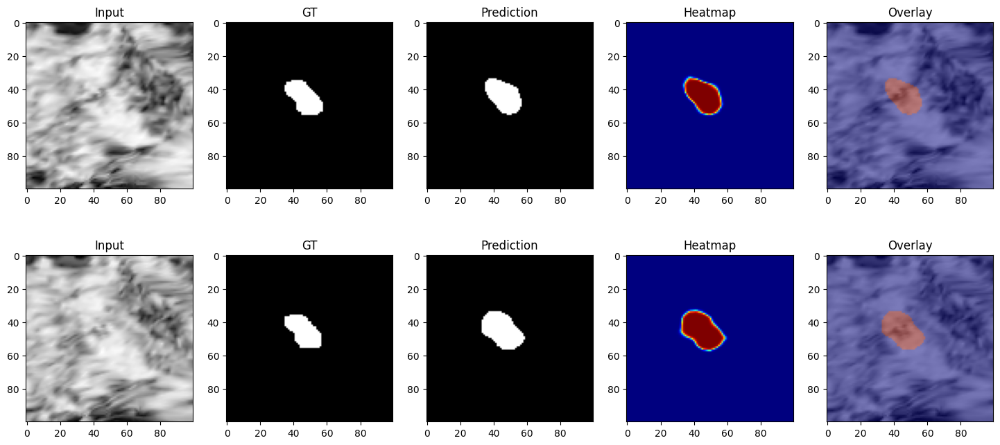



QueyrasPark

Comparison 1
01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018


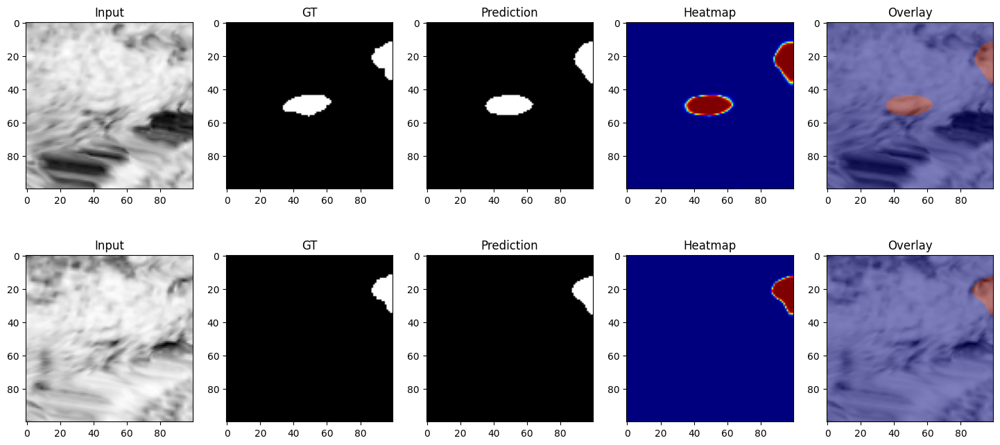


Comparison 2
07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018


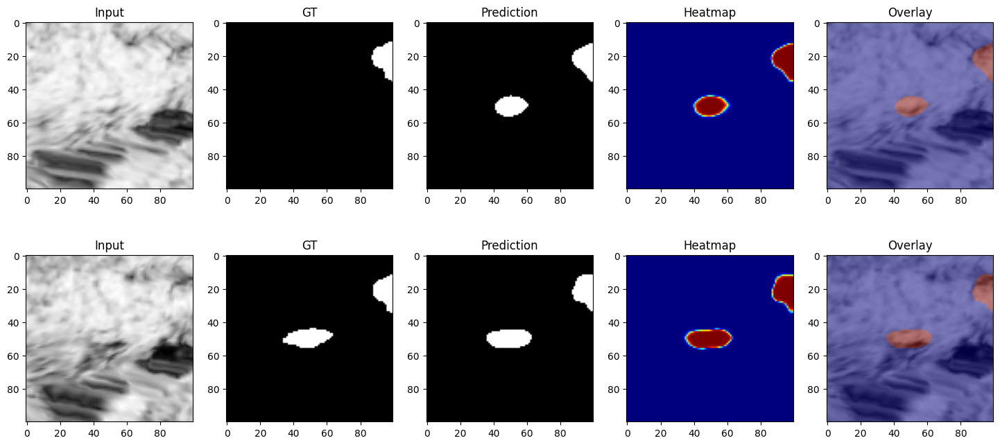



Vanoise

Comparison 1
01Aug2018_13Aug2018 vs 13Aug2018_25Aug2018


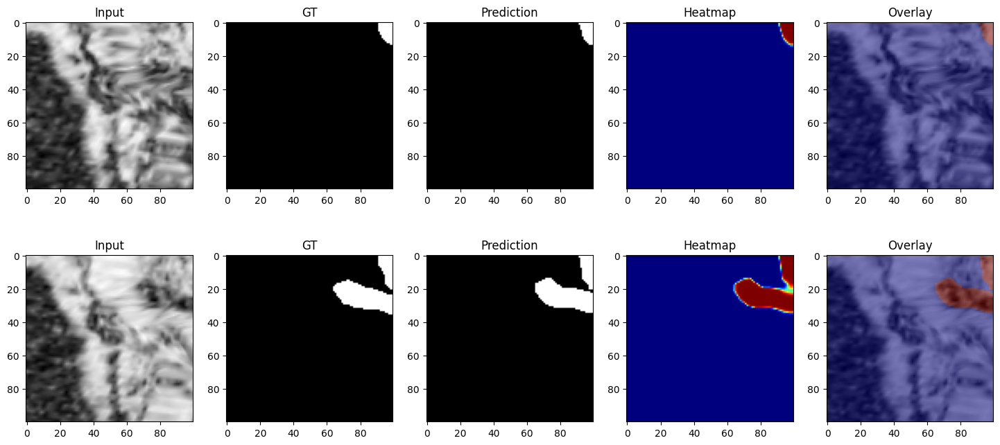


Comparison 2
07Aug2018_19Aug2018 vs 20Jul2018_01Aug2018


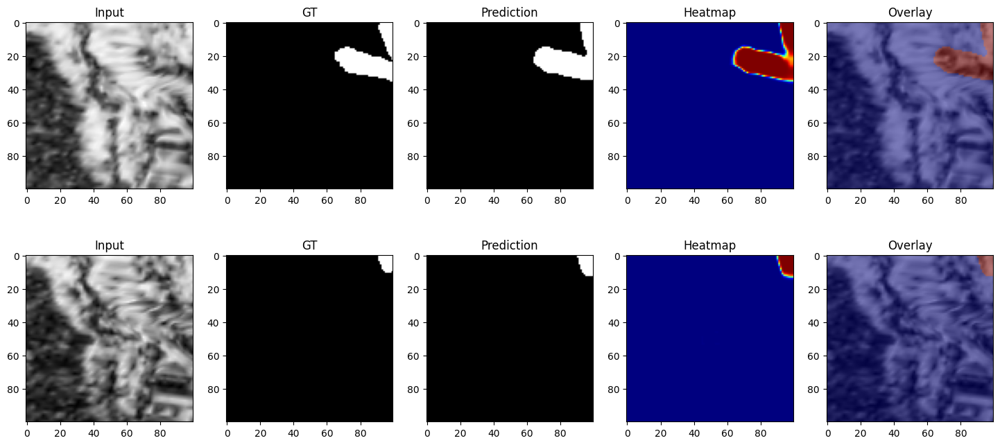

In [91]:
import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import torch

temporal_results = []

for region in regions:

    if region not in selected_pairs_12:

        continue

    print("\n")
    print("="*100)
    print(region)
    print("="*100)

    for pair_id, pair in enumerate(

        selected_pairs_12[region]

    ):

        print()

        print(
            f"Comparison {pair_id+1}"
        )

        print(
            pair[0],
            "vs",
            pair[1]
        )

        selected_images = []

        for target_folder in pair:

            found = False

            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                if (

                    temporal == "12days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    selected_images.append(

                        sample

                    )

                    found = True

                    break

            if not found:

                selected_images.append(
                    None
                )

        fig, ax = plt.subplots(

            2,

            5,

            figsize=(18,8)

        )

        for row, sample in enumerate(

            selected_images

        ):

            if sample is None:

                continue

            temporal, reg, coh_file, phase_file, mask_file = sample

            coherence = tiff.imread(

                coh_file

            ).astype(np.float32)

            phase = tiff.imread(

                phase_file

            ).astype(np.float32)

            gt_mask = tiff.imread(

                mask_file

            ).astype(np.float32)

            cos_phase = np.cos(

                phase

            )

            sin_phase = np.sin(

                phase

            )

            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            for c in range(

                image.shape[0]

            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            pred = (

                prob > 0.5

            ).float()

            pred_np = pred.squeeze().cpu().numpy()

            heatmap = prob.squeeze().cpu().numpy()

            ax[row][0].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][0].set_title(
                "Input"
            )

            ax[row][1].imshow(
                gt_mask,
                cmap="gray"
            )

            ax[row][1].set_title(
                "GT"
            )

            ax[row][2].imshow(
                pred_np,
                cmap="gray"
            )

            ax[row][2].set_title(
                "Prediction"
            )

            ax[row][3].imshow(
                heatmap,
                cmap="jet"
            )

            ax[row][3].set_title(
                "Heatmap"
            )

            ax[row][4].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][4].imshow(

                pred_np,

                cmap="jet",

                alpha=0.5

            )

            ax[row][4].set_title(
                "Overlay"
            )

        plt.show()

# **cell 28C** -  Two-Month Temporal Evolution Metrics Table

In [93]:
import pandas as pd
import numpy as np
import tifffile as tiff
import torch
import os

temporal_analysis = []

for region in regions:

    if region not in selected_pairs_12:

        continue

    for pair_id, pair in enumerate(

        selected_pairs_12[region]

    ):

        pair_metrics = []

        for target_folder in pair:

            sample_found = None

            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                if (

                    temporal == "12days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    sample_found = sample
                    break

            if sample_found is None:

                continue

            temporal_, reg_, coh_file, phase_file, mask_file = sample_found

            coherence = tiff.imread(
                coh_file
            ).astype(np.float32)

            phase = tiff.imread(
                phase_file
            ).astype(np.float32)

            gt_mask = tiff.imread(
                mask_file
            ).astype(np.float32)

            cos_phase = np.cos(
                phase
            )

            sin_phase = np.sin(
                phase
            )

            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            for c in range(
                image.shape[0]
            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            pred_mask = (

                prob > 0.5

            ).float()

            pred_np = pred_mask.squeeze().cpu().numpy()

            intersection = np.sum(

                gt_mask

                *

                pred_np

            )

            dice = (

                2 * intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                +

                1e-8

            )

            iou = (

                intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                -

                intersection

                +

                1e-8

            )

            precision = intersection / (

                pred_np.sum()

                +

                1e-8

            )

            recall = intersection / (

                gt_mask.sum()

                +

                1e-8

            )

            f1 = (

                2

                *

                precision

                *

                recall

            ) / (

                precision

                +

                recall

                +

                1e-8

            )

            pair_metrics.append(

                [

                    target_folder,

                    coherence.mean(),

                    phase.std(),

                    np.sum(gt_mask > 0.5),

                    np.sum(pred_np > 0.5),

                    dice,

                    iou,

                    f1

                ]

            )

        if len(pair_metrics) == 2:

            temporal_analysis.append(

                [

                    region,

                    pair_id + 1

                ]

                +

                pair_metrics[0]

                +

                pair_metrics[1]

            )

columns = [

    "Region",

    "Comparison",

    "Date A",

    "Coh A",

    "Phase A",

    "GT A",

    "Pred A",

    "Dice A",

    "IoU A",

    "F1 A",

    "Date B",

    "Coh B",

    "Phase B",

    "GT B",

    "Pred B",

    "Dice B",

    "IoU B",

    "F1 B"

]

temporal_df_12 = pd.DataFrame(

    temporal_analysis,

    columns=columns

)

print("="*120)
print("TWO-MONTH TEMPORAL EVOLUTION TABLE")
print("="*120)

display(temporal_df_12)

TWO-MONTH TEMPORAL EVOLUTION TABLE


,Region,Comparison,Date A,Coh A,Phase A,GT A,Pred A,Dice A,IoU A,F1 A,Date B,Coh B,Phase B,GT B,Pred B,Dice B,IoU B,F1 B
0,EcrinPark,1,01Aug2018_13Aug2018,0.697877,0.625040,0,0,0.000000,0.000000,0.000000,13Aug2018_25Aug2018,0.830859,1.243134,0,120,0.000000,0.000000,0.000000
1,EcrinPark,2,07Aug2018_19Aug2018,0.740479,0.702691,0,0,0.000000,0.000000,0.000000,20Jul2018_01Aug2018,0.710800,0.733258,0,0,0.000000,0.000000,0.000000
2,OutsideTheBox,1,01Aug2018_13Aug2018,0.710533,2.822346,0,0,0.000000,0.000000,0.000000,13Aug2018_25Aug2018,0.753579,0.763512,0,0,0.000000,0.000000,0.000000
3,OutsideTheBox,2,07Aug2018_19Aug2018,0.688411,1.168025,311,329,0.900000,0.818182,0.900000,20Jul2018_01Aug2018,0.688474,0.514281,300,403,0.844950,0.731527,0.844950
4,QueyrasPark,1,01Aug2018_13Aug2018,0.730476,0.548828,448,466,0.919037,0.850202,0.919037,13Aug2018_25Aug2018,0.805797,0.541916,187,190,0.949602,0.904040,0.949602
5,QueyrasPark,2,07Aug2018_19Aug2018,0.734522,1.687368,202,379,0.647160,0.478372,0.647160,20Jul2018_01Aug2018,0.691697,0.666531,429,457,0.914221,0.841996,0.914221
6,Vanoise,1,01Aug2018_13Aug2018,0.526599,0.857483,101,94,0.953846,0.911765,0.953846,13Aug2018_25Aug2018,0.595521,0.826448,578,588,0.945112,0.895935,0.945111
7,Vanoise,2,07Aug2018_19Aug2018,0.567527,0.922688,563,632,0.928870,0.867188,0.928870,20Jul2018_01Aug2018,0.483889,0.860846,83,105,0.882979,0.790476,0.882979


# **CELL 28D** -> Automatic Temporal Change Analysis

In [94]:
for i in range(

    len(temporal_df_12)

):

    row = temporal_df_12.iloc[i]

    print("\n")

    print("="*100)

    print(

        f"Region : {row['Region']}"

    )

    print(

        f"Comparison : {row['Comparison']}"

    )

    print("="*100)

    print()

    print(

        f"Date A : {row['Date A']}"

    )

    print(

        f"Date B : {row['Date B']}"

    )

    print()

    coh_change = (

        row["Coh B"]

        -

        row["Coh A"]

    )

    phase_change = (

        row["Phase B"]

        -

        row["Phase A"]

    )

    dice_change = (

        row["Dice B"]

        -

        row["Dice A"]

    )

    iou_change = (

        row["IoU B"]

        -

        row["IoU A"]

    )

    f1_change = (

        row["F1 B"]

        -

        row["F1 A"]

    )

    gt_change = (

        row["GT B"]

        -

        row["GT A"]

    )

    pred_change = (

        row["Pred B"]

        -

        row["Pred A"]

    )

    print(
        f"Coherence Change : {coh_change:.4f}"
    )

    print(
        f"Phase Change     : {phase_change:.4f}"
    )

    print(
        f"GT Area Change   : {gt_change}"
    )

    print(
        f"Pred Area Change : {pred_change}"
    )

    print(
        f"Dice Change      : {dice_change:.4f}"
    )

    print(
        f"IoU Change       : {iou_change:.4f}"
    )

    print(
        f"F1 Change        : {f1_change:.4f}"
    )

    print()

    if coh_change < 0:

        print(
            "Observation: Ground stability decreased over time."
        )

    else:

        print(
            "Observation: Ground remained relatively stable."
        )

    if phase_change > 0:

        print(
            "Observation: Surface deformation increased."
        )

    else:

        print(
            "Observation: Surface deformation reduced."
        )

    if dice_change > 0:

        print(
            "Observation: Segmentation performance improved."
        )

    else:

        print(
            "Observation: Segmentation performance degraded."
        )

    if abs(gt_change) > 0:

        print(
            "Observation: Landslide extent changed over time."
        )

    print()



Region : EcrinPark
Comparison : 1

Date A : 01Aug2018_13Aug2018
Date B : 13Aug2018_25Aug2018

Coherence Change : 0.1330
Phase Change     : 0.6181
GT Area Change   : 0
Pred Area Change : 120
Dice Change      : 0.0000
IoU Change       : 0.0000
F1 Change        : 0.0000

Observation: Ground remained relatively stable.
Observation: Surface deformation increased.
Observation: Segmentation performance degraded.



Region : EcrinPark
Comparison : 2

Date A : 07Aug2018_19Aug2018
Date B : 20Jul2018_01Aug2018

Coherence Change : -0.0297
Phase Change     : 0.0306
GT Area Change   : 0
Pred Area Change : 0
Dice Change      : 0.0000
IoU Change       : 0.0000
F1 Change        : 0.0000

Observation: Ground stability decreased over time.
Observation: Surface deformation increased.
Observation: Segmentation performance degraded.



Region : OutsideTheBox
Comparison : 1

Date A : 01Aug2018_13Aug2018
Date B : 13Aug2018_25Aug2018

Coherence Change : 0.0430
Phase Change     : -2.0588
GT Area Change   : 0


# **18 DAYS ANALYSIS**

# **CELL 29A** -> Find Two-Month Date Pairs

In [95]:
import os

regions = [

    "EcrinPark",

    "OutsideTheBox",

    "QueyrasPark",

    "Vanoise"

]

selected_pairs_18 = {}

for region in regions:

    date_folders = []

    for sample in dataset.samples:

        temporal, reg, coh_file, _, _ = sample

        if (

            temporal == "18days"

            and

            reg == region

        ):

            folder_name = os.path.basename(

                os.path.dirname(

                    os.path.dirname(
                        coh_file
                    )

                )

            )

            date_folders.append(
                folder_name
            )

    date_folders = sorted(

        list(
            set(date_folders)
        )

    )

    if len(date_folders) < 4:

        continue

    pair1 = (

        date_folders[0],

        date_folders[8]

    )

    pair2 = (

        date_folders[4],

        date_folders[12]

    )

    selected_pairs_18[region] = [

        pair1,

        pair2

    ]

    print()

    print("="*80)

    print(region)

    print("="*80)

    print(

        "Pair 1 :",

        pair1[0],

        "vs",

        pair1[1]

    )

    print(

        "Pair 2 :",

        pair2[0],

        "vs",

        pair2[1]

    )


EcrinPark
Pair 1 : 01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018
Pair 2 : 07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018

OutsideTheBox
Pair 1 : 01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018
Pair 2 : 07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018

QueyrasPark
Pair 1 : 01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018
Pair 2 : 07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018

Vanoise
Pair 1 : 01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018
Pair 2 : 07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018


# **CELL 29B** -> Visual Comparison (8 Comparisons / 16 Images)



EcrinPark

Comparison 1
01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018


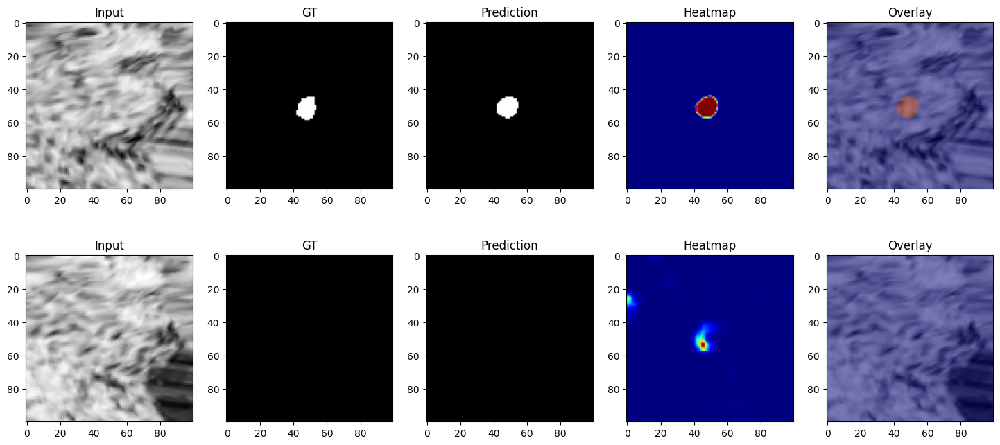


Comparison 2
07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018


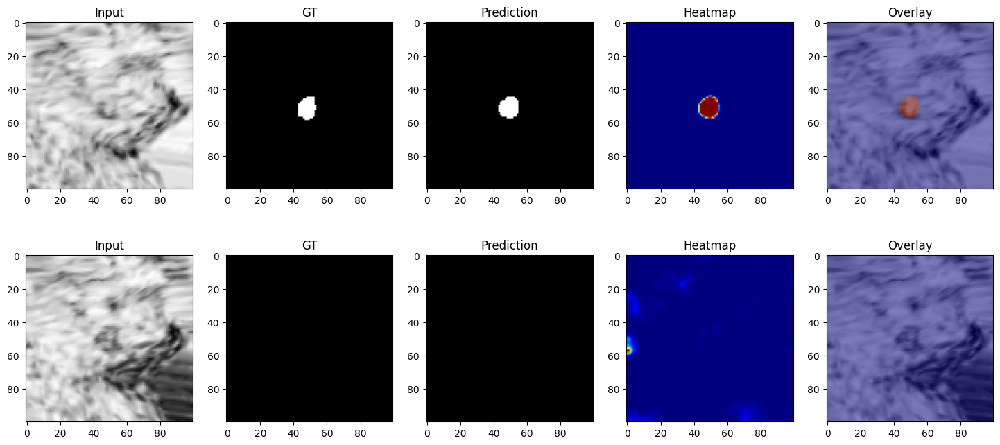



OutsideTheBox

Comparison 1
01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018


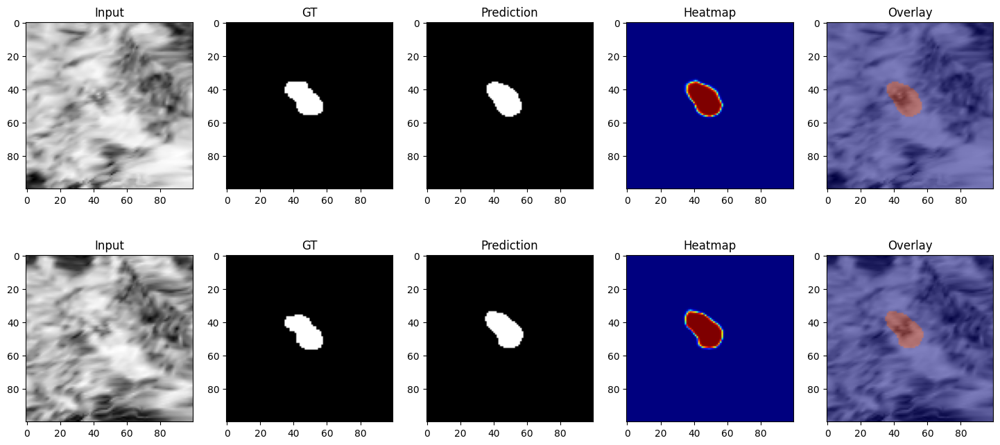


Comparison 2
07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018


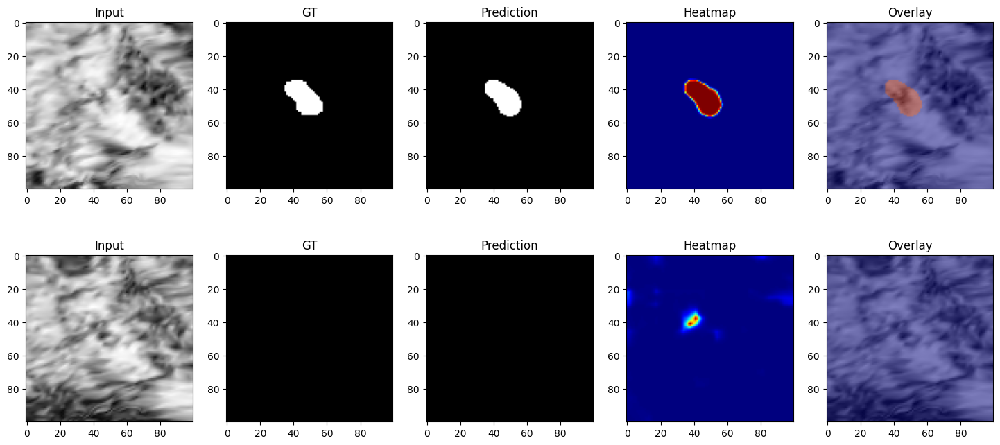



QueyrasPark

Comparison 1
01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018


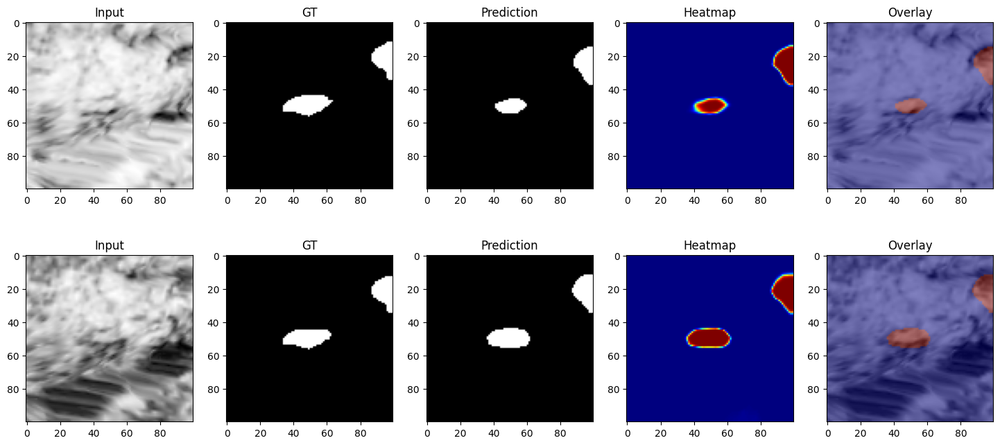


Comparison 2
07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018


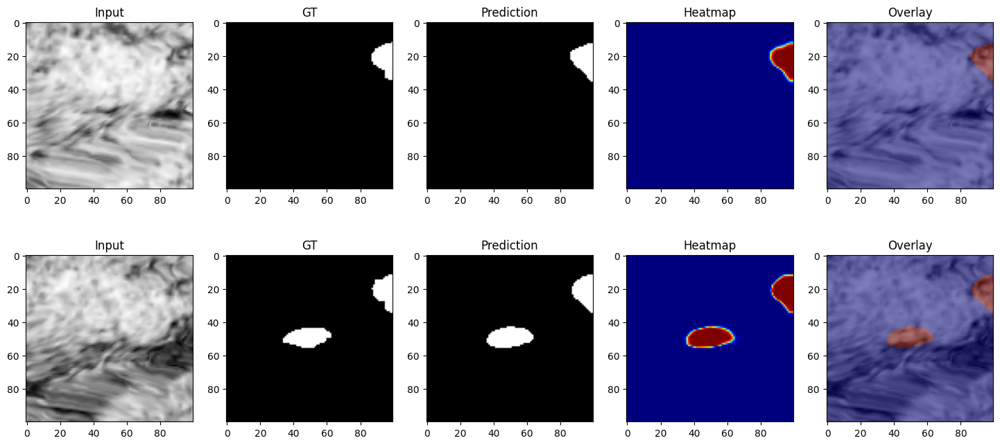



Vanoise

Comparison 1
01Aug2018_19Aug2018 vs 14Jul2018_01Aug2018


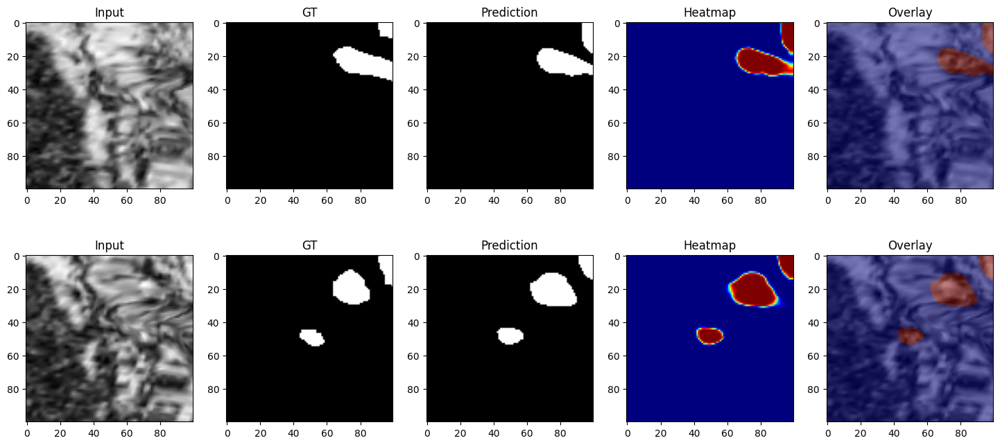


Comparison 2
07Aug2018_25Aug2018 vs 24Sep2018_12Oct2018


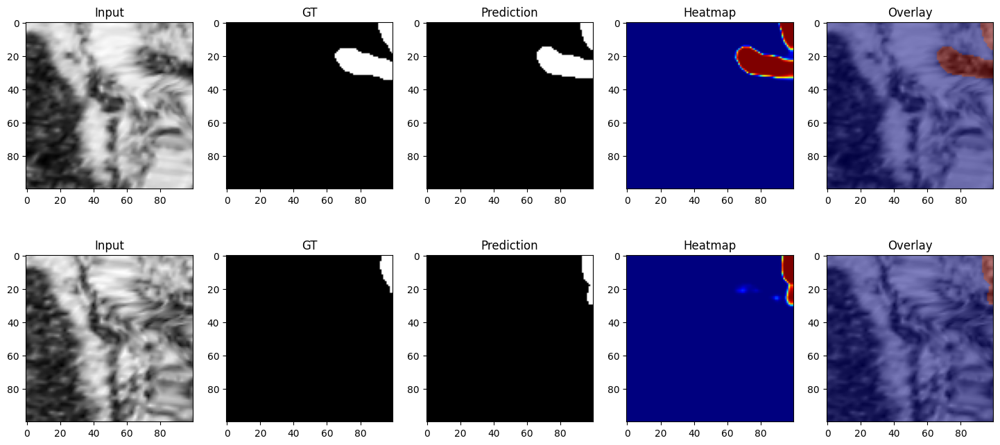

In [96]:
import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import torch

temporal_results = []

for region in regions:

    if region not in selected_pairs_18:

        continue

    print("\n")
    print("="*100)
    print(region)
    print("="*100)

    for pair_id, pair in enumerate(

        selected_pairs_18[region]

    ):

        print()

        print(
            f"Comparison {pair_id+1}"
        )

        print(
            pair[0],
            "vs",
            pair[1]
        )

        selected_images = []

        for target_folder in pair:

            found = False

            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                if (

                    temporal == "18days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    selected_images.append(

                        sample

                    )

                    found = True

                    break

            if not found:

                selected_images.append(
                    None
                )

        fig, ax = plt.subplots(

            2,

            5,

            figsize=(18,8)

        )

        for row, sample in enumerate(

            selected_images

        ):

            if sample is None:

                continue

            temporal, reg, coh_file, phase_file, mask_file = sample

            coherence = tiff.imread(

                coh_file

            ).astype(np.float32)

            phase = tiff.imread(

                phase_file

            ).astype(np.float32)

            gt_mask = tiff.imread(

                mask_file

            ).astype(np.float32)

            cos_phase = np.cos(

                phase

            )

            sin_phase = np.sin(

                phase

            )

            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            for c in range(

                image.shape[0]

            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            pred = (

                prob > 0.5

            ).float()

            pred_np = pred.squeeze().cpu().numpy()

            heatmap = prob.squeeze().cpu().numpy()

            ax[row][0].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][0].set_title(
                "Input"
            )

            ax[row][1].imshow(
                gt_mask,
                cmap="gray"
            )

            ax[row][1].set_title(
                "GT"
            )

            ax[row][2].imshow(
                pred_np,
                cmap="gray"
            )

            ax[row][2].set_title(
                "Prediction"
            )

            ax[row][3].imshow(
                heatmap,
                cmap="jet"
            )

            ax[row][3].set_title(
                "Heatmap"
            )

            ax[row][4].imshow(
                coherence,
                cmap="gray"
            )

            ax[row][4].imshow(

                pred_np,

                cmap="jet",

                alpha=0.5

            )

            ax[row][4].set_title(
                "Overlay"
            )

        plt.show()

# **cell 29C** -  Two-Month Temporal Evolution Metrics Table

In [97]:
import pandas as pd
import numpy as np
import tifffile as tiff
import torch
import os

temporal_analysis = []

for region in regions:

    if region not in selected_pairs_18:

        continue

    for pair_id, pair in enumerate(

        selected_pairs_18[region]

    ):

        pair_metrics = []

        for target_folder in pair:

            sample_found = None

            for sample in dataset.samples:

                temporal, reg, coh_file, phase_file, mask_file = sample

                folder_name = os.path.basename(

                    os.path.dirname(

                        os.path.dirname(
                            coh_file
                        )

                    )

                )

                if (

                    temporal == "18days"

                    and

                    reg == region

                    and

                    folder_name == target_folder

                ):

                    sample_found = sample
                    break

            if sample_found is None:

                continue

            temporal_, reg_, coh_file, phase_file, mask_file = sample_found

            coherence = tiff.imread(
                coh_file
            ).astype(np.float32)

            phase = tiff.imread(
                phase_file
            ).astype(np.float32)

            gt_mask = tiff.imread(
                mask_file
            ).astype(np.float32)

            cos_phase = np.cos(
                phase
            )

            sin_phase = np.sin(
                phase
            )

            image = np.stack(

                [

                    coherence,

                    cos_phase,

                    sin_phase

                ],

                axis=0

            )

            for c in range(
                image.shape[0]
            ):

                image[c] = (

                    image[c]

                    -

                    image[c].mean()

                ) / (

                    image[c].std()

                    +

                    1e-8

                )

            tensor = torch.tensor(

                image,

                dtype=torch.float32

            ).unsqueeze(0).to(device)

            with torch.no_grad():

                output = model(
                    tensor
                )

                prob = torch.sigmoid(
                    output
                )

            pred_mask = (

                prob > 0.5

            ).float()

            pred_np = pred_mask.squeeze().cpu().numpy()

            intersection = np.sum(

                gt_mask

                *

                pred_np

            )

            dice = (

                2 * intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                +

                1e-8

            )

            iou = (

                intersection

            ) / (

                gt_mask.sum()

                +

                pred_np.sum()

                -

                intersection

                +

                1e-8

            )

            precision = intersection / (

                pred_np.sum()

                +

                1e-8

            )

            recall = intersection / (

                gt_mask.sum()

                +

                1e-8

            )

            f1 = (

                2

                *

                precision

                *

                recall

            ) / (

                precision

                +

                recall

                +

                1e-8

            )

            pair_metrics.append(

                [

                    target_folder,

                    coherence.mean(),

                    phase.std(),

                    np.sum(gt_mask > 0.5),

                    np.sum(pred_np > 0.5),

                    dice,

                    iou,

                    f1

                ]

            )

        if len(pair_metrics) == 2:

            temporal_analysis.append(

                [

                    region,

                    pair_id + 1

                ]

                +

                pair_metrics[0]

                +

                pair_metrics[1]

            )

columns = [

    "Region",

    "Comparison",

    "Date A",

    "Coh A",

    "Phase A",

    "GT A",

    "Pred A",

    "Dice A",

    "IoU A",

    "F1 A",

    "Date B",

    "Coh B",

    "Phase B",

    "GT B",

    "Pred B",

    "Dice B",

    "IoU B",

    "F1 B"

]

temporal_df_18 = pd.DataFrame(

    temporal_analysis,

    columns=columns

)

print("="*120)
print("TWO-MONTH TEMPORAL EVOLUTION TABLE")
print("="*120)

display(temporal_df_18)

TWO-MONTH TEMPORAL EVOLUTION TABLE


,Region,Comparison,Date A,Coh A,Phase A,GT A,Pred A,Dice A,IoU A,F1 A,Date B,Coh B,Phase B,GT B,Pred B,Dice B,IoU B,F1 B
0,EcrinPark,1,01Aug2018_19Aug2018,0.677497,2.355025,125,131,0.890625,0.802817,0.890625,14Jul2018_01Aug2018,0.667541,0.752824,0,0,0.000000,0.000000,0.000000
1,EcrinPark,2,07Aug2018_25Aug2018,0.774613,0.475587,121,126,0.890688,0.802920,0.890688,24Sep2018_12Oct2018,0.686153,2.621217,0,0,0.000000,0.000000,0.000000
2,OutsideTheBox,1,01Aug2018_19Aug2018,0.727066,0.389884,302,295,0.924623,0.859813,0.924623,14Jul2018_01Aug2018,0.648624,0.656318,304,321,0.880000,0.785714,0.880000
3,OutsideTheBox,2,07Aug2018_25Aug2018,0.686001,2.741142,311,305,0.938312,0.883792,0.938312,24Sep2018_12Oct2018,0.573734,1.102866,0,0,0.000000,0.000000,0.000000
4,QueyrasPark,1,01Aug2018_19Aug2018,0.809014,1.720627,452,324,0.731959,0.577236,0.731959,14Jul2018_01Aug2018,0.613610,1.087760,437,460,0.914158,0.841889,0.914158
5,QueyrasPark,2,07Aug2018_25Aug2018,0.729411,0.528741,199,210,0.948655,0.902326,0.948655,24Sep2018_12Oct2018,0.622439,0.655298,445,480,0.929730,0.868687,0.929730
6,Vanoise,1,01Aug2018_19Aug2018,0.493347,1.532011,519,492,0.866469,0.764398,0.866469,14Jul2018_01Aug2018,0.429897,1.024584,571,658,0.846216,0.733427,0.846216
7,Vanoise,2,07Aug2018_25Aug2018,0.579753,1.416686,546,536,0.948244,0.901582,0.948244,24Sep2018_12Oct2018,0.509599,1.340660,131,153,0.866197,0.763975,0.866197


# **CELL 29D** -> Automatic Temporal Change Analysis

In [98]:
for i in range(

    len(temporal_df_18)

):

    row = temporal_df_18.iloc[i]

    print("\n")

    print("="*100)

    print(

        f"Region : {row['Region']}"

    )

    print(

        f"Comparison : {row['Comparison']}"

    )

    print("="*100)

    print()

    print(

        f"Date A : {row['Date A']}"

    )

    print(

        f"Date B : {row['Date B']}"

    )

    print()

    coh_change = (

        row["Coh B"]

        -

        row["Coh A"]

    )

    phase_change = (

        row["Phase B"]

        -

        row["Phase A"]

    )

    dice_change = (

        row["Dice B"]

        -

        row["Dice A"]

    )

    iou_change = (

        row["IoU B"]

        -

        row["IoU A"]

    )

    f1_change = (

        row["F1 B"]

        -

        row["F1 A"]

    )

    gt_change = (

        row["GT B"]

        -

        row["GT A"]

    )

    pred_change = (

        row["Pred B"]

        -

        row["Pred A"]

    )

    print(
        f"Coherence Change : {coh_change:.4f}"
    )

    print(
        f"Phase Change     : {phase_change:.4f}"
    )

    print(
        f"GT Area Change   : {gt_change}"
    )

    print(
        f"Pred Area Change : {pred_change}"
    )

    print(
        f"Dice Change      : {dice_change:.4f}"
    )

    print(
        f"IoU Change       : {iou_change:.4f}"
    )

    print(
        f"F1 Change        : {f1_change:.4f}"
    )

    print()

    if coh_change < 0:

        print(
            "Observation: Ground stability decreased over time."
        )

    else:

        print(
            "Observation: Ground remained relatively stable."
        )

    if phase_change > 0:

        print(
            "Observation: Surface deformation increased."
        )

    else:

        print(
            "Observation: Surface deformation reduced."
        )

    if dice_change > 0:

        print(
            "Observation: Segmentation performance improved."
        )

    else:

        print(
            "Observation: Segmentation performance degraded."
        )

    if abs(gt_change) > 0:

        print(
            "Observation: Landslide extent changed over time."
        )

    print()



Region : EcrinPark
Comparison : 1

Date A : 01Aug2018_19Aug2018
Date B : 14Jul2018_01Aug2018

Coherence Change : -0.0100
Phase Change     : -1.6022
GT Area Change   : -125
Pred Area Change : -131
Dice Change      : -0.8906
IoU Change       : -0.8028
F1 Change        : -0.8906

Observation: Ground stability decreased over time.
Observation: Surface deformation reduced.
Observation: Segmentation performance degraded.
Observation: Landslide extent changed over time.



Region : EcrinPark
Comparison : 2

Date A : 07Aug2018_25Aug2018
Date B : 24Sep2018_12Oct2018

Coherence Change : -0.0885
Phase Change     : 2.1456
GT Area Change   : -121
Pred Area Change : -126
Dice Change      : -0.8907
IoU Change       : -0.8029
F1 Change        : -0.8907

Observation: Ground stability decreased over time.
Observation: Surface deformation increased.
Observation: Segmentation performance degraded.
Observation: Landslide extent changed over time.



Region : OutsideTheBox
Comparison : 1

Date A : 01Aug20

# **Download the Best - model**

In [99]:
import os

print("Working Directory Files:\n")

for file in os.listdir("/kaggle/working"):
    print(file)

Working Directory Files:

segformer_best.pth
json
heatmaps
csv
.virtual_documents
Landslide_LLM_Dataset.zip
overlays
predictions
Landslide_LLM_Dataset


# **Creating ZIP files for the Dataset - create one ZIP containing everything.**

In [113]:
import shutil
import os

project_folder = "/kaggle/working/Landslide_LLM_Dataset"

if os.path.exists(project_folder):
    shutil.rmtree(project_folder)

os.makedirs(project_folder)

folders_to_copy = [
    "json",
    "csv",
    "predictions",
    "heatmaps",
    "overlays"
]

for folder in folders_to_copy:
    shutil.copytree(
        f"/kaggle/working/{folder}",
        f"{project_folder}/{folder}"
    )

shutil.copy(
    "/kaggle/working/segformer_best.pth",
    f"{project_folder}/segformer_best.pth"
)

shutil.make_archive(
    project_folder,
    "zip",
    project_folder
)

print("✅ New ZIP Created Successfully")

✅ New ZIP Created Successfully


In [114]:
import os

print("Metadata Records :", len(metadata_list))
print("JSON Files       :", len(os.listdir("/kaggle/working/json")))
print("Prediction Files :", len(os.listdir("/kaggle/working/predictions")))
print("Heatmaps         :", len(os.listdir("/kaggle/working/heatmaps")))
print("Overlays         :", len(os.listdir("/kaggle/working/overlays")))

Metadata Records : 1985
JSON Files       : 1985
Prediction Files : 1985
Heatmaps         : 1985
Overlays         : 1985


In [104]:
import shutil
import os

folders = [
    "/kaggle/working/json",
    "/kaggle/working/predictions",
    "/kaggle/working/heatmaps",
    "/kaggle/working/overlays",
    "/kaggle/working/csv"
]

for folder in folders:
    if os.path.exists(folder):
        shutil.rmtree(folder)

for folder in folders:
    os.makedirs(folder, exist_ok=True)

print("Folders cleaned successfully.")

Folders cleaned successfully.


In [102]:
import os

print("Metadata Records :", len(metadata_list))

print("JSON Files       :", len(os.listdir("/kaggle/working/json")))

print("Prediction Files :", len(os.listdir("/kaggle/working/predictions")))

print("Heatmaps         :", len(os.listdir("/kaggle/working/heatmaps")))

print("Overlays         :", len(os.listdir("/kaggle/working/overlays")))

Metadata Records : 1985
JSON Files       : 2230
Prediction Files : 2230
Heatmaps         : 2230
Overlays         : 2230


In [55]:
print(len(metadata_list))

1985


In [56]:
print(len(os.listdir("/kaggle/working/json")))

245


In [57]:
print(len(os.listdir("/kaggle/working/predictions")))
print(len(os.listdir("/kaggle/working/heatmaps")))
print(len(os.listdir("/kaggle/working/overlays")))

245
245
245


In [58]:
print("Test Dataset Size :", len(test_dataset))

print("Test Loader Batches :", len(test_loader))

print("Batch Size :", test_loader.batch_size)

Test Dataset Size : 1985
Test Loader Batches : 249
Batch Size : 8


In [59]:
total = 0

for images, masks in test_loader:
    total += images.shape[0]

print("Total Images Seen by test_loader :", total)

Total Images Seen by test_loader : 1985


In [103]:
ids = [m["image_id"] for m in metadata_list]

print("Total Image IDs :", len(ids))
print("Unique Image IDs:", len(set(ids)))
print("Duplicate IDs   :", len(ids) - len(set(ids)))

Total Image IDs : 1985
Unique Image IDs: 245
Duplicate IDs   : 1740
